# Audio pattern recognition - Music genre classification - Paolo Cortis

Running experiments with different machine learning models for a multi class music genre classification task.

## Libraries

In [35]:
import os
import cv2
import librosa
from IPython.display import Audio, display
from tqdm import tqdm

import numpy as np
import pandas as pd
import tensorflow as tf

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import RobustScaler

from sklearn.cluster import KMeans

from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import activations, layers, optimizers, losses
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import Sequential
import keras_tuner as kt
from extra_keras_metrics import get_standard_binary_metrics
from sklearn.metrics import accuracy_score, average_precision_score, roc_auc_score
from sklearn.model_selection import StratifiedShuffleSplit, ShuffleSplit

from matplotlib import pyplot as plt
from plot_keras_history import plot_history
import plotly.express as px

In [36]:
sr=22050

## Data Retrieval and feature extraction

In [37]:
def loadData(folder: str) -> dict:
    """ Return different data features from the GTZAN dataset.
    Audio files,
    2 set of features of the audio files (on a 3s and 30s window),
    visual representations of audio files: mfccs (3s window), spectrogram (3s window), mel spectrogram (3s and 30s window).

    Parameters
    ------------------------
    folden: str
        The folder with the GTZAN dataset.
        
    Returns
    ------------------------
    dict
        A dictionary with all the useful GTZAN features and labels."""

    # Retrieve the features (30s window)
    features_30s = pd.read_csv(os.path.join(folder, 'features_30_sec.csv'))

    # Retrieve the features (3s window)
    features_3s = pd.read_csv(os.path.join(folder, 'features_3_sec.csv'))

    audio_folder = os.path.join(folder, 'genres_original')
    images_folder = os.path.join(folder, 'images_original')
    audio = []
    mel_spectrogram_30s = []
    mel_spectrogram_3s = []
    spectrogram = []
    frame_mfccs = []
    frame_labels = []
    labels = []

    for genre in os.listdir(audio_folder):
        # Retrieve audio files
        for fileName in os.listdir(os.path.join(audio_folder, genre)):
            audio_genre_path = os.path.join(audio_folder, genre)
            audioFile,_ = librosa.load(os.path.join(audio_genre_path, fileName), sr=sr)
            if audioFile is not None:
                audio.append(audioFile)
                labels.append(genre)
                
                # Frame 3 seconds windows
                audio_frames = librosa.util.frame(audioFile, frame_length=sr*3, hop_length=sr*3)
                for i in range(audio_frames.shape[1]):
                    mfccs = librosa.feature.mfcc(y=audio_frames[:,i], sr=sr, n_mfcc=20)
                    frame_mfccs.append(mfccs)
                    frame_labels.append(genre)

                    # Spectrogram
                    STFTspectrogram = np.abs(librosa.stft(y=audio_frames[:,i]))
                    spectrogram.append(STFTspectrogram) 
                    
                    # Mel Spectrogram
                    melSpectrogram = librosa.feature.melspectrogram(y=audio_frames[:,i], sr=sr)
                    mel_spectrogram_3s.append(melSpectrogram)
        
        # Retrieve images (mel spectrogram 30s)
        for fileName in os.listdir(os.path.join(images_folder, genre)):
            images_genre_path = os.path.join(images_folder, genre)
            img = cv2.imread(os.path.join(images_genre_path, fileName))
            if img is not None:
                RGBImg = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                grayImg = cv2.cvtColor(RGBImg, cv2.COLOR_RGB2GRAY)
                mel_spectrogram_30s.append(grayImg)

    data = {
    "features_30s": features_30s,
    "features_3s": features_3s,
    "audio": audio,
    "mfccs": frame_mfccs,
    "spectrogram": spectrogram,
    "mel_spectrogram_3s": mel_spectrogram_3s,
    "mel_spectrogram_30s": mel_spectrogram_30s,
    "labels_3s": frame_labels,
    "labels_30s": labels
    }

    return data

In [38]:
folder = 'D:\MachineLearning\Datasets\GTZAN'
data = loadData(folder)

## Data Preprocessing and visualization

In [39]:
# The audio file 'jazz.00054.wav' is known to be corrupted, the file and the 30s mel spectogram image were removed.
data['features_3s'].drop(data['features_3s'][data['features_3s']['filename'].str.startswith('jazz.00054')].index, inplace=True)
data['features_30s'].drop(data['features_30s'][data['features_30s']['filename'].str.startswith('jazz.00054')].index, inplace=True)

In [40]:
data['features_30s'].columns

Index(['filename', 'length', 'chroma_stft_mean', 'chroma_stft_var', 'rms_mean',
       'rms_var', 'spectral_centroid_mean', 'spectral_centroid_var',
       'spectral_bandwidth_mean', 'spectral_bandwidth_var', 'rolloff_mean',
       'rolloff_var', 'zero_crossing_rate_mean', 'zero_crossing_rate_var',
       'harmony_mean', 'harmony_var', 'perceptr_mean', 'perceptr_var', 'tempo',
       'mfcc1_mean', 'mfcc1_var', 'mfcc2_mean', 'mfcc2_var', 'mfcc3_mean',
       'mfcc3_var', 'mfcc4_mean', 'mfcc4_var', 'mfcc5_mean', 'mfcc5_var',
       'mfcc6_mean', 'mfcc6_var', 'mfcc7_mean', 'mfcc7_var', 'mfcc8_mean',
       'mfcc8_var', 'mfcc9_mean', 'mfcc9_var', 'mfcc10_mean', 'mfcc10_var',
       'mfcc11_mean', 'mfcc11_var', 'mfcc12_mean', 'mfcc12_var', 'mfcc13_mean',
       'mfcc13_var', 'mfcc14_mean', 'mfcc14_var', 'mfcc15_mean', 'mfcc15_var',
       'mfcc16_mean', 'mfcc16_var', 'mfcc17_mean', 'mfcc17_var', 'mfcc18_mean',
       'mfcc18_var', 'mfcc19_mean', 'mfcc19_var', 'mfcc20_mean', 'mfcc20_var',
  

In [41]:
# Drop useless columns
data['features_30s'].drop(columns='filename', inplace=True)
data['features_3s'].drop(columns='filename', inplace=True)
data['features_30s'].drop(columns='length', inplace=True)
data['features_3s'].drop(columns='length', inplace=True)

In [42]:
data['features_30s'].shape

(999, 58)

In [43]:
data['features_30s'].head()

,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,3805.839606,9.015054e+05,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,3550.522098,2.977893e+06,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,3042.260232,7.840345e+05,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,2184.745799,1.493194e+06,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,3579.757627,1.572978e+06,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


In [44]:
data['features_3s'].shape

(9980, 58)

In [45]:
data['features_3s'].head()

,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,3714.560359,1.080790e+06,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,3869.682242,6.722448e+05,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,3997.639160,7.907127e+05,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,3568.300218,9.216524e+05,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,3469.992864,6.102111e+05,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


classical


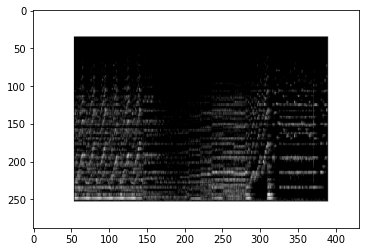

In [46]:
sample = 196
print(data['features_30s']['label'][sample])

plt.imshow(data['mel_spectrogram_30s'][sample], cmap='gray', vmin=0, vmax=255)

audioSample = data['audio'][sample]
Audio(data=audioSample, rate=sr)

### Samples-features ratio
If the number of features is higher than the number of samples the model will behave erratically and overfit.  
* This is a simple check of the samples-features ratio.  
* The result is much higher than 0.

In [47]:
print(f"30s samples-features ratio: {data.get('features_30s').shape[0]/data.get('features_30s').shape[1]}")
print(f"3s samples-features ratio: {data.get('features_3s').shape[0]/data.get('features_3s').shape[1]}")

30s samples-features ratio: 17.224137931034484
3s samples-features ratio: 172.06896551724137


### NaN values
NaN values have a detrimental impact on the performance of the model.  
* This is a simple check of the total number of NaN values in the dataset.

In [48]:
print("NaN values report for 30s features: ")
print(f"Total NaN values: {data['features_30s'].isna().values.sum()} out of {data['features_30s'].values.size} values")
print("-"*85)
print("NaN values report for 3s features: ")
print(f"Total NaN values: {data['features_3s'].isna().values.sum()} out of {data['features_3s'].values.size} values")

NaN values report for 30s features: 
Total NaN values: 0 out of 57942 values
-------------------------------------------------------------------------------------
NaN values report for 3s features: 
Total NaN values: 0 out of 578840 values


### Label encoding

In [49]:
le = LabelEncoder()

labels_30s = pd.DataFrame(le.fit_transform(data['features_30s']['label']))
print(labels_30s.sample(3))
data['features_30s'].drop(columns='label', inplace=True)

print("-"*40)

labels_3s = pd.DataFrame(le.fit_transform(data['features_3s']['label']))
print(labels_3s.sample(3))
data['features_3s'].drop(columns='label', inplace=True)

print("-"*40)

data['labels_30s'] = pd.DataFrame(le.fit_transform(data['labels_30s']))
print(data['labels_30s'].sample(3))

print("-"*40)

data['labels_3s'] = pd.DataFrame(le.fit_transform(data['labels_3s']))
print(data['labels_3s'].sample(3))

     0
920  9
943  9
972  9
----------------------------------------
      0
4928  4
8186  8
6813  6
----------------------------------------
     0
874  8
544  5
87   0
----------------------------------------
      0
1759  1
7696  7
4915  4


### Time Domain

In [50]:
audioSample.shape

(661794,)

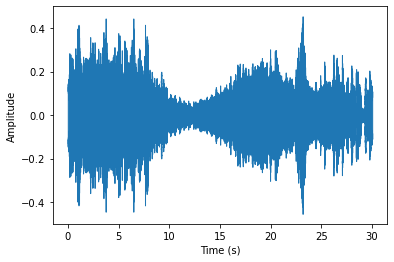

In [51]:
plt.figure()
librosa.display.waveshow(audioSample)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

### Frequency domain
#### Spectrogram, mel spectrogram, Mfccs (3s window)

In [52]:
data['spectrogram'][sample].shape

(1025, 130)

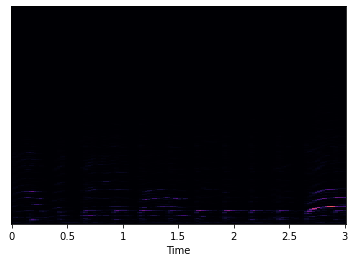

In [53]:
librosa.display.specshow(data['spectrogram'][sample], sr=sr, x_axis='time')

In [54]:
data['mel_spectrogram_3s'][sample].shape

(128, 130)

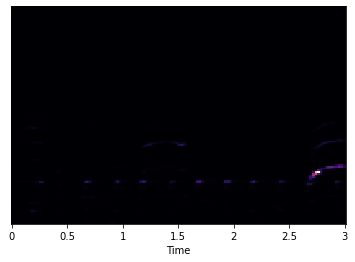

In [55]:
librosa.display.specshow(data['mel_spectrogram_3s'][sample], sr=sr, x_axis='time')

In [56]:
data['mfccs'][sample].shape

(20, 130)

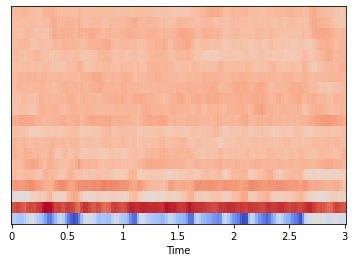

In [57]:
librosa.display.specshow(data['mfccs'][sample], sr=sr, x_axis='time')

Visualizing the data helps to evaluate the difficulty of the task and to design models with the appropiate complexity.

First, a parallel plot showing the value distribution of the main features with respect to the label to determine wheter these features are meaningful for the classification task, and to what extent.

In [58]:
# Main features mean (similar results when considering variance)
features_mean = ['chroma_stft_mean', 'rms_mean', 'spectral_centroid_mean', 'spectral_bandwidth_mean',
            'rolloff_mean', 'zero_crossing_rate_mean', 'harmony_mean', 'perceptr_mean']

fig = px.parallel_coordinates(data['features_30s'], color=np.array(labels_30s).ravel(),
                              dimensions=features_mean,
                              color_continuous_midpoint=5)
fig.show()

In [59]:
# Mfccs mean (similar results when considering variance)
mfccs_mean = ['mfcc1_mean', 'mfcc2_mean', 'mfcc3_mean', 'mfcc4_mean', 'mfcc4_mean', 'mfcc5_mean',
              'mfcc6_mean', 'mfcc7_mean', 'mfcc8_mean', 'mfcc9_mean', 'mfcc10_mean',
              'mfcc11_mean', 'mfcc12_mean', 'mfcc13_mean']

fig = px.parallel_coordinates(data['features_30s'], color=np.array(labels_30s).ravel(),
                              dimensions=mfccs_mean,
                              color_continuous_midpoint=5)
fig.show()

Next the PCA data decomposition technique is used to reduce the high dimensional dataset into fewer dimensions (two), while preserving spatial characteristics for visualization purposes.

#### PCA
Technique to reduce the dimensionality of a dataset by linearly transforming the data into a new coordinate system where the variation in the data can be described with fewer dimensions than the initial data while preserving most of the original data variation.

The following is a visualization of the feature space considering the features apart from mfccs as well as mfccs only.  

The simple clustering algorithm **K-means** is also applied to evaluate the task difficulty and the feature space.

In [11]:
from sklearn.decomposition import PCA

def get_pca_decomposition(
    X: pd.DataFrame
) -> pd.DataFrame:
    """Return the 2D PCA decomposition of the given data."""
    
    return pd.DataFrame(
        PCA(n_components=2).fit_transform(X.values),
        index=X.index
    )

In [12]:
def reshape(data,shape):
    """Return the data reshaped."""
    
    data = data.reshape(shape)
    #data = np.expand_dims(data,axis=-1)
    return data

In [28]:
decomposed_features = np.array(get_pca_decomposition(data['features_3s'][features_mean]))
print(f"PCA decomposition: 3s window features data shape: {decomposed_features.shape}")

reshaped_mfccs = [reshape(x, (2600,1)) for x in data['mfccs']]
reshaped_mfccs = np.squeeze(np.array(reshaped_mfccs))
decomposed_mfccs = np.array(get_pca_decomposition(pd.DataFrame(reshaped_mfccs)))
print(f"PCA decomposition: mfccs data shape: {decomposed_mfccs.shape}")

PCA decomposition: 3s window features data shape: (9980, 2)
PCA decomposition: mfccs data shape: (9981, 2)


In [29]:
kMeans_features = KMeans(n_clusters = 10, random_state = 42).fit(decomposed_features)
kMeans_mfccs = KMeans(n_clusters = 10, random_state = 42).fit(decomposed_mfccs)

predictions_features = kMeans_features.fit_predict(decomposed_features)
predictions_mfccs = kMeans_mfccs.fit_predict(decomposed_mfccs)

- 3s window features visualization -


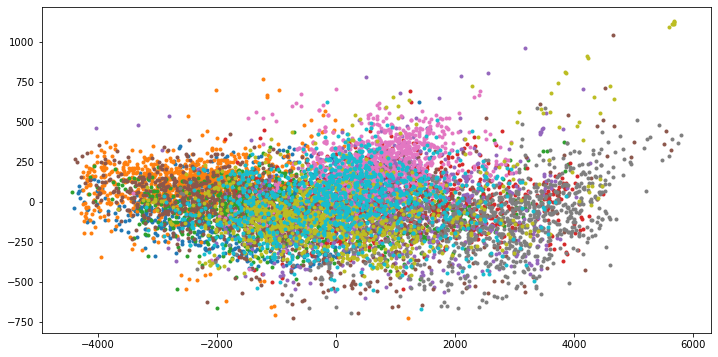

- K-means predictions -


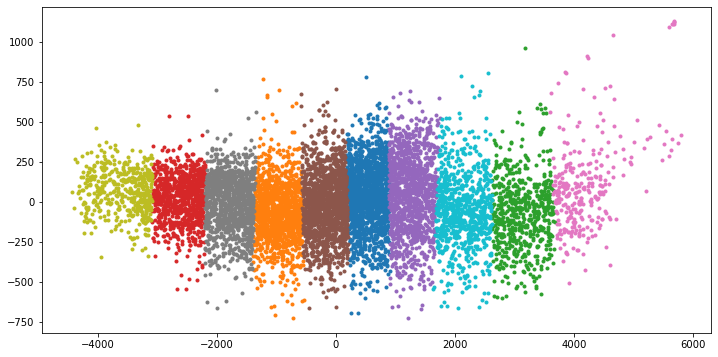

----------------------------------------------------------------------------------------------------
- 3s window mfccs visualization -


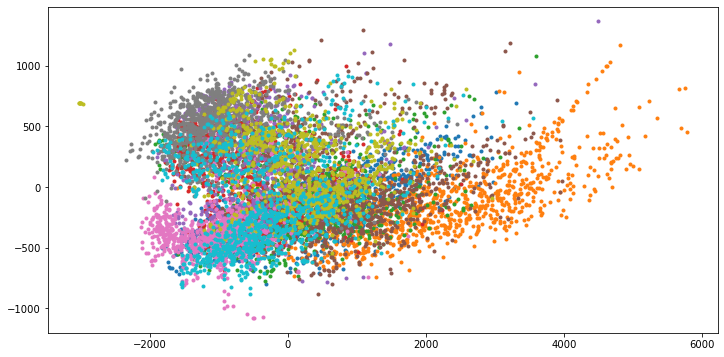

- K-means predictions -


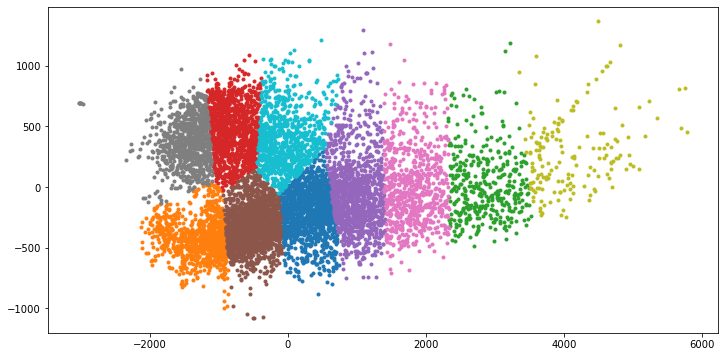

----------------------------------------------------------------------------------------------------


In [30]:
labels = np.unique(labels_3s)

for decomposed_data, ground_truth, predictions in ((decomposed_features, labels_3s, predictions_features), (decomposed_mfccs, data['labels_3s'], predictions_mfccs)):    
    if np.array_equal(decomposed_data, decomposed_features):
        print("- 3s window features visualization -")
    else:
        print("- 3s window mfccs visualization -")
    plt.figure(figsize=(12,6))
    for l in labels:
        plt.scatter(decomposed_data[np.squeeze(ground_truth == l), 0], decomposed_data[np.squeeze(ground_truth == l), 1], label = l, marker = ".")
    plt.show()

    print("- K-means predictions -")
    plt.figure(figsize=(12,6))
    for l in labels:
        plt.scatter(decomposed_data[predictions == l, 0], decomposed_data[predictions == l, 1], label = l, marker =".")
    plt.show()
    
    print("-"*100)

In [31]:
from sklearn.metrics import mutual_info_score
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import silhouette_score

print("K-means performance on features a part from mfccs:")
mif_features = mutual_info_score(np.squeeze(np.array(labels_3s)), predictions_features)
print(f"Mutual info score:   {mif_features}")
ars_features = adjusted_rand_score(np.squeeze(np.array(labels_3s)), predictions_features)
print(f"Adjusted rand score: {ars_features}")
silhouette_features = silhouette_score(np.array(labels_3s), predictions_features)
print(f"Silhouette score:    {silhouette_features}")
MSE_features = mean_squared_error(np.squeeze(np.array(labels_3s)), predictions_features)
print(f"Mean squared error:  {MSE_features}")

print("-"*40)

print("K-means performance on mfccs:")
mif_mfccs = mutual_info_score(np.squeeze(np.array(data['labels_3s'])), predictions_mfccs)
print(f"Mutual info score:   {mif_mfccs}")
ars_mfccs = adjusted_rand_score(np.squeeze(np.array(data['labels_3s'])), predictions_mfccs)
print(f"Adjusted rand score: {ars_mfccs}")
silhouette_mfccs = silhouette_score(data['labels_3s'], predictions_mfccs)
print(f"Silhouette score:    {silhouette_mfccs}")
MSE_mfccs = mean_squared_error(np.squeeze(np.array(data['labels_3s'])), predictions_mfccs)
print(f"Mean squared error:  {MSE_mfccs}")

K-means performance on features a part from mfccs:
Mutual info score:   0.36924631327385926
Adjusted rand score: 0.06948465229335508
Silhouette score:    -0.3345990353688898
Mean squared error:  18.009819639278557
----------------------------------------
K-means performance on mfccs:
Mutual info score:   0.4850546245740776
Adjusted rand score: 0.10482089465103901
Silhouette score:    -0.308158151738995
Mean squared error:  15.191764352269312


#### Boruta Feature Selection
The algorithm gives a numerical estimate of the feature importance and categorizes features in those to keep, those to discard and tentative, meaning that there is uncertainty regarding their actual correlation with the output. In this case it's used to evaluate features and determine if some are not useful for the task at hand.

In [115]:
from boruta import BorutaPy
from sklearn.ensemble import RandomForestClassifier
from multiprocessing import cpu_count

In [116]:
def boruta_feature_selection(
    data: pd.DataFrame,
    labels: pd.DataFrame,
    max_iter: int = 100
) -> pd.DataFrame:
    """ Return the features that the Boruta algorithm found to be correlated with the output (useful/to keep).
    
    Parameters
    ------------------------
    data: pd.DataFrame
        The data reserved for the input of the training of the Boruta model.
    labels: pd.DataFrame
        The data reserved for the output of the training of the Boruta model.
    max_iter: int = 100
        The number of iterations to run Boruta for.

    Returns
    ------------------------
    list: list
        The list of correlated features."""
    
    # Create the Boruta model
    boruta_selector = BorutaPy(
        RandomForestClassifier(n_jobs=cpu_count(), class_weight='balanced', max_depth=5),
        n_estimators = 'auto',
        verbose = 2,
        alpha = 0.05,
        max_iter = max_iter,
        random_state = 42
    )
    # Fit the Boruta model
    boruta_selector.fit(data.values, labels.values.ravel())
    
    # Get the kept features and discarded features
    kept_features = list(data.columns[boruta_selector.support_])
    discarted_features = list(data.columns[~boruta_selector.support_])

    print(f"-- {len(kept_features)} Kept (correlated) features [Boruta]")
    print(f"-- {len(discarted_features)} Discarted (uncorrelated) features [Boruta]")
    
    return kept_features

In [121]:
useful = boruta_feature_selection(data['features_3s'], pd.DataFrame(labels_3s))
print("-"*50)
if (useful == list(data['features_3s'].columns)):
    print(f"The Boruta algorithm found all features to be useful for the task")
else:
    print(f"The Boruta algorithm found some features to be useless for the task")

Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	57
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	57
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	57
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	57
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	57
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	57
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	57
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	57
Tentative: 	0
Rejected: 	0


BorutaPy finished running.

Iteration: 	9 / 100
Confirmed: 	57
Tentative: 	0
Rejected: 	0
-- 57 Kept (correlated) features [Boruta]
-- 0 Discarted (uncorrelated) features [Boruta]
--------------------------------------------------
The Boruta algorithm found all features to be useful for the task


### Normalization via robust scaler
Data normalization is proven to improve the performance of models.  
The robust scaler operates normalization subtracting the median and dividing by the standard deviation between the interquantile range. This is operates a z-scoring while being robust to outliers.
* This is a simple function applying robust scaling to the data. 
* The result is the dataframe with normalized data.

In [13]:
def robust_scaler(df: pd.DataFrame) -> pd.DataFrame:
    """ Return the provided dataframe normalized using robust z-scoring.
    
    Parameters
    ------------------------
    df: pd.DataFrame
        The dataframe to normalize.

    Returns
    ------------------------
    pd.DataFrame
        The dataframe normalized."""
    
    return pd.DataFrame(
        RobustScaler().fit_transform(df.values),
        columns=df.columns,
        index=df.index
    )

In [17]:
scaled_features_30s = robust_scaler(data['features_30s'])
scaled_features_3s = robust_scaler(data['features_3s'])
data['features_30s'] = scaled_features_30s
data['features_3s'] = scaled_features_3s

In [18]:
data['features_30s'].describe()

,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
count,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,...,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000
mean,-0.037851,-0.031300,0.097015,0.469553,-0.006729,0.305898,0.031691,0.218046,-0.039926,0.206666,...,-0.010478,0.268226,0.014922,0.231580,-0.031134,0.266441,0.013267,0.238869,0.014208,0.255608
std,0.702300,0.863431,0.737525,1.378834,0.672089,0.935415,0.784113,0.839954,0.731226,0.798173,...,0.735674,1.077925,0.714467,0.978579,0.753685,1.025252,0.778901,1.007156,0.819708,1.054486
min,-1.816241,-4.693609,-1.312989,-0.685980,-1.538638,-0.771683,-1.970585,-0.880878,-1.814857,-0.817495,...,-2.715621,-1.376913,-2.067992,-1.191448,-2.460066,-1.172136,-3.339178,-1.189867,-4.007472,-1.192744
25%,-0.545768,-0.482841,-0.400065,-0.330872,-0.547217,-0.360159,-0.467832,-0.388631,-0.593617,-0.393220,...,-0.494484,-0.382358,-0.494247,-0.405575,-0.522549,-0.383866,-0.472161,-0.425662,-0.471549,-0.391029
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.454232,0.517159,0.599935,0.669128,0.452783,0.639841,0.532168,0.611369,0.406383,0.606780,...,0.505516,0.617642,0.505753,0.594425,0.477451,0.616134,0.527839,0.574338,0.528451,0.608971
max,2.411676,2.397530,3.094722,9.808043,2.088906,6.293162,1.918358,5.073482,1.865680,4.022762,...,1.966018,10.863628,2.439651,10.264686,2.866132,8.284885,3.541748,9.092044,3.529839,10.417365


### Feature selection
Feature selection implies the choice of a subset of the original pool of features.  
This is a useful step as irrelevant or partially relevant features can negatively impact the model performance, hence feature selection reduces noise, improves model accuracy and reduces training time by cutting the total number of features.

#### Correlation with the output tests

Features not correlated with the output do not carry relevan information for the model to exploit for the task at hand. These can be removed.

* Pearson: identifies linear correlation between each feature and the output.
* Spearman: identifies monotonic correlation between each feature and the output.
* Maximal information coefficient (Mic): identifies non-linear correlation between each feature and the output.

In the following section functions are defined and ran for each of these tests over the entire dataset. This is done here just for explanatory purposes, in fact the resulting correlated features are not dropped from the dataset as this would introduce **bias** due to **data leakage**. Instead these tests are saved for the training "main loop" and ran, for each holdout, over the training portion of the data only, maintaining test data unseen and reserving it for actual testing.

In [14]:
from scipy.stats import pearsonr
from scipy.stats import spearmanr
from minepy import MINE

from scipy.stats import entropy

In [20]:
p_value_threshold = 0.01
correlation_threshold = 0.05

#### Pearson correlation test
* This is a check for linear correlation between each feature and the label considering the p-value of the Pearson test.
* The result is a list of the features uncorrelated with the output (useless/to be dropped).

In [21]:
def get_pearson_uncorrelated(
    data: pd.DataFrame,
    labels: pd.DataFrame,
    p_value_threshold: float = 0.01
) -> list:
    """ Return the list of features that the Pearson correlation test found to be uncorrelated with the labels.
    
    Parameters
    ------------------------
    data: pd.DataFrame
        The dataset.
    labels: pd.dataFrame
        The data labels.
    p_value_threshold: float = 0.01
        The minimum p-value required to consider a feature uncorrelated.

    Returns
    ------------------------
    list: list
        The list of uncorrelated features."""

    uncorrelated_features = []

    for feature in (data.columns):
        correlation, p_value = pearsonr(data[feature].values.ravel(), labels.values.ravel())
        if p_value > p_value_threshold:
            if feature not in uncorrelated_features:
                uncorrelated_features.append(feature)

    return uncorrelated_features

In [33]:
print("-- Just for explanatory purpose --")
uncorrelated_features_pearson_30s = get_pearson_uncorrelated(data['features_30s'], labels_30s)
uncorrelated_features_pearson_3s = get_pearson_uncorrelated(data['features_3s'], labels_3s)

print(f"30s window: features not correlated with the output: [Pearson]\n{uncorrelated_features_pearson_30s}")
print("-"*80)
print(f"3s window: features not correlated with the output: [Pearson]\n{uncorrelated_features_pearson_3s}")                      

-- Just for explanatory purpose --
30s window: features not correlated with the output: [Pearson]
['harmony_mean', 'perceptr_mean', 'tempo', 'mfcc1_var', 'mfcc2_var', 'mfcc3_mean', 'mfcc3_var', 'mfcc4_mean', 'mfcc5_mean', 'mfcc5_var', 'mfcc6_mean', 'mfcc8_var', 'mfcc9_var', 'mfcc10_var', 'mfcc13_mean', 'mfcc15_mean', 'mfcc16_mean', 'mfcc17_mean', 'mfcc19_mean']
--------------------------------------------------------------------------------
3s window: features not correlated with the output: [Pearson]
['tempo', 'mfcc10_var', 'mfcc17_mean', 'mfcc19_mean']


#### Spearman correlation test
* This is a check for monotonic correlation between each feature and the label considering the p-value of the Spearman test.
* The result is a list of the features uncorrelated with the output (useless/to be dropped).

In [22]:
def get_spearman_uncorrelated(
    data: pd.DataFrame,
    labels: pd.DataFrame,
    p_value_threshold: float = 0.01
) -> list:
    """ Return the list of features that the Spearman correlation test found to be uncorrelated with the labels.
    
    Parameters
    ------------------------
    data: pd.DataFrame
        The dataset.
    labels: pd.dataFrame
        The data labels.
    p_value_threshold: float = 0.01
        The minimum p-value required to consider a feature uncorrelated.

    Returns
    ------------------------
    list: list
        The list of uncorrelated features."""
    
    uncorrelated_features = []

    for feature in (data.columns):
        correlation, p_value = spearmanr(data[feature].values.ravel(), labels.values.ravel())
        if p_value > p_value_threshold:
            if feature not in uncorrelated_features:
                uncorrelated_features.append(feature)

    return uncorrelated_features

In [35]:
print("-- Just for explanatory purpose --")
uncorrelated_features_spearman_30s = get_spearman_uncorrelated(data['features_30s'], labels_30s)
uncorrelated_features_spearman_3s = get_spearman_uncorrelated(data['features_3s'], labels_3s)

print(f"30s window: features not correlated with the output: [Spearman]\n{uncorrelated_features_spearman_30s}")
print("-"*80)
print(f"3s window: features not correlated with the output: [Spearman]\n{uncorrelated_features_spearman_3s}")                      

-- Just for explanatory purpose --
30s window: features not correlated with the output: [Spearman]
['chroma_stft_var', 'harmony_mean', 'perceptr_mean', 'tempo', 'mfcc1_var', 'mfcc2_var', 'mfcc3_mean', 'mfcc4_mean', 'mfcc5_mean', 'mfcc5_var', 'mfcc7_var', 'mfcc8_var', 'mfcc9_var', 'mfcc10_var', 'mfcc13_mean', 'mfcc14_mean', 'mfcc15_mean', 'mfcc16_mean', 'mfcc17_mean', 'mfcc19_mean']
--------------------------------------------------------------------------------
3s window: features not correlated with the output: [Spearman]
['tempo', 'mfcc16_mean', 'mfcc17_mean', 'mfcc19_mean']


In [36]:
print("-- Just for explanatory purpose --")
uncorrelated_features_30s = uncorrelated_features_pearson_30s + uncorrelated_features_spearman_30s
uncorrelated_features_3s = uncorrelated_features_pearson_3s + uncorrelated_features_spearman_3s
uncorrelated_features_30s = list(set(uncorrelated_features_30s))
uncorrelated_features_3s = list(set(uncorrelated_features_3s))

print(f"30s window: currently there are {len(uncorrelated_features_30s)} uncorrelated features with the output:\n{uncorrelated_features_30s}" )
print("-"*80)
print(f"3s window: currently there are {len(uncorrelated_features_3s)} uncorrelated features with the output:\n{uncorrelated_features_3s}" )

-- Just for explanatory purpose --
30s window: currently there are 22 uncorrelated features with the output:
['mfcc13_mean', 'perceptr_mean', 'mfcc14_mean', 'mfcc5_var', 'mfcc16_mean', 'mfcc15_mean', 'mfcc2_var', 'mfcc7_var', 'chroma_stft_var', 'mfcc5_mean', 'mfcc4_mean', 'mfcc3_var', 'mfcc9_var', 'tempo', 'mfcc19_mean', 'harmony_mean', 'mfcc10_var', 'mfcc3_mean', 'mfcc17_mean', 'mfcc8_var', 'mfcc1_var', 'mfcc6_mean']
--------------------------------------------------------------------------------
3s window: currently there are 5 uncorrelated features with the output:
['mfcc10_var', 'mfcc17_mean', 'mfcc16_mean', 'tempo', 'mfcc19_mean']


#### Maximal information coefficient
* This is a check for all features found to be uncorrelated via the Pearson and Spearman tests to determine whether these features are actually uncorrelated with the output via the Maximal information score which checks also for non-linear correlations.
* The result is a list of the features **actually** uncorrelated with the output (useless/to be dropped).

In [23]:
def get_mic_uncorrelated(
    data: pd.DataFrame,
    labels: pd.DataFrame,
    features_to_check: list,
    correlation_threshold: float = 0.05
) -> list:
    """ Return the list of features that the MIC correlation test confirmed to be uncorrelated with the labels.
    
    Parameters
    ------------------------
    data: pd.DataFrame
        The dataset.
    labels: pd.dataFrame
        The data labels.
    features_to_check: list
        The list of features to check with the MIC correlation test.
    correlation_threshold: float = 0.05
        The maximum correlation value required to consider a feature uncorrelated.

    Returns
    ------------------------
    list: list
        The list of uncorrelated features."""
    
    uncorrelated_features = []

    for feature in (features_to_check):
        mine = MINE()
        mine.compute_score(data[feature].values.ravel(), labels.values.ravel())
        score = mine.mic()
        if score < correlation_threshold:
            uncorrelated_features.append(feature)

    return uncorrelated_features

In [38]:
print("-- Just for explanatory purpose --")
uncorrelated_features_mic_30s = get_mic_uncorrelated(data['features_30s'], labels_30s, uncorrelated_features_30s)
uncorrelated_features_mic_3s = get_mic_uncorrelated(data['features_3s'], labels_3s, uncorrelated_features_3s)

print(f"30s window: features not correlated with the output: [Confirmed via MIC]\n{uncorrelated_features_mic_30s}")
print("-"*80)
print(f"3s window: features not correlated with the output: [Confirmed via MIC]\n{uncorrelated_features_mic_3s}")                      

-- Just for explanatory purpose --
30s window: features not correlated with the output: [Confirmed via MIC]
[]
--------------------------------------------------------------------------------
3s window: features not correlated with the output: [Confirmed via MIC]
[]


#### Drop feature uncorrelated with the output

In [24]:
def uncorrelated_features_test(
    data: pd.DataFrame,
    labels: pd.DataFrame,
    p_value_threshold: float = 0.01,
    correlation_threshold: float = 0.05
) -> list:
    """ Return the list of features that the Pearson+Spearman+Mic correlation tests found to be uncorrelated with the output.
    
    Parameters
    ------------------------
    data: pd.DataFrame
        The dataset.
    labels: pd.dataFrame
        The data labels.
    p_value_threshold: float = 0.01
        The minimum p-value required to consider a feature uncorrelated.
    correlation_threshold: float = 0.05
        The maximum correlation value required to consider a feature uncorrelated.

    Returns
    ------------------------
    list: list
        The list of uncorrelated features."""
    
    uncorrelated_features = []
    
    #Pearson
    uncorrelated_features += get_pearson_uncorrelated(data, labels, p_value_threshold)
    
    #Spearman
    uncorrelated_features += get_spearman_uncorrelated(data, labels, p_value_threshold)
    
    uncorrelated_features = list(set(uncorrelated_features))
    print(f"-- {len(uncorrelated_features)} Uncorrelated features: [Pearson+Spearman]\n{uncorrelated_features}")
    
    actually_uncorrelated_features = uncorrelated_features
    
    #Mic
    actually_uncorrelated_features = get_mic_uncorrelated(data, labels, uncorrelated_features, correlation_threshold)
    print(f"-- Actually uncorrelated features: [confirmed via MIC]\n{actually_uncorrelated_features}")
    
    return actually_uncorrelated_features

#### Correlation with the features tests
Features correlated with each other carry the same kind of information. These can be removed.

#### Pearson correlation test
Identifies linear correlation between features.

* This is a check for linear correlation within the features considering the p-value and correlation of the Pearson test.
* The result is a list of the features uncorrelated with the output (useless/to be dropped).  
  When two features are correlated the one with the lowest entropy is dropped.

In [25]:
def correlated_features_test(
    data: pd.DataFrame,
    p_value_threshold: float = 0.01,
    correlation_threshold: float = 0.97
) -> list:
    """ Return the features that the Pearson correlation tests found to be correlated with other features.
    
    Parameters
    ------------------------
    data: pd.DataFrame
        The dataset.
    p_value_threshold: float = 0.01
        The maximum p-value required to consider a feature correlated.
    correlation_threshold: float = 0.97
        The minimum correlation value required to consider a feature correlated.

    Returns
    ------------------------
    list: list
        The list of correlated features."""
    
    correlated_features = []
    
    #Pearson
    for i, feature1 in (enumerate(data.columns)):
        for feature2 in data.columns[i+1:]:
            correlation, p_value = pearsonr(data[feature1].values.ravel(), data[feature2].values.ravel())
            correlation = np.abs(correlation)
            if p_value < p_value_threshold and correlation > correlation_threshold:
                if entropy(data[feature1]) > entropy(data[feature2]):
                    correlated_features.append(feature2)
                else:
                    correlated_features.append(feature1)
    
    correlated_features = list(set(correlated_features))
    print(f"-- {len(correlated_features)} Correlated features: [Pearson]\n{correlated_features}")
    
    return correlated_features

In [46]:
print("-- Just for explanatory purpose --")
correlated_features_30s = correlated_features_test(data['features_30s'])
correlated_features_3s = correlated_features_test(data['features_3s'])

-- Just for explanatory purpose --
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']


### One hot encoding labels

In [15]:
def one_hot_encoding(
    labels: pd.DataFrame,
    num_classes: int
) -> pd.DataFrame:
    """ Return the labels encoded with one-hot encoding.
    
    Parameters
    ------------------------
    labels: pd.DataFrame
        The labels to be one-hot encoded.
    num_classes: int
        The number of classes.

    Returns
    ------------------------
    pd.DataFrame: pd.DataFrame
        The one-hot encoded labels."""
    
    return pd.DataFrame(to_categorical(labels, num_classes))

In [41]:
print("-- Just for explanatory purpose --")
encoded_features_30s = one_hot_encoding(labels_30s, 10)
encoded_features_30s.sample(5)

-- Just for explanatory purpose --


,0,1,2,3,4,5,6,7,8,9
58,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
919,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
874,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
593,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
81,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Learning

The technique used to generate the holdouts for the evaluation of the various architectures is the **stratified Monte-Carlo** method, producing each time a different arrangement of the *training*, *validation* and *testing* set, while keeping roughly the same class balance.

10 holdouts are considered to train and evaluate each model, 20% of the whole dataset is used for testing, 80% for training where 20% of it is reserved for the validation of the meta-model.

To avoid increasing excessively the computational complexity of the main training loop, the hyperparameter tuning step is performed, for all holdouts, considering a **single** split of the training set in a training and validation portion.

In [16]:
number_of_splits = 10

holdouts_generator = StratifiedShuffleSplit(
    n_splits = number_of_splits,
    test_size = 0.2,
    random_state = 42
)

In [17]:
number_of_splits_tuning = 1

holdouts_generator_tuning = StratifiedShuffleSplit(
    n_splits = number_of_splits_tuning,
    test_size = 0.2,
    random_state = 42
)

In [18]:
def train_model(
    model: tf.keras.Model,
    x_train: np.ndarray,
    x_test: np.ndarray,
    y_train: np.ndarray,
    y_test: np.ndarray,
    epochs: int,
    batch_size: int
):
    """ Train the model and return the performance metrics (accuracy, AUROC, AUPRC) for train and test and the training history.
    
    Parameters
    ------------------------
    model: tf.keras.Model
        The model to train.
    x_train: np.ndarray
        The input data for training.
    x_test: np.ndarray
        The input data for testing.
    y_train: np.ndarray
        The labels of the input data for training.
    y_test: np.ndarray
        The labels of the input data for testing.
    epochs: int
        The number of times the learning algorithm works through the dataset.
    batch_size: int
        The number of samples to work through before updating the model.

    Returns
    ------------------------
    The performance metrics and history of the model."""
    
    model_history = model.fit(
        x_train, y_train,
        validation_data = (x_test, y_test),
        epochs = epochs,
        batch_size = batch_size,
        callbacks = [EarlyStopping("val_loss", patience=2)]
    )

    train_evaluation = model.evaluate(x_train, y_train, return_dict=True)
    test_evaluation = model.evaluate(x_test, y_test, return_dict=True)
    
    metrics = {"train_evaluation": train_evaluation, "test_evaluation": test_evaluation}
    
    return metrics, model_history

#### Evaluate a model
Next are a set of functions to **evaluate** and **visualize** the performances of models.

To have a statistically sound estimate of an architecture performance, multiple models are built and trained, each with the same architecture, over different portions of the data (holdouts) and, the **average** performance of those, is considered as an estimate of the overall performance of the architecture.

In [19]:
def model_metrics_holdout_estimate(
    model_metrics: list,
    holdout_total_number: int
) -> dict[str, float]:
    """ Return the average metrics (accuracy, AUROC, AUPRC) of the model accross all the holdouts for train and test.
    
    Parameters
    ------------------------
    model_metrics: list
        The list with the train/test metrics (accuracy, AUROC, AUPRC) for all the holdouts.
    holdout_total_number: int
        The number of total holdouts.

    Returns
    ------------------------
    dict: dict[str, float]
        The average metrics of the model accross all the holdouts for train and test."""
    
    total_accuracy_train = 0
    total_accuracy_test = 0
    total_AUROC_train = 0
    total_AUROC_test = 0
    total_AUPRC_train = 0
    total_AUPRC_test = 0

    for holdout in model_metrics:
        total_accuracy_train += holdout["train_evaluation"]['accuracy']
        total_AUROC_train += holdout["train_evaluation"]['AUROC']
        total_AUPRC_train += holdout["train_evaluation"]['AUPRC']

    for holdout in model_metrics:
        total_accuracy_test += holdout["test_evaluation"]['accuracy']
        total_AUROC_test += holdout["test_evaluation"]['AUROC']
        total_AUPRC_test += holdout["test_evaluation"]['AUPRC']

    avg_accuracy_train = total_accuracy_train / holdout_total_number
    avg_accuracy_test = total_accuracy_test / holdout_total_number
    avg_AUROC_train = total_AUROC_train / holdout_total_number
    avg_AUROC_test = total_AUROC_test / holdout_total_number
    avg_AUPRC_train = total_AUPRC_train / holdout_total_number
    avg_AUPRC_test = total_AUPRC_test / holdout_total_number

    return {
        'accuracy_train': avg_accuracy_train,
        'accuracy_test': avg_accuracy_test,
        'AUROC_train': avg_AUROC_train,
        'AUROC_test': avg_AUROC_test,
        'AUPRC_train': avg_AUPRC_train,
        'AUPRC_test': avg_AUPRC_test,
    }

In [20]:
def plot_train_history(model_history):
    """ Plots the metrics (accuracy, AUROC, AUPRC) of the model across the epochs and for each holdout.
    
    Parameters
    ------------------------
    model_history: history
        The training record of the model."""

    for i in range(len(model_history)):
        fig = plt.figure(figsize=(12.7,4.51))
        fig.suptitle(str(i+1) + " Holdout")
        
        # Accuracy
        plt.subplot(1,3,1)
        plt.plot(model_history[i].history['accuracy'])
        plt.plot(model_history[i].history['val_accuracy'])
        plt.title('Accuracy')
        plt.ylabel('accuracy')
        plt.xlabel('epoch')
        plt.legend(['train', 'test'], loc='upper left')
        
        # AUROC
        plt.subplot(1,3,2)
        plt.plot(model_history[i].history['AUROC'])
        plt.plot(model_history[i].history['val_AUROC'])
        plt.title('AUROC')
        plt.ylabel('AUROC')
        plt.xlabel('epoch')
        plt.legend(['train', 'test'], loc='upper left')
        
        # AUPRC
        plt.subplot(1,3,3)
        plt.plot(model_history[i].history['AUPRC'])
        plt.plot(model_history[i].history['val_AUPRC'])
        plt.title('AUPRC')
        plt.ylabel('AUPRC')
        plt.xlabel('epoch')
        plt.legend(['train', 'test'], loc='upper left')

        plt.subplots_adjust(wspace=0.3)
        plt.show()

#### Hyperparameter tuning
Hyperparameter tuning is performed training a meta model over training and validation data to obtain the best set of hyperparameters via **Bayesian optimization**.

Here is the function to **train** the hypermodel.

In [21]:
def hyperparameter_tuning(
    x_train: np.ndarray,
    x_validation: np.ndarray,
    y_train: np.ndarray,
    y_validation: np.ndarray,
    hypermodel: tf.keras.Model,
    name: str,
    directory: str,
    max_trials: int = 10,
    epochs: int = 50,
    batch_size: int = 128
):
    """ Tunes the hypermodel with bayesian optiomization and returns the best set of hyperparameters.
    
    Parameters
    ------------------------
    x_train: np.ndarray
        The input data for training the hypermodel.
    x_validation: np.ndarray
        The input data for testing the hypermodel.
    y_train: np.ndarray
        The labels of the input data for training the hypermodel.
    y_validation: np.ndarray
        The labels of the input data for testing the hypermodel.
    hypermodel: model
        The hypermodel to tune or a function that builds a model using hp object.
    name: str
        The project name.
    directory: str
        The directory where to store results.
    max_trials: int
        The maximum amount of model configuration that the algorithm will try out.
    epochs: int
        The number of times the learning algorithm works through the dataset.
    batch_size: int
        The number of samples to work through before updating the model.

    Returns
    ------------------------
    hyperparameters: hyperparameters
        The best set of hyperparameters."""

    tuner = kt.tuners.BayesianOptimization(
        hypermodel,
        objective = [
            kt.Objective("val_accuracy", direction="max"),
            kt.Objective("val_AUROC", direction="max"),
            kt.Objective("val_AUPRC", direction="max")],
        max_trials = max_trials,
        project_name = name,
        directory = directory
    )

    tuner.search(
        x_train,
        y_train,
        epochs = epochs,
        batch_size = batch_size,
        validation_data = (x_validation, y_validation),
        callbacks = [EarlyStopping("val_loss", patience=2)]
    )
    
    best_hp = tuner.get_best_hyperparameters(num_trials=1)[0]
    
    print(f"-- Best set of hyperparameters found:\n{best_hp.values}")

    return best_hp

### MLP
A multi-layer perceptron is a feed forward neural network consiting of one input and output layer with hidden **dense** layers in-between. To avoid overfitting of the model dropout layers were added.

This type of models is applied to classify audio genre given the 1D feature vectors.

Here are the functions to build the **hypermodel** for hyperparameter tuning and to build the **model** with the best set of hyperparameters found.

In [22]:
def build_MLP_hypermodel(hp) -> tf.keras.Model:
    """ Returns the hypermodel.
    
    Parameters
    ------------------------
    hp: hyperparameters
        The hyperparameters object.

    Returns
    ------------------------
    hypermodel: model
        The hypermodel."""

    MLP_Hypermodel = Sequential(name="MLP_Hypermodel")
    MLP_Hypermodel.add(layers.Input((feature_number, )))
    
    for i in range(hp.Int('depth', min_value=1, max_value=6)):
        MLP_Hypermodel.add(layers.Dense(units = hp.Int('units_' + str(i), min_value=8, max_value=264, step=16), activation="relu"))
        MLP_Hypermodel.add(layers.Dropout(hp.Choice('dropout_'+ str(i), [0.3, 0.4, 0.5])))
    
    MLP_Hypermodel.add(layers.Dense(10, activation='softmax'))
    
    MLP_Hypermodel.compile(
        optimizer='nadam',
        loss='categorical_crossentropy',
        metrics=get_standard_binary_metrics()
    )
    
    MLP_Hypermodel.summary()
    
    return MLP_Hypermodel

In [23]:
def build_MLP(
    best_hyperparameters: dict,
    input_shape: tuple
) -> tf.keras.Model:
    """ Returns the model with the best set of hyperparameters.
    
    Parameters
    ------------------------
    best_hyperparameters: dict
        The best set of hyperparameters for the model.
    input_shape: tuple
        The shape of the input.
        
    Returns
    ------------------------
    model: tf.keras.Model
        The best model."""

    MLP = Sequential(name="MLP")
    MLP.add(layers.Input((input_shape[1], )))
    
    for i in range(best_hyperparameters['depth']):
        MLP.add(layers.Dense(units = best_hyperparameters['units_' + str(i)], activation="relu"))
        MLP.add(layers.Dropout(best_hyperparameters['dropout_' + str(i)]))
    
    MLP.add(layers.Dense(10, activation='softmax'))
    
    MLP.compile(
        optimizer='nadam',
        loss='categorical_crossentropy',
        metrics=get_standard_binary_metrics()
    )
    
    MLP.summary()
    
    return MLP

To evaluate the performance of the optimized models and determine whether Bayesian optimization provides better performances, fixed hand-made architectures deemed to be good with respect to the complexity of the task are also defined for comparison. 

In [24]:
def build_fixed_30s_MLP(
    input_shape: tuple
) -> tf.keras.Model:
    """ Returns the fixed MLP model for 30s window features.
    
    Parameters
    ------------------------
    input_shape: tuple
        The shape of the input.
        
    Returns
    ------------------------
    model: model
        The fixed model."""

    MLP = Sequential(name="MLP")
    MLP.add(layers.Input((input_shape[1], ))) 

    MLP.add(layers.Dense(units = 128, activation="relu"))
    MLP.add(layers.Dropout(0.4))
    
    MLP.add(layers.Dense(units = 64, activation="relu"))
    MLP.add(layers.Dropout(0.4))
    
    MLP.add(layers.Dense(units = 64, activation="relu"))
    MLP.add(layers.Dropout(0.4))
    
    MLP.add(layers.Dense(10, activation='softmax'))
    
    MLP.compile(
        optimizer='nadam',
        loss='categorical_crossentropy',
        metrics=get_standard_binary_metrics()
    )
    
    MLP.summary()
    
    return MLP

In [25]:
def build_fixed_3s_MLP(
    input_shape: tuple
) -> tf.keras.Model:
    """ Returns the fixed MLP model for 3s window features.
    
    Parameters
    ------------------------
    input_shape: tuple
        The shape of the input.
        
    Returns
    ------------------------
    model: model
        The fixed model."""

    MLP = Sequential(name="MLP")
    MLP.add(layers.Input((input_shape[1], )))

    MLP.add(layers.Dense(units = 256, activation="relu"))
    MLP.add(layers.Dropout(0.4))
    
    MLP.add(layers.Dense(units = 256, activation="relu"))
    MLP.add(layers.Dropout(0.4))
    
    MLP.add(layers.Dense(units = 128, activation="relu"))
    MLP.add(layers.Dropout(0.4))
    
    MLP.add(layers.Dense(units = 128, activation="relu"))
    MLP.add(layers.Dropout(0.4))
    
    MLP.add(layers.Dense(10, activation='softmax'))
    
    MLP.compile(
        optimizer='nadam',
        loss='categorical_crossentropy',
        metrics=get_standard_binary_metrics()
    )
    
    MLP.summary()
    
    return MLP

### Main training loop - MLP
When using fixed hand-made architectures:
* Remove features uncorrelated with the output performing the **Pearson** and **Spearman** correlation tests, the **Mic** correlation test to confirm the choice, remove features correlated with each other performing the **Pearson** correlation test.
* Build and train the **fixed** model over the training set and test it over the test set.

When applying hyperparameter tuning:
* Tune hyperparameters with the **meta-model** based on **Bayesian optimization** using the training set (split into train and validation) for 1 holdout. The result is the best set of hyperparameters found using that specific training set.
* Remove features uncorrelated with the output performing the **Pearson** and **Spearman** correlation tests, the **Mic** correlation test to confirm the choice, remove features correlated with each other performing the **Pearson** correlation test.
* Build and train the model over the entire training set with the **optimal** set of hyperparameters found by the meta-model and test it over the test set.

In [26]:
epochs = 100
batch_size = 128
feature_number = data['features_30s'].shape[1] #Same as data['features_3s'].shape

#### Fixed MLP

In [88]:
print("---- Fixed MLP ----")

input_data = {"window_30s": data['features_30s'], "window_3s": data['features_3s']}
data_labels = {"window_30s": labels_30s, "window_3s": labels_3s}

MLP_fixed_metrics = {}
MLP_fixed_history = {}

MLP_fixed_metrics["window_30s"] = []
MLP_fixed_metrics["window_3s"] = []

MLP_fixed_history["window_30s"] = []
MLP_fixed_history["window_3s"] = []

for window_type in ("window_30s", "window_3s"):
    # Generate holdouts
    for holdout_number, (train_indices, test_indices) in enumerate(tqdm(holdouts_generator.split(input_data[window_type], data_labels[window_type]))):
        print(f"-- HOLDOUT {holdout_number+1} -- WINDOW {window_type}")
        # Train/Test data
        x_train, x_test = input_data[window_type].iloc[train_indices], input_data[window_type].iloc[test_indices]
        y_train, y_test = data_labels[window_type].iloc[train_indices], data_labels[window_type].iloc[test_indices]
        
        # Remove uncorrelated features with the output
        uncorrelated_features = uncorrelated_features_test(x_train, y_train)
        for feature in (x_train.columns):
            if feature in (uncorrelated_features):
                x_train = x_train.drop(columns=feature)
                x_test = x_test.drop(columns=feature)

        # Remove correlated features with eachother
        correlated_features = correlated_features_test(x_train)
        for feature in (x_train.columns):
            if feature in (correlated_features):
                x_train = x_train.drop(columns=feature)
                x_test = x_test.drop(columns=feature)

        # One-hot encoding
        y_train = one_hot_encoding(y_train, 10)
        y_test = one_hot_encoding(y_test, 10)

        # Build fixed MLP
        if window_type == "window_30s":
            MLP = build_fixed_30s_MLP(x_train.shape)
        else:
            MLP = build_fixed_3s_MLP(x_train.shape)

        print("- Training model:\n")
        MLP_holdout_metrics, MLP_holdout_history = train_model(
            MLP,
            x_train.values,
            x_test.values,
            y_train.values,
            y_test.values,
            epochs,
            batch_size
        )

        MLP_fixed_metrics[window_type].append(MLP_holdout_metrics)
        MLP_fixed_history[window_type].append(MLP_holdout_history)

---- Fixed MLP ----


0it [00:00, ?it/s]

-- HOLDOUT 1 -- WINDOW window_30s
-- 21 Uncorrelated features: [Pearson+Spearman]
['mfcc16_mean', 'harmony_mean', 'mfcc10_var', 'mfcc4_mean', 'mfcc15_mean', 'mfcc19_mean', 'mfcc8_var', 'mfcc9_var', 'mfcc3_mean', 'chroma_stft_var', 'mfcc3_var', 'mfcc1_var', 'mfcc2_var', 'mfcc7_var', 'tempo', 'mfcc13_mean', 'mfcc5_mean', 'mfcc17_mean', 'mfcc14_mean', 'perceptr_mean', 'mfcc5_var']
-- Actually uncorrelated features: [confirmed via MIC]
[]
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_180 (Dense)           (None, 128)               7296      
                                                                 
 dropout_140 (Dropout)       (None, 128)               0         
                                                                 
 dense_181 (Dense)           (None, 64)                8256      
                       

Epoch 12/100
7/7 [==============================] - 0s 13ms/step - loss: 2.0997 - accuracy: 0.2778 - recall: 0.0613 - precision: 0.6806 - AUROC: 0.7023 - AUPRC: 0.2611 - f1_score: 0.1125 - balanced_accuracy: 0.5291 - specificity: 0.9968 - miss_rate: 0.9387 - fall_out: 0.0032 - mcc: 0.1845 - val_loss: 1.9412 - val_accuracy: 0.3350 - val_recall: 0.0500 - val_precision: 0.9091 - val_AUROC: 0.8110 - val_AUPRC: 0.3919 - val_f1_score: 0.0948 - val_balanced_accuracy: 0.5247 - val_specificity: 0.9994 - val_miss_rate: 0.9500 - val_fall_out: 5.5556e-04 - val_mcc: 0.2006
Epoch 13/100
7/7 [==============================] - 0s 13ms/step - loss: 2.0845 - accuracy: 0.2753 - recall: 0.0738 - precision: 0.6860 - AUROC: 0.7171 - AUPRC: 0.2699 - f1_score: 0.1333 - balanced_accuracy: 0.5350 - specificity: 0.9962 - miss_rate: 0.9262 - fall_out: 0.0038 - mcc: 0.2038 - val_loss: 1.9079 - val_accuracy: 0.3300 - val_recall: 0.0500 - val_precision: 0.9091 - val_AUROC: 0.8190 - val_AUPRC: 0.3975 - val_f1_score: 

Epoch 27/100
7/7 [==============================] - 0s 14ms/step - loss: 1.6878 - accuracy: 0.4168 - recall: 0.1865 - precision: 0.6535 - AUROC: 0.8389 - AUPRC: 0.4218 - f1_score: 0.2902 - balanced_accuracy: 0.5877 - specificity: 0.9890 - miss_rate: 0.8135 - fall_out: 0.0110 - mcc: 0.3162 - val_loss: 1.5193 - val_accuracy: 0.4350 - val_recall: 0.1900 - val_precision: 0.8444 - val_AUROC: 0.8879 - val_AUPRC: 0.5225 - val_f1_score: 0.3102 - val_balanced_accuracy: 0.5931 - val_specificity: 0.9961 - val_miss_rate: 0.8100 - val_fall_out: 0.0039 - val_mcc: 0.3765
Epoch 28/100
7/7 [==============================] - 0s 14ms/step - loss: 1.6214 - accuracy: 0.4068 - recall: 0.1827 - precision: 0.6986 - AUROC: 0.8500 - AUPRC: 0.4528 - f1_score: 0.2897 - balanced_accuracy: 0.5870 - specificity: 0.9912 - miss_rate: 0.8173 - fall_out: 0.0088 - mcc: 0.3270 - val_loss: 1.4981 - val_accuracy: 0.4450 - val_recall: 0.2050 - val_precision: 0.8200 - val_AUROC: 0.8904 - val_AUPRC: 0.5286 - val_f1_score: 0.32

Epoch 42/100
7/7 [==============================] - 0s 14ms/step - loss: 1.4019 - accuracy: 0.5181 - recall: 0.2916 - precision: 0.7819 - AUROC: 0.8885 - AUPRC: 0.5627 - f1_score: 0.4248 - balanced_accuracy: 0.6413 - specificity: 0.9910 - miss_rate: 0.7084 - fall_out: 0.0090 - mcc: 0.4474 - val_loss: 1.2913 - val_accuracy: 0.5800 - val_recall: 0.3200 - val_precision: 0.7901 - val_AUROC: 0.9198 - val_AUPRC: 0.6258 - val_f1_score: 0.4555 - val_balanced_accuracy: 0.6553 - val_specificity: 0.9906 - val_miss_rate: 0.6800 - val_fall_out: 0.0094 - val_mcc: 0.4726
Epoch 43/100
7/7 [==============================] - 0s 14ms/step - loss: 1.3650 - accuracy: 0.5294 - recall: 0.2829 - precision: 0.7338 - AUROC: 0.8969 - AUPRC: 0.5702 - f1_score: 0.4083 - balanced_accuracy: 0.6357 - specificity: 0.9886 - miss_rate: 0.7171 - fall_out: 0.0114 - mcc: 0.4230 - val_loss: 1.2714 - val_accuracy: 0.5800 - val_recall: 0.3300 - val_precision: 0.7857 - val_AUROC: 0.9219 - val_AUPRC: 0.6318 - val_f1_score: 0.46

Epoch 57/100
7/7 [==============================] - 0s 12ms/step - loss: 1.2095 - accuracy: 0.5982 - recall: 0.3830 - precision: 0.7593 - AUROC: 0.9174 - AUPRC: 0.6402 - f1_score: 0.5092 - balanced_accuracy: 0.6847 - specificity: 0.9865 - miss_rate: 0.6170 - fall_out: 0.0135 - mcc: 0.5065 - val_loss: 1.1444 - val_accuracy: 0.6300 - val_recall: 0.3900 - val_precision: 0.7800 - val_AUROC: 0.9330 - val_AUPRC: 0.6773 - val_f1_score: 0.5200 - val_balanced_accuracy: 0.6889 - val_specificity: 0.9878 - val_miss_rate: 0.6100 - val_fall_out: 0.0122 - val_mcc: 0.5200
Epoch 58/100
7/7 [==============================] - 0s 12ms/step - loss: 1.2421 - accuracy: 0.5782 - recall: 0.3717 - precision: 0.7577 - AUROC: 0.9113 - AUPRC: 0.6338 - f1_score: 0.4987 - balanced_accuracy: 0.6793 - specificity: 0.9868 - miss_rate: 0.6283 - fall_out: 0.0132 - mcc: 0.4979 - val_loss: 1.1398 - val_accuracy: 0.6350 - val_recall: 0.3850 - val_precision: 0.7700 - val_AUROC: 0.9340 - val_AUPRC: 0.6807 - val_f1_score: 0.51

Epoch 72/100
7/7 [==============================] - 0s 13ms/step - loss: 1.0754 - accuracy: 0.6195 - recall: 0.4305 - precision: 0.7627 - AUROC: 0.9372 - AUPRC: 0.6922 - f1_score: 0.5504 - balanced_accuracy: 0.7078 - specificity: 0.9851 - miss_rate: 0.5695 - fall_out: 0.0149 - mcc: 0.5403 - val_loss: 1.0605 - val_accuracy: 0.6500 - val_recall: 0.4700 - val_precision: 0.7769 - val_AUROC: 0.9419 - val_AUPRC: 0.7163 - val_f1_score: 0.5857 - val_balanced_accuracy: 0.7275 - val_specificity: 0.9850 - val_miss_rate: 0.5300 - val_fall_out: 0.0150 - val_mcc: 0.5725
Epoch 73/100
7/7 [==============================] - 0s 14ms/step - loss: 1.0226 - accuracy: 0.6395 - recall: 0.4643 - precision: 0.7944 - AUROC: 0.9420 - AUPRC: 0.7209 - f1_score: 0.5861 - balanced_accuracy: 0.7255 - specificity: 0.9866 - miss_rate: 0.5357 - fall_out: 0.0134 - mcc: 0.5767 - val_loss: 1.0566 - val_accuracy: 0.6500 - val_recall: 0.4800 - val_precision: 0.7805 - val_AUROC: 0.9424 - val_AUPRC: 0.7179 - val_f1_score: 0.59

1it [00:09,  9.37s/it]

-- HOLDOUT 2 -- WINDOW window_30s
-- 21 Uncorrelated features: [Pearson+Spearman]
['mfcc16_mean', 'harmony_mean', 'mfcc10_var', 'mfcc4_mean', 'mfcc15_mean', 'mfcc19_mean', 'mfcc6_mean', 'mfcc8_var', 'mfcc9_var', 'mfcc3_mean', 'chroma_stft_var', 'mfcc3_var', 'mfcc1_var', 'mfcc2_var', 'mfcc7_var', 'tempo', 'mfcc13_mean', 'mfcc5_mean', 'mfcc17_mean', 'perceptr_mean', 'mfcc5_var']
-- Actually uncorrelated features: [confirmed via MIC]
[]
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_184 (Dense)           (None, 128)               7296      
                                                                 
 dropout_143 (Dropout)       (None, 128)               0         
                                                                 
 dense_185 (Dense)           (None, 64)                8256      
                        

Epoch 12/100
7/7 [==============================] - 0s 13ms/step - loss: 2.1202 - accuracy: 0.2916 - recall: 0.0313 - precision: 0.5102 - AUROC: 0.7192 - AUPRC: 0.2558 - f1_score: 0.0590 - balanced_accuracy: 0.5140 - specificity: 0.9967 - miss_rate: 0.9687 - fall_out: 0.0033 - mcc: 0.1074 - val_loss: 1.9049 - val_accuracy: 0.4000 - val_recall: 0.0300 - val_precision: 0.8571 - val_AUROC: 0.8328 - val_AUPRC: 0.4572 - val_f1_score: 0.0580 - val_balanced_accuracy: 0.5147 - val_specificity: 0.9994 - val_miss_rate: 0.9700 - val_fall_out: 5.5556e-04 - val_mcc: 0.1496
Epoch 13/100
7/7 [==============================] - 0s 12ms/step - loss: 2.0449 - accuracy: 0.3066 - recall: 0.0576 - precision: 0.6571 - AUROC: 0.7372 - AUPRC: 0.2869 - f1_score: 0.1059 - balanced_accuracy: 0.5271 - specificity: 0.9967 - miss_rate: 0.9424 - fall_out: 0.0033 - mcc: 0.1746 - val_loss: 1.8503 - val_accuracy: 0.4200 - val_recall: 0.0400 - val_precision: 0.8889 - val_AUROC: 0.8404 - val_AUPRC: 0.4669 - val_f1_score: 

Epoch 27/100
7/7 [==============================] - 0s 13ms/step - loss: 1.6668 - accuracy: 0.4205 - recall: 0.1715 - precision: 0.6618 - AUROC: 0.8375 - AUPRC: 0.4325 - f1_score: 0.2724 - balanced_accuracy: 0.5809 - specificity: 0.9903 - miss_rate: 0.8285 - fall_out: 0.0097 - mcc: 0.3054 - val_loss: 1.4677 - val_accuracy: 0.4900 - val_recall: 0.2350 - val_precision: 0.8545 - val_AUROC: 0.9067 - val_AUPRC: 0.5763 - val_f1_score: 0.3686 - val_balanced_accuracy: 0.6153 - val_specificity: 0.9956 - val_miss_rate: 0.7650 - val_fall_out: 0.0044 - val_mcc: 0.4229
Epoch 28/100
7/7 [==============================] - 0s 15ms/step - loss: 1.6151 - accuracy: 0.4243 - recall: 0.1915 - precision: 0.7018 - AUROC: 0.8548 - AUPRC: 0.4622 - f1_score: 0.3009 - balanced_accuracy: 0.5912 - specificity: 0.9910 - miss_rate: 0.8085 - fall_out: 0.0090 - mcc: 0.3360 - val_loss: 1.4438 - val_accuracy: 0.5050 - val_recall: 0.2400 - val_precision: 0.8727 - val_AUROC: 0.9105 - val_AUPRC: 0.5832 - val_f1_score: 0.37

Epoch 42/100
7/7 [==============================] - 0s 13ms/step - loss: 1.4160 - accuracy: 0.5069 - recall: 0.2829 - precision: 0.6933 - AUROC: 0.8884 - AUPRC: 0.5268 - f1_score: 0.4018 - balanced_accuracy: 0.6345 - specificity: 0.9861 - miss_rate: 0.7171 - fall_out: 0.0139 - mcc: 0.4078 - val_loss: 1.2307 - val_accuracy: 0.5700 - val_recall: 0.2850 - val_precision: 0.8507 - val_AUROC: 0.9295 - val_AUPRC: 0.6545 - val_f1_score: 0.4270 - val_balanced_accuracy: 0.6397 - val_specificity: 0.9944 - val_miss_rate: 0.7150 - val_fall_out: 0.0056 - val_mcc: 0.4659
Epoch 43/100
7/7 [==============================] - 0s 13ms/step - loss: 1.4366 - accuracy: 0.5094 - recall: 0.2628 - precision: 0.6954 - AUROC: 0.8891 - AUPRC: 0.5415 - f1_score: 0.3815 - balanced_accuracy: 0.6250 - specificity: 0.9872 - miss_rate: 0.7372 - fall_out: 0.0128 - mcc: 0.3933 - val_loss: 1.2182 - val_accuracy: 0.5850 - val_recall: 0.2900 - val_precision: 0.8406 - val_AUROC: 0.9302 - val_AUPRC: 0.6604 - val_f1_score: 0.43

Epoch 57/100
7/7 [==============================] - 0s 12ms/step - loss: 1.2515 - accuracy: 0.5707 - recall: 0.3692 - precision: 0.7178 - AUROC: 0.9152 - AUPRC: 0.6108 - f1_score: 0.4876 - balanced_accuracy: 0.6765 - specificity: 0.9839 - miss_rate: 0.6308 - fall_out: 0.0161 - mcc: 0.4795 - val_loss: 1.1003 - val_accuracy: 0.6150 - val_recall: 0.4150 - val_precision: 0.8300 - val_AUROC: 0.9379 - val_AUPRC: 0.6996 - val_f1_score: 0.5533 - val_balanced_accuracy: 0.7028 - val_specificity: 0.9906 - val_miss_rate: 0.5850 - val_fall_out: 0.0094 - val_mcc: 0.5582
Epoch 58/100
7/7 [==============================] - 0s 12ms/step - loss: 1.2387 - accuracy: 0.5707 - recall: 0.3780 - precision: 0.7457 - AUROC: 0.9141 - AUPRC: 0.6249 - f1_score: 0.5017 - balanced_accuracy: 0.6818 - specificity: 0.9857 - miss_rate: 0.6220 - fall_out: 0.0143 - mcc: 0.4973 - val_loss: 1.0984 - val_accuracy: 0.6150 - val_recall: 0.4000 - val_precision: 0.8247 - val_AUROC: 0.9386 - val_AUPRC: 0.7015 - val_f1_score: 0.53

7/7 [==============================] - 0s 6ms/step - loss: 1.0234 - accuracy: 0.6550 - recall: 0.4700 - precision: 0.8319 - AUROC: 0.9420 - AUPRC: 0.7281 - f1_score: 0.6006 - balanced_accuracy: 0.7297 - specificity: 0.9894 - miss_rate: 0.5300 - fall_out: 0.0106 - mcc: 0.5970


2it [00:18,  9.06s/it]

-- HOLDOUT 3 -- WINDOW window_30s
-- 23 Uncorrelated features: [Pearson+Spearman]
['mfcc16_mean', 'harmony_mean', 'mfcc10_var', 'mfcc4_mean', 'mfcc15_mean', 'mfcc19_mean', 'mfcc6_mean', 'mfcc8_var', 'mfcc9_var', 'mfcc20_mean', 'mfcc3_mean', 'chroma_stft_var', 'mfcc3_var', 'mfcc1_var', 'mfcc2_var', 'mfcc7_var', 'tempo', 'mfcc13_mean', 'mfcc5_mean', 'mfcc17_mean', 'mfcc14_mean', 'perceptr_mean', 'mfcc5_var']
-- Actually uncorrelated features: [confirmed via MIC]
[]
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_188 (Dense)           (None, 128)               7296      
                                                                 
 dropout_146 (Dropout)       (None, 128)               0         
                                                                 
 dense_189 (Dense)           (None, 64)                8256 

7/7 [==============================] - 0s 12ms/step - loss: 2.1532 - accuracy: 0.2716 - recall: 0.0426 - precision: 0.5075 - AUROC: 0.7191 - AUPRC: 0.2478 - f1_score: 0.0785 - balanced_accuracy: 0.5190 - specificity: 0.9954 - miss_rate: 0.9574 - fall_out: 0.0046 - mcc: 0.1249 - val_loss: 1.9359 - val_accuracy: 0.3600 - val_recall: 0.0350 - val_precision: 0.7778 - val_AUROC: 0.8276 - val_AUPRC: 0.3797 - val_f1_score: 0.0670 - val_balanced_accuracy: 0.5169 - val_specificity: 0.9989 - val_miss_rate: 0.9650 - val_fall_out: 0.0011 - val_mcc: 0.1519
Epoch 13/100
7/7 [==============================] - 0s 12ms/step - loss: 2.0026 - accuracy: 0.3016 - recall: 0.0476 - precision: 0.5846 - AUROC: 0.7546 - AUPRC: 0.2935 - f1_score: 0.0880 - balanced_accuracy: 0.5219 - specificity: 0.9962 - miss_rate: 0.9524 - fall_out: 0.0038 - mcc: 0.1463 - val_loss: 1.9014 - val_accuracy: 0.3900 - val_recall: 0.0450 - val_precision: 0.8182 - val_AUROC: 0.8323 - val_AUPRC: 0.3974 - val_f1_score: 0.0853 - val_bala

Epoch 27/100
7/7 [==============================] - 0s 12ms/step - loss: 1.6185 - accuracy: 0.4368 - recall: 0.1890 - precision: 0.7260 - AUROC: 0.8544 - AUPRC: 0.4741 - f1_score: 0.2999 - balanced_accuracy: 0.5905 - specificity: 0.9921 - miss_rate: 0.8110 - fall_out: 0.0079 - mcc: 0.3411 - val_loss: 1.5147 - val_accuracy: 0.5000 - val_recall: 0.1850 - val_precision: 0.6852 - val_AUROC: 0.8866 - val_AUPRC: 0.5310 - val_f1_score: 0.2913 - val_balanced_accuracy: 0.5878 - val_specificity: 0.9906 - val_miss_rate: 0.8150 - val_fall_out: 0.0094 - val_mcc: 0.3249
Epoch 28/100
7/7 [==============================] - 0s 13ms/step - loss: 1.6459 - accuracy: 0.4406 - recall: 0.1877 - precision: 0.6667 - AUROC: 0.8450 - AUPRC: 0.4540 - f1_score: 0.2930 - balanced_accuracy: 0.5887 - specificity: 0.9896 - miss_rate: 0.8123 - fall_out: 0.0104 - mcc: 0.3215 - val_loss: 1.4960 - val_accuracy: 0.5150 - val_recall: 0.1900 - val_precision: 0.7037 - val_AUROC: 0.8888 - val_AUPRC: 0.5379 - val_f1_score: 0.29

Epoch 42/100
7/7 [==============================] - 0s 12ms/step - loss: 1.3992 - accuracy: 0.5181 - recall: 0.2916 - precision: 0.7373 - AUROC: 0.8908 - AUPRC: 0.5583 - f1_score: 0.4179 - balanced_accuracy: 0.6400 - specificity: 0.9885 - miss_rate: 0.7084 - fall_out: 0.0115 - mcc: 0.4311 - val_loss: 1.3050 - val_accuracy: 0.5700 - val_recall: 0.2900 - val_precision: 0.7250 - val_AUROC: 0.9086 - val_AUPRC: 0.6126 - val_f1_score: 0.4143 - val_balanced_accuracy: 0.6389 - val_specificity: 0.9878 - val_miss_rate: 0.7100 - val_fall_out: 0.0122 - val_mcc: 0.4253
Epoch 43/100
7/7 [==============================] - 0s 12ms/step - loss: 1.4003 - accuracy: 0.4931 - recall: 0.2879 - precision: 0.7055 - AUROC: 0.8906 - AUPRC: 0.5437 - f1_score: 0.4089 - balanced_accuracy: 0.6373 - specificity: 0.9866 - miss_rate: 0.7121 - fall_out: 0.0134 - mcc: 0.4163 - val_loss: 1.2957 - val_accuracy: 0.5800 - val_recall: 0.2950 - val_precision: 0.7375 - val_AUROC: 0.9108 - val_AUPRC: 0.6211 - val_f1_score: 0.42

3it [00:25,  8.19s/it]

-- HOLDOUT 4 -- WINDOW window_30s
-- 23 Uncorrelated features: [Pearson+Spearman]
['mfcc16_mean', 'harmony_mean', 'mfcc10_var', 'mfcc4_mean', 'mfcc15_mean', 'mfcc19_mean', 'mfcc6_mean', 'mfcc8_var', 'mfcc9_var', 'mfcc3_mean', 'mfcc17_var', 'chroma_stft_var', 'mfcc3_var', 'mfcc1_var', 'mfcc2_var', 'mfcc7_var', 'tempo', 'mfcc13_mean', 'mfcc5_mean', 'mfcc17_mean', 'mfcc14_mean', 'perceptr_mean', 'mfcc5_var']
-- Actually uncorrelated features: [confirmed via MIC]
[]
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_192 (Dense)           (None, 128)               7296      
                                                                 
 dropout_149 (Dropout)       (None, 128)               0         
                                                                 
 dense_193 (Dense)           (None, 64)                8256  

Epoch 12/100
7/7 [==============================] - 0s 12ms/step - loss: 2.1168 - accuracy: 0.2854 - recall: 0.0563 - precision: 0.5696 - AUROC: 0.6970 - AUPRC: 0.2529 - f1_score: 0.1025 - balanced_accuracy: 0.5258 - specificity: 0.9953 - miss_rate: 0.9437 - fall_out: 0.0047 - mcc: 0.1564 - val_loss: 1.9414 - val_accuracy: 0.3450 - val_recall: 0.0550 - val_precision: 1.0000 - val_AUROC: 0.7908 - val_AUPRC: 0.3704 - val_f1_score: 0.1043 - val_balanced_accuracy: 0.5275 - val_specificity: 1.0000 - val_miss_rate: 0.9450 - val_fall_out: 0.0000e+00 - val_mcc: 0.2231
Epoch 13/100
7/7 [==============================] - 0s 12ms/step - loss: 2.1574 - accuracy: 0.2829 - recall: 0.0638 - precision: 0.6296 - AUROC: 0.7090 - AUPRC: 0.2629 - f1_score: 0.1159 - balanced_accuracy: 0.5298 - specificity: 0.9958 - miss_rate: 0.9362 - fall_out: 0.0042 - mcc: 0.1787 - val_loss: 1.9084 - val_accuracy: 0.3500 - val_recall: 0.0550 - val_precision: 0.9167 - val_AUROC: 0.8001 - val_AUPRC: 0.3840 - val_f1_score: 

Epoch 27/100
7/7 [==============================] - 0s 12ms/step - loss: 1.6781 - accuracy: 0.4093 - recall: 0.2090 - precision: 0.7076 - AUROC: 0.8364 - AUPRC: 0.4463 - f1_score: 0.3227 - balanced_accuracy: 0.5997 - specificity: 0.9904 - miss_rate: 0.7910 - fall_out: 0.0096 - mcc: 0.3534 - val_loss: 1.5046 - val_accuracy: 0.4200 - val_recall: 0.2500 - val_precision: 0.8772 - val_AUROC: 0.8922 - val_AUPRC: 0.5453 - val_f1_score: 0.3891 - val_balanced_accuracy: 0.6231 - val_specificity: 0.9961 - val_miss_rate: 0.7500 - val_fall_out: 0.0039 - val_mcc: 0.4437
Epoch 28/100
7/7 [==============================] - 0s 12ms/step - loss: 1.7038 - accuracy: 0.3855 - recall: 0.1727 - precision: 0.6509 - AUROC: 0.8359 - AUPRC: 0.4267 - f1_score: 0.2730 - balanced_accuracy: 0.5812 - specificity: 0.9897 - miss_rate: 0.8273 - fall_out: 0.0103 - mcc: 0.3032 - val_loss: 1.4904 - val_accuracy: 0.4300 - val_recall: 0.2550 - val_precision: 0.8500 - val_AUROC: 0.8940 - val_AUPRC: 0.5493 - val_f1_score: 0.39

Epoch 42/100
7/7 [==============================] - 0s 12ms/step - loss: 1.3866 - accuracy: 0.4931 - recall: 0.2916 - precision: 0.7397 - AUROC: 0.8937 - AUPRC: 0.5546 - f1_score: 0.4183 - balanced_accuracy: 0.6401 - specificity: 0.9886 - miss_rate: 0.7084 - fall_out: 0.0114 - mcc: 0.4320 - val_loss: 1.2602 - val_accuracy: 0.5550 - val_recall: 0.3200 - val_precision: 0.8421 - val_AUROC: 0.9216 - val_AUPRC: 0.6349 - val_f1_score: 0.4638 - val_balanced_accuracy: 0.6567 - val_specificity: 0.9933 - val_miss_rate: 0.6800 - val_fall_out: 0.0067 - val_mcc: 0.4916
Epoch 43/100
7/7 [==============================] - 0s 12ms/step - loss: 1.4688 - accuracy: 0.4643 - recall: 0.2628 - precision: 0.6731 - AUROC: 0.8780 - AUPRC: 0.5072 - f1_score: 0.3780 - balanced_accuracy: 0.6243 - specificity: 0.9858 - miss_rate: 0.7372 - fall_out: 0.0142 - mcc: 0.3851 - val_loss: 1.2510 - val_accuracy: 0.5650 - val_recall: 0.3100 - val_precision: 0.8378 - val_AUROC: 0.9229 - val_AUPRC: 0.6410 - val_f1_score: 0.45

Epoch 57/100
7/7 [==============================] - 0s 12ms/step - loss: 1.2616 - accuracy: 0.5682 - recall: 0.3492 - precision: 0.7686 - AUROC: 0.9137 - AUPRC: 0.6239 - f1_score: 0.4802 - balanced_accuracy: 0.6688 - specificity: 0.9883 - miss_rate: 0.6508 - fall_out: 0.0117 - mcc: 0.4862 - val_loss: 1.0766 - val_accuracy: 0.6400 - val_recall: 0.3900 - val_precision: 0.9070 - val_AUROC: 0.9418 - val_AUPRC: 0.7270 - val_f1_score: 0.5455 - val_balanced_accuracy: 0.6928 - val_specificity: 0.9956 - val_miss_rate: 0.6100 - val_fall_out: 0.0044 - val_mcc: 0.5702
Epoch 58/100
7/7 [==============================] - 0s 12ms/step - loss: 1.2438 - accuracy: 0.5432 - recall: 0.3442 - precision: 0.7161 - AUROC: 0.9166 - AUPRC: 0.5974 - f1_score: 0.4649 - balanced_accuracy: 0.6645 - specificity: 0.9848 - miss_rate: 0.6558 - fall_out: 0.0152 - mcc: 0.4615 - val_loss: 1.0616 - val_accuracy: 0.6350 - val_recall: 0.4050 - val_precision: 0.9000 - val_AUROC: 0.9434 - val_AUPRC: 0.7297 - val_f1_score: 0.55

Epoch 72/100
7/7 [==============================] - 0s 12ms/step - loss: 1.0963 - accuracy: 0.5995 - recall: 0.4230 - precision: 0.7562 - AUROC: 0.9342 - AUPRC: 0.6792 - f1_score: 0.5425 - balanced_accuracy: 0.7039 - specificity: 0.9848 - miss_rate: 0.5770 - fall_out: 0.0152 - mcc: 0.5324 - val_loss: 0.9770 - val_accuracy: 0.6950 - val_recall: 0.4600 - val_precision: 0.9388 - val_AUROC: 0.9514 - val_AUPRC: 0.7703 - val_f1_score: 0.6174 - val_balanced_accuracy: 0.7283 - val_specificity: 0.9967 - val_miss_rate: 0.5400 - val_fall_out: 0.0033 - val_mcc: 0.6346
Epoch 73/100
7/7 [==============================] - 0s 12ms/step - loss: 1.1357 - accuracy: 0.6033 - recall: 0.4105 - precision: 0.7610 - AUROC: 0.9303 - AUPRC: 0.6729 - f1_score: 0.5333 - balanced_accuracy: 0.6981 - specificity: 0.9857 - miss_rate: 0.5895 - fall_out: 0.0143 - mcc: 0.5261 - val_loss: 0.9766 - val_accuracy: 0.7150 - val_recall: 0.4550 - val_precision: 0.9100 - val_AUROC: 0.9509 - val_AUPRC: 0.7669 - val_f1_score: 0.60

Epoch 87/100
7/7 [==============================] - 0s 5ms/step - loss: 0.8668 - accuracy: 0.7150 - recall: 0.5400 - precision: 0.9000 - AUROC: 0.9594 - AUPRC: 0.8039 - f1_score: 0.6750 - balanced_accuracy: 0.7667 - specificity: 0.9933 - miss_rate: 0.4600 - fall_out: 0.0067 - mcc: 0.6737


4it [00:35,  8.95s/it]

-- HOLDOUT 5 -- WINDOW window_30s
-- 24 Uncorrelated features: [Pearson+Spearman]
['mfcc16_mean', 'harmony_mean', 'mfcc10_var', 'mfcc4_mean', 'mfcc15_mean', 'mfcc19_mean', 'mfcc6_mean', 'mfcc8_var', 'mfcc9_var', 'mfcc20_mean', 'mfcc3_mean', 'chroma_stft_var', 'mfcc3_var', 'mfcc1_var', 'mfcc2_var', 'mfcc7_var', 'tempo', 'mfcc13_mean', 'mfcc5_mean', 'mfcc17_mean', 'mfcc14_mean', 'perceptr_mean', 'mfcc5_var', 'rms_var']
-- Actually uncorrelated features: [confirmed via MIC]
[]
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_196 (Dense)           (None, 128)               7296      
                                                                 
 dropout_152 (Dropout)       (None, 128)               0         
                                                                 
 dense_197 (Dense)           (None, 64)          

Epoch 12/100
7/7 [==============================] - 0s 12ms/step - loss: 2.1132 - accuracy: 0.2591 - recall: 0.0388 - precision: 0.4844 - AUROC: 0.7307 - AUPRC: 0.2437 - f1_score: 0.0718 - balanced_accuracy: 0.5171 - specificity: 0.9954 - miss_rate: 0.9612 - fall_out: 0.0046 - mcc: 0.1151 - val_loss: 1.8719 - val_accuracy: 0.4100 - val_recall: 0.0250 - val_precision: 0.8333 - val_AUROC: 0.8227 - val_AUPRC: 0.4236 - val_f1_score: 0.0485 - val_balanced_accuracy: 0.5122 - val_specificity: 0.9994 - val_miss_rate: 0.9750 - val_fall_out: 5.5556e-04 - val_mcc: 0.1341
Epoch 13/100
7/7 [==============================] - 0s 11ms/step - loss: 2.0288 - accuracy: 0.2804 - recall: 0.0626 - precision: 0.6173 - AUROC: 0.7487 - AUPRC: 0.2885 - f1_score: 0.1136 - balanced_accuracy: 0.5291 - specificity: 0.9957 - miss_rate: 0.9374 - fall_out: 0.0043 - mcc: 0.1745 - val_loss: 1.8345 - val_accuracy: 0.4200 - val_recall: 0.0650 - val_precision: 0.8667 - val_AUROC: 0.8307 - val_AUPRC: 0.4323 - val_f1_score: 

Epoch 27/100
7/7 [==============================] - 0s 12ms/step - loss: 1.6470 - accuracy: 0.4055 - recall: 0.1740 - precision: 0.6748 - AUROC: 0.8506 - AUPRC: 0.4327 - f1_score: 0.2766 - balanced_accuracy: 0.5823 - specificity: 0.9907 - miss_rate: 0.8260 - fall_out: 0.0093 - mcc: 0.3117 - val_loss: 1.4949 - val_accuracy: 0.5050 - val_recall: 0.2050 - val_precision: 0.8200 - val_AUROC: 0.8896 - val_AUPRC: 0.5483 - val_f1_score: 0.3280 - val_balanced_accuracy: 0.6000 - val_specificity: 0.9950 - val_miss_rate: 0.7950 - val_fall_out: 0.0050 - val_mcc: 0.3843
Epoch 28/100
7/7 [==============================] - 0s 12ms/step - loss: 1.7004 - accuracy: 0.4143 - recall: 0.1677 - precision: 0.6291 - AUROC: 0.8410 - AUPRC: 0.4254 - f1_score: 0.2648 - balanced_accuracy: 0.5784 - specificity: 0.9890 - miss_rate: 0.8323 - fall_out: 0.0110 - mcc: 0.2919 - val_loss: 1.4797 - val_accuracy: 0.5150 - val_recall: 0.2100 - val_precision: 0.8077 - val_AUROC: 0.8938 - val_AUPRC: 0.5515 - val_f1_score: 0.33

Epoch 42/100
7/7 [==============================] - 0s 12ms/step - loss: 1.4531 - accuracy: 0.5019 - recall: 0.2678 - precision: 0.6751 - AUROC: 0.8819 - AUPRC: 0.5212 - f1_score: 0.3835 - balanced_accuracy: 0.6268 - specificity: 0.9857 - miss_rate: 0.7322 - fall_out: 0.0143 - mcc: 0.3896 - val_loss: 1.2985 - val_accuracy: 0.5300 - val_recall: 0.2850 - val_precision: 0.7917 - val_AUROC: 0.9169 - val_AUPRC: 0.6203 - val_f1_score: 0.4191 - val_balanced_accuracy: 0.6383 - val_specificity: 0.9917 - val_miss_rate: 0.7150 - val_fall_out: 0.0083 - val_mcc: 0.4455
Epoch 43/100
7/7 [==============================] - 0s 12ms/step - loss: 1.4723 - accuracy: 0.5081 - recall: 0.2603 - precision: 0.6820 - AUROC: 0.8807 - AUPRC: 0.5208 - f1_score: 0.3768 - balanced_accuracy: 0.6234 - specificity: 0.9865 - miss_rate: 0.7397 - fall_out: 0.0135 - mcc: 0.3865 - val_loss: 1.2897 - val_accuracy: 0.5550 - val_recall: 0.2950 - val_precision: 0.8082 - val_AUROC: 0.9187 - val_AUPRC: 0.6350 - val_f1_score: 0.43

Epoch 57/100
7/7 [==============================] - 0s 12ms/step - loss: 1.2270 - accuracy: 0.5707 - recall: 0.3492 - precision: 0.7304 - AUROC: 0.9175 - AUPRC: 0.6165 - f1_score: 0.4725 - balanced_accuracy: 0.6674 - specificity: 0.9857 - miss_rate: 0.6508 - fall_out: 0.0143 - mcc: 0.4708 - val_loss: 1.1642 - val_accuracy: 0.6050 - val_recall: 0.3700 - val_precision: 0.7629 - val_AUROC: 0.9303 - val_AUPRC: 0.6721 - val_f1_score: 0.4983 - val_balanced_accuracy: 0.6786 - val_specificity: 0.9872 - val_miss_rate: 0.6300 - val_fall_out: 0.0128 - val_mcc: 0.4989
Epoch 58/100
7/7 [==============================] - 0s 12ms/step - loss: 1.3002 - accuracy: 0.5332 - recall: 0.3592 - precision: 0.7229 - AUROC: 0.9058 - AUPRC: 0.5977 - f1_score: 0.4799 - balanced_accuracy: 0.6720 - specificity: 0.9847 - miss_rate: 0.6408 - fall_out: 0.0153 - mcc: 0.4748 - val_loss: 1.1604 - val_accuracy: 0.5950 - val_recall: 0.3650 - val_precision: 0.7526 - val_AUROC: 0.9310 - val_AUPRC: 0.6734 - val_f1_score: 0.49

Epoch 72/100
7/7 [==============================] - 0s 12ms/step - loss: 1.1123 - accuracy: 0.5982 - recall: 0.4068 - precision: 0.7576 - AUROC: 0.9321 - AUPRC: 0.6740 - f1_score: 0.5293 - balanced_accuracy: 0.6961 - specificity: 0.9855 - miss_rate: 0.5932 - fall_out: 0.0145 - mcc: 0.5221 - val_loss: 1.0905 - val_accuracy: 0.6250 - val_recall: 0.4450 - val_precision: 0.7807 - val_AUROC: 0.9375 - val_AUPRC: 0.7054 - val_f1_score: 0.5669 - val_balanced_accuracy: 0.7156 - val_specificity: 0.9861 - val_miss_rate: 0.5550 - val_fall_out: 0.0139 - val_mcc: 0.5578
Epoch 73/100
7/7 [==============================] - 0s 12ms/step - loss: 1.0987 - accuracy: 0.5957 - recall: 0.4268 - precision: 0.7698 - AUROC: 0.9343 - AUPRC: 0.6802 - f1_score: 0.5491 - balanced_accuracy: 0.7063 - specificity: 0.9858 - miss_rate: 0.5732 - fall_out: 0.0142 - mcc: 0.5409 - val_loss: 1.0777 - val_accuracy: 0.6250 - val_recall: 0.4450 - val_precision: 0.7876 - val_AUROC: 0.9390 - val_AUPRC: 0.7104 - val_f1_score: 0.56

5it [00:44,  9.03s/it]

-- HOLDOUT 6 -- WINDOW window_30s
-- 22 Uncorrelated features: [Pearson+Spearman]
['mfcc16_mean', 'harmony_mean', 'mfcc10_var', 'mfcc4_mean', 'mfcc15_mean', 'mfcc19_mean', 'mfcc8_var', 'mfcc9_var', 'mfcc3_mean', 'chroma_stft_var', 'mfcc3_var', 'mfcc1_var', 'mfcc2_var', 'mfcc7_var', 'tempo', 'mfcc13_mean', 'mfcc5_mean', 'mfcc17_mean', 'mfcc14_mean', 'perceptr_mean', 'mfcc5_var', 'rms_var']
-- Actually uncorrelated features: [confirmed via MIC]
[]
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_200 (Dense)           (None, 128)               7296      
                                                                 
 dropout_155 (Dropout)       (None, 128)               0         
                                                                 
 dense_201 (Dense)           (None, 64)                8256      
            

Epoch 27/100
7/7 [==============================] - 0s 13ms/step - loss: 1.5879 - accuracy: 0.4581 - recall: 0.2253 - precision: 0.6950 - AUROC: 0.8554 - AUPRC: 0.4757 - f1_score: 0.3403 - balanced_accuracy: 0.6071 - specificity: 0.9890 - miss_rate: 0.7747 - fall_out: 0.0110 - mcc: 0.3630 - val_loss: 1.3579 - val_accuracy: 0.5650 - val_recall: 0.2400 - val_precision: 0.8136 - val_AUROC: 0.9106 - val_AUPRC: 0.6090 - val_f1_score: 0.3707 - val_balanced_accuracy: 0.6169 - val_specificity: 0.9939 - val_miss_rate: 0.7600 - val_fall_out: 0.0061 - val_mcc: 0.4147
Epoch 28/100
7/7 [==============================] - 0s 14ms/step - loss: 1.5458 - accuracy: 0.4393 - recall: 0.2078 - precision: 0.6561 - AUROC: 0.8650 - AUPRC: 0.4740 - f1_score: 0.3156 - balanced_accuracy: 0.5978 - specificity: 0.9879 - miss_rate: 0.7922 - fall_out: 0.0121 - mcc: 0.3352 - val_loss: 1.3374 - val_accuracy: 0.5700 - val_recall: 0.2500 - val_precision: 0.7812 - val_AUROC: 0.9134 - val_AUPRC: 0.6119 - val_f1_score: 0.37

Epoch 42/100
7/7 [==============================] - 0s 12ms/step - loss: 1.3425 - accuracy: 0.5319 - recall: 0.3091 - precision: 0.7329 - AUROC: 0.9026 - AUPRC: 0.5860 - f1_score: 0.4349 - balanced_accuracy: 0.6483 - specificity: 0.9875 - miss_rate: 0.6909 - fall_out: 0.0125 - mcc: 0.4427 - val_loss: 1.1617 - val_accuracy: 0.5750 - val_recall: 0.3350 - val_precision: 0.7976 - val_AUROC: 0.9314 - val_AUPRC: 0.6780 - val_f1_score: 0.4718 - val_balanced_accuracy: 0.6628 - val_specificity: 0.9906 - val_miss_rate: 0.6650 - val_fall_out: 0.0094 - val_mcc: 0.4869
Epoch 43/100
7/7 [==============================] - 0s 13ms/step - loss: 1.3644 - accuracy: 0.5069 - recall: 0.3429 - precision: 0.7366 - AUROC: 0.8972 - AUPRC: 0.5751 - f1_score: 0.4680 - balanced_accuracy: 0.6647 - specificity: 0.9864 - miss_rate: 0.6571 - fall_out: 0.0136 - mcc: 0.4689 - val_loss: 1.1619 - val_accuracy: 0.5700 - val_recall: 0.3350 - val_precision: 0.7614 - val_AUROC: 0.9310 - val_AUPRC: 0.6717 - val_f1_score: 0.46

6it [00:51,  8.21s/it]

-- HOLDOUT 7 -- WINDOW window_30s
-- 24 Uncorrelated features: [Pearson+Spearman]
['mfcc16_mean', 'harmony_mean', 'mfcc10_var', 'mfcc4_mean', 'mfcc15_mean', 'mfcc19_mean', 'mfcc6_mean', 'mfcc8_var', 'mfcc9_var', 'mfcc20_mean', 'mfcc3_mean', 'mfcc17_var', 'chroma_stft_var', 'mfcc3_var', 'mfcc1_var', 'mfcc2_var', 'mfcc7_var', 'tempo', 'mfcc13_mean', 'mfcc5_mean', 'mfcc17_mean', 'mfcc14_mean', 'perceptr_mean', 'mfcc5_var']
-- Actually uncorrelated features: [confirmed via MIC]
[]
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_204 (Dense)           (None, 128)               7296      
                                                                 
 dropout_158 (Dropout)       (None, 128)               0         
                                                                 
 dense_205 (Dense)           (None, 64)       

Epoch 12/100
7/7 [==============================] - 0s 12ms/step - loss: 2.1139 - accuracy: 0.2390 - recall: 0.0513 - precision: 0.5062 - AUROC: 0.7213 - AUPRC: 0.2385 - f1_score: 0.0932 - balanced_accuracy: 0.5229 - specificity: 0.9944 - miss_rate: 0.9487 - fall_out: 0.0056 - mcc: 0.1370 - val_loss: 1.8043 - val_accuracy: 0.3600 - val_recall: 0.0600 - val_precision: 0.8000 - val_AUROC: 0.8425 - val_AUPRC: 0.4283 - val_f1_score: 0.1116 - val_balanced_accuracy: 0.5292 - val_specificity: 0.9983 - val_miss_rate: 0.9400 - val_fall_out: 0.0017 - val_mcc: 0.2028
Epoch 13/100
7/7 [==============================] - 0s 12ms/step - loss: 2.0397 - accuracy: 0.2816 - recall: 0.0751 - precision: 0.5941 - AUROC: 0.7376 - AUPRC: 0.2761 - f1_score: 0.1333 - balanced_accuracy: 0.5347 - specificity: 0.9943 - miss_rate: 0.9249 - fall_out: 0.0057 - mcc: 0.1863 - val_loss: 1.7708 - val_accuracy: 0.3800 - val_recall: 0.0800 - val_precision: 0.8421 - val_AUROC: 0.8476 - val_AUPRC: 0.4399 - val_f1_score: 0.14

Epoch 27/100
7/7 [==============================] - 0s 12ms/step - loss: 1.7330 - accuracy: 0.3817 - recall: 0.1489 - precision: 0.5920 - AUROC: 0.8339 - AUPRC: 0.3996 - f1_score: 0.2380 - balanced_accuracy: 0.5688 - specificity: 0.9886 - miss_rate: 0.8511 - fall_out: 0.0114 - mcc: 0.2635 - val_loss: 1.4287 - val_accuracy: 0.5150 - val_recall: 0.2000 - val_precision: 0.8333 - val_AUROC: 0.9053 - val_AUPRC: 0.5821 - val_f1_score: 0.3226 - val_balanced_accuracy: 0.5978 - val_specificity: 0.9956 - val_miss_rate: 0.8000 - val_fall_out: 0.0044 - val_mcc: 0.3833
Epoch 28/100
7/7 [==============================] - 0s 13ms/step - loss: 1.6481 - accuracy: 0.4130 - recall: 0.1577 - precision: 0.6597 - AUROC: 0.8450 - AUPRC: 0.4278 - f1_score: 0.2545 - balanced_accuracy: 0.5743 - specificity: 0.9910 - miss_rate: 0.8423 - fall_out: 0.0090 - mcc: 0.2920 - val_loss: 1.4055 - val_accuracy: 0.5350 - val_recall: 0.2050 - val_precision: 0.8542 - val_AUROC: 0.9094 - val_AUPRC: 0.5918 - val_f1_score: 0.33

Epoch 42/100
7/7 [==============================] - 0s 12ms/step - loss: 1.4460 - accuracy: 0.4894 - recall: 0.2541 - precision: 0.6905 - AUROC: 0.8864 - AUPRC: 0.5348 - f1_score: 0.3715 - balanced_accuracy: 0.6207 - specificity: 0.9873 - miss_rate: 0.7459 - fall_out: 0.0127 - mcc: 0.3847 - val_loss: 1.2034 - val_accuracy: 0.5850 - val_recall: 0.3150 - val_precision: 0.8400 - val_AUROC: 0.9303 - val_AUPRC: 0.6717 - val_f1_score: 0.4582 - val_balanced_accuracy: 0.6542 - val_specificity: 0.9933 - val_miss_rate: 0.6850 - val_fall_out: 0.0067 - val_mcc: 0.4869
Epoch 43/100
7/7 [==============================] - 0s 12ms/step - loss: 1.3811 - accuracy: 0.5131 - recall: 0.2678 - precision: 0.7157 - AUROC: 0.8941 - AUPRC: 0.5520 - f1_score: 0.3898 - balanced_accuracy: 0.6280 - specificity: 0.9882 - miss_rate: 0.7322 - fall_out: 0.0118 - mcc: 0.4047 - val_loss: 1.1942 - val_accuracy: 0.5800 - val_recall: 0.3300 - val_precision: 0.8462 - val_AUROC: 0.9299 - val_AUPRC: 0.6706 - val_f1_score: 0.47

Epoch 57/100
7/7 [==============================] - 0s 12ms/step - loss: 1.2521 - accuracy: 0.5569 - recall: 0.3730 - precision: 0.7469 - AUROC: 0.9136 - AUPRC: 0.6196 - f1_score: 0.4975 - balanced_accuracy: 0.6795 - specificity: 0.9860 - miss_rate: 0.6270 - fall_out: 0.0140 - mcc: 0.4943 - val_loss: 1.0786 - val_accuracy: 0.6200 - val_recall: 0.4100 - val_precision: 0.8367 - val_AUROC: 0.9411 - val_AUPRC: 0.7074 - val_f1_score: 0.5503 - val_balanced_accuracy: 0.7006 - val_specificity: 0.9911 - val_miss_rate: 0.5900 - val_fall_out: 0.0089 - val_mcc: 0.5574
Epoch 58/100
7/7 [==============================] - 0s 12ms/step - loss: 1.2395 - accuracy: 0.5557 - recall: 0.3667 - precision: 0.7571 - AUROC: 0.9168 - AUPRC: 0.6217 - f1_score: 0.4941 - balanced_accuracy: 0.6768 - specificity: 0.9869 - miss_rate: 0.6333 - fall_out: 0.0131 - mcc: 0.4942 - val_loss: 1.0657 - val_accuracy: 0.6200 - val_recall: 0.4150 - val_precision: 0.8300 - val_AUROC: 0.9429 - val_AUPRC: 0.7152 - val_f1_score: 0.55

Epoch 72/100
7/7 [==============================] - 0s 12ms/step - loss: 1.1048 - accuracy: 0.6195 - recall: 0.4193 - precision: 0.7737 - AUROC: 0.9324 - AUPRC: 0.6808 - f1_score: 0.5438 - balanced_accuracy: 0.7028 - specificity: 0.9864 - miss_rate: 0.5807 - fall_out: 0.0136 - mcc: 0.5375 - val_loss: 0.9498 - val_accuracy: 0.6900 - val_recall: 0.5000 - val_precision: 0.8621 - val_AUROC: 0.9525 - val_AUPRC: 0.7631 - val_f1_score: 0.6329 - val_balanced_accuracy: 0.7456 - val_specificity: 0.9911 - val_miss_rate: 0.5000 - val_fall_out: 0.0089 - val_mcc: 0.6303
Epoch 73/100
7/7 [==============================] - 0s 14ms/step - loss: 1.1869 - accuracy: 0.6095 - recall: 0.4168 - precision: 0.7500 - AUROC: 0.9260 - AUPRC: 0.6571 - f1_score: 0.5358 - balanced_accuracy: 0.7007 - specificity: 0.9846 - miss_rate: 0.5832 - fall_out: 0.0154 - mcc: 0.5256 - val_loss: 0.9519 - val_accuracy: 0.6950 - val_recall: 0.4900 - val_precision: 0.8522 - val_AUROC: 0.9527 - val_AUPRC: 0.7634 - val_f1_score: 0.62

7it [01:00,  8.48s/it]

-- HOLDOUT 8 -- WINDOW window_30s
-- 22 Uncorrelated features: [Pearson+Spearman]
['mfcc16_mean', 'harmony_mean', 'mfcc10_var', 'mfcc4_mean', 'mfcc15_mean', 'mfcc19_mean', 'mfcc6_mean', 'mfcc8_var', 'mfcc9_var', 'mfcc3_mean', 'chroma_stft_var', 'mfcc3_var', 'mfcc1_var', 'mfcc2_var', 'mfcc7_var', 'tempo', 'mfcc13_mean', 'mfcc5_mean', 'mfcc17_mean', 'mfcc14_mean', 'perceptr_mean', 'mfcc5_var']
-- Actually uncorrelated features: [confirmed via MIC]
[]
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_208 (Dense)           (None, 128)               7296      
                                                                 
 dropout_161 (Dropout)       (None, 128)               0         
                                                                 
 dense_209 (Dense)           (None, 64)                8256      
         

Epoch 12/100
7/7 [==============================] - 0s 12ms/step - loss: 2.0372 - accuracy: 0.2879 - recall: 0.0701 - precision: 0.6154 - AUROC: 0.7303 - AUPRC: 0.2790 - f1_score: 0.1258 - balanced_accuracy: 0.5326 - specificity: 0.9951 - miss_rate: 0.9299 - fall_out: 0.0049 - mcc: 0.1844 - val_loss: 1.7643 - val_accuracy: 0.3900 - val_recall: 0.0900 - val_precision: 0.9474 - val_AUROC: 0.8653 - val_AUPRC: 0.4620 - val_f1_score: 0.1644 - val_balanced_accuracy: 0.5447 - val_specificity: 0.9994 - val_miss_rate: 0.9100 - val_fall_out: 5.5556e-04 - val_mcc: 0.2766
Epoch 13/100
7/7 [==============================] - 0s 11ms/step - loss: 1.9784 - accuracy: 0.2854 - recall: 0.0851 - precision: 0.6182 - AUROC: 0.7599 - AUPRC: 0.3061 - f1_score: 0.1496 - balanced_accuracy: 0.5396 - specificity: 0.9942 - miss_rate: 0.9149 - fall_out: 0.0058 - mcc: 0.2041 - val_loss: 1.7180 - val_accuracy: 0.4000 - val_recall: 0.1100 - val_precision: 0.9167 - val_AUROC: 0.8679 - val_AUPRC: 0.4834 - val_f1_score: 

Epoch 27/100
7/7 [==============================] - 0s 12ms/step - loss: 1.5694 - accuracy: 0.4406 - recall: 0.2065 - precision: 0.7366 - AUROC: 0.8568 - AUPRC: 0.4664 - f1_score: 0.3226 - balanced_accuracy: 0.5992 - specificity: 0.9918 - miss_rate: 0.7935 - fall_out: 0.0082 - mcc: 0.3604 - val_loss: 1.3699 - val_accuracy: 0.5350 - val_recall: 0.2300 - val_precision: 0.8679 - val_AUROC: 0.9101 - val_AUPRC: 0.5952 - val_f1_score: 0.3636 - val_balanced_accuracy: 0.6131 - val_specificity: 0.9961 - val_miss_rate: 0.7700 - val_fall_out: 0.0039 - val_mcc: 0.4223
Epoch 28/100
7/7 [==============================] - 0s 12ms/step - loss: 1.6075 - accuracy: 0.4055 - recall: 0.1977 - precision: 0.6667 - AUROC: 0.8589 - AUPRC: 0.4564 - f1_score: 0.3050 - balanced_accuracy: 0.5934 - specificity: 0.9890 - miss_rate: 0.8023 - fall_out: 0.0110 - mcc: 0.3303 - val_loss: 1.3586 - val_accuracy: 0.5350 - val_recall: 0.2500 - val_precision: 0.8065 - val_AUROC: 0.9102 - val_AUPRC: 0.5948 - val_f1_score: 0.38

7/7 [==============================] - 0s 5ms/step - loss: 1.2149 - accuracy: 0.5950 - recall: 0.3200 - precision: 0.7901 - AUROC: 0.9260 - AUPRC: 0.6442 - f1_score: 0.4555 - balanced_accuracy: 0.6553 - specificity: 0.9906 - miss_rate: 0.6800 - fall_out: 0.0094 - mcc: 0.4726


8it [01:06,  7.69s/it]

-- HOLDOUT 9 -- WINDOW window_30s
-- 22 Uncorrelated features: [Pearson+Spearman]
['mfcc16_mean', 'harmony_mean', 'mfcc10_var', 'mfcc4_mean', 'mfcc15_mean', 'mfcc19_mean', 'mfcc8_var', 'mfcc9_var', 'mfcc20_mean', 'mfcc3_mean', 'chroma_stft_var', 'mfcc3_var', 'mfcc1_var', 'mfcc2_var', 'mfcc7_var', 'tempo', 'mfcc13_mean', 'mfcc5_mean', 'mfcc17_mean', 'mfcc14_mean', 'perceptr_mean', 'mfcc5_var']
-- Actually uncorrelated features: [confirmed via MIC]
[]
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_212 (Dense)           (None, 128)               7296      
                                                                 
 dropout_164 (Dropout)       (None, 128)               0         
                                                                 
 dense_213 (Dense)           (None, 64)                8256      
        

Epoch 12/100
7/7 [==============================] - 0s 12ms/step - loss: 2.0243 - accuracy: 0.2753 - recall: 0.0626 - precision: 0.5952 - AUROC: 0.7285 - AUPRC: 0.2664 - f1_score: 0.1133 - balanced_accuracy: 0.5289 - specificity: 0.9953 - miss_rate: 0.9374 - fall_out: 0.0047 - mcc: 0.1702 - val_loss: 1.8601 - val_accuracy: 0.3550 - val_recall: 0.0400 - val_precision: 0.8889 - val_AUROC: 0.8352 - val_AUPRC: 0.4146 - val_f1_score: 0.0766 - val_balanced_accuracy: 0.5197 - val_specificity: 0.9994 - val_miss_rate: 0.9600 - val_fall_out: 5.5556e-04 - val_mcc: 0.1768
Epoch 13/100
7/7 [==============================] - 0s 13ms/step - loss: 2.0190 - accuracy: 0.2854 - recall: 0.0801 - precision: 0.5818 - AUROC: 0.7553 - AUPRC: 0.2860 - f1_score: 0.1408 - balanced_accuracy: 0.5369 - specificity: 0.9936 - miss_rate: 0.9199 - fall_out: 0.0064 - mcc: 0.1898 - val_loss: 1.8176 - val_accuracy: 0.3650 - val_recall: 0.0550 - val_precision: 0.9167 - val_AUROC: 0.8438 - val_AUPRC: 0.4291 - val_f1_score: 

Epoch 27/100
7/7 [==============================] - 0s 12ms/step - loss: 1.6469 - accuracy: 0.3792 - recall: 0.1677 - precision: 0.6233 - AUROC: 0.8439 - AUPRC: 0.4271 - f1_score: 0.2643 - balanced_accuracy: 0.5782 - specificity: 0.9887 - miss_rate: 0.8323 - fall_out: 0.0113 - mcc: 0.2900 - val_loss: 1.4581 - val_accuracy: 0.5000 - val_recall: 0.1650 - val_precision: 0.9167 - val_AUROC: 0.9006 - val_AUPRC: 0.5644 - val_f1_score: 0.2797 - val_balanced_accuracy: 0.5817 - val_specificity: 0.9983 - val_miss_rate: 0.8350 - val_fall_out: 0.0017 - val_mcc: 0.3686
Epoch 28/100
7/7 [==============================] - 0s 12ms/step - loss: 1.6260 - accuracy: 0.4368 - recall: 0.1827 - precision: 0.6952 - AUROC: 0.8503 - AUPRC: 0.4530 - f1_score: 0.2894 - balanced_accuracy: 0.5869 - specificity: 0.9911 - miss_rate: 0.8173 - fall_out: 0.0089 - mcc: 0.3260 - val_loss: 1.4423 - val_accuracy: 0.4800 - val_recall: 0.1950 - val_precision: 0.8298 - val_AUROC: 0.9014 - val_AUPRC: 0.5630 - val_f1_score: 0.31

Epoch 42/100
7/7 [==============================] - 0s 12ms/step - loss: 1.4026 - accuracy: 0.5081 - recall: 0.2778 - precision: 0.7003 - AUROC: 0.8924 - AUPRC: 0.5412 - f1_score: 0.3978 - balanced_accuracy: 0.6323 - specificity: 0.9868 - miss_rate: 0.7222 - fall_out: 0.0132 - mcc: 0.4067 - val_loss: 1.2506 - val_accuracy: 0.5600 - val_recall: 0.2850 - val_precision: 0.8906 - val_AUROC: 0.9248 - val_AUPRC: 0.6383 - val_f1_score: 0.4318 - val_balanced_accuracy: 0.6406 - val_specificity: 0.9961 - val_miss_rate: 0.7150 - val_fall_out: 0.0039 - val_mcc: 0.4792
Epoch 43/100
7/7 [==============================] - 0s 12ms/step - loss: 1.3926 - accuracy: 0.4956 - recall: 0.2891 - precision: 0.7380 - AUROC: 0.8902 - AUPRC: 0.5528 - f1_score: 0.4155 - balanced_accuracy: 0.6389 - specificity: 0.9886 - miss_rate: 0.7109 - fall_out: 0.0114 - mcc: 0.4294 - val_loss: 1.2480 - val_accuracy: 0.5700 - val_recall: 0.2950 - val_precision: 0.8551 - val_AUROC: 0.9242 - val_AUPRC: 0.6431 - val_f1_score: 0.43

Epoch 57/100
7/7 [==============================] - 0s 13ms/step - loss: 1.2292 - accuracy: 0.5795 - recall: 0.3642 - precision: 0.7405 - AUROC: 0.9173 - AUPRC: 0.6228 - f1_score: 0.4883 - balanced_accuracy: 0.6750 - specificity: 0.9858 - miss_rate: 0.6358 - fall_out: 0.0142 - mcc: 0.4856 - val_loss: 1.0891 - val_accuracy: 0.6200 - val_recall: 0.4200 - val_precision: 0.8842 - val_AUROC: 0.9396 - val_AUPRC: 0.7157 - val_f1_score: 0.5695 - val_balanced_accuracy: 0.7069 - val_specificity: 0.9939 - val_miss_rate: 0.5800 - val_fall_out: 0.0061 - val_mcc: 0.5837
Epoch 58/100
7/7 [==============================] - 0s 12ms/step - loss: 1.2365 - accuracy: 0.5720 - recall: 0.3417 - precision: 0.7562 - AUROC: 0.9165 - AUPRC: 0.6228 - f1_score: 0.4707 - balanced_accuracy: 0.6647 - specificity: 0.9878 - miss_rate: 0.6583 - fall_out: 0.0122 - mcc: 0.4758 - val_loss: 1.0794 - val_accuracy: 0.6350 - val_recall: 0.4350 - val_precision: 0.8700 - val_AUROC: 0.9404 - val_AUPRC: 0.7168 - val_f1_score: 0.58

9it [01:16,  8.32s/it]

-- HOLDOUT 10 -- WINDOW window_30s
-- 20 Uncorrelated features: [Pearson+Spearman]
['mfcc16_mean', 'harmony_mean', 'mfcc10_var', 'mfcc4_mean', 'mfcc15_mean', 'mfcc19_mean', 'mfcc8_var', 'mfcc9_var', 'mfcc3_mean', 'chroma_stft_var', 'mfcc3_var', 'mfcc1_var', 'mfcc2_var', 'mfcc7_var', 'tempo', 'mfcc13_mean', 'mfcc17_mean', 'mfcc14_mean', 'perceptr_mean', 'mfcc5_var']
-- Actually uncorrelated features: [confirmed via MIC]
[]
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_216 (Dense)           (None, 128)               7296      
                                                                 
 dropout_167 (Dropout)       (None, 128)               0         
                                                                 
 dense_217 (Dense)           (None, 64)                8256      
                                    

Epoch 27/100
7/7 [==============================] - 0s 12ms/step - loss: 1.6140 - accuracy: 0.4631 - recall: 0.2053 - precision: 0.6805 - AUROC: 0.8561 - AUPRC: 0.4734 - f1_score: 0.3154 - balanced_accuracy: 0.5973 - specificity: 0.9893 - miss_rate: 0.7947 - fall_out: 0.0107 - mcc: 0.3412 - val_loss: 1.4362 - val_accuracy: 0.5550 - val_recall: 0.2450 - val_precision: 0.8305 - val_AUROC: 0.9005 - val_AUPRC: 0.5932 - val_f1_score: 0.3784 - val_balanced_accuracy: 0.6197 - val_specificity: 0.9944 - val_miss_rate: 0.7550 - val_fall_out: 0.0056 - val_mcc: 0.4245
Epoch 28/100
7/7 [==============================] - 0s 12ms/step - loss: 1.5645 - accuracy: 0.4593 - recall: 0.2203 - precision: 0.7068 - AUROC: 0.8668 - AUPRC: 0.4926 - f1_score: 0.3359 - balanced_accuracy: 0.6051 - specificity: 0.9898 - miss_rate: 0.7797 - fall_out: 0.0102 - mcc: 0.3628 - val_loss: 1.4174 - val_accuracy: 0.5600 - val_recall: 0.2450 - val_precision: 0.8305 - val_AUROC: 0.9045 - val_AUPRC: 0.5933 - val_f1_score: 0.37

Epoch 42/100
7/7 [==============================] - 0s 5ms/step - loss: 1.2521 - accuracy: 0.5950 - recall: 0.3400 - precision: 0.8095 - AUROC: 0.9233 - AUPRC: 0.6447 - f1_score: 0.4789 - balanced_accuracy: 0.6656 - specificity: 0.9911 - miss_rate: 0.6600 - fall_out: 0.0089 - mcc: 0.4952


10it [01:22,  8.21s/it]
0it [00:00, ?it/s]

-- HOLDOUT 1 -- WINDOW window_3s
-- 6 Uncorrelated features: [Pearson+Spearman]
['mfcc16_mean', 'tempo', 'mfcc10_var', 'mfcc19_mean', 'mfcc11_var', 'mfcc17_mean']
-- Actually uncorrelated features: [confirmed via MIC]
[]
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_220 (Dense)           (None, 256)               14592     
                                                                 
 dropout_170 (Dropout)       (None, 256)               0         
                                                                 
 dense_221 (Dense)           (None, 256)               65792     
                                                                 
 dropout_171 (Dropout)       (None, 256)               0         
                                                                 
 dense_222 (Dense)           (None, 128)   

Epoch 27/100
63/63 [==============================] - 1s 9ms/step - loss: 0.5187 - accuracy: 0.8344 - recall: 0.7874 - precision: 0.8781 - AUROC: 0.9818 - AUPRC: 0.9072 - f1_score: 0.8303 - balanced_accuracy: 0.8877 - specificity: 0.9879 - miss_rate: 0.2126 - fall_out: 0.0121 - mcc: 0.8140 - val_loss: 0.4692 - val_accuracy: 0.8422 - val_recall: 0.8071 - val_precision: 0.8813 - val_AUROC: 0.9859 - val_AUPRC: 0.9244 - val_f1_score: 0.8426 - val_balanced_accuracy: 0.8975 - val_specificity: 0.9879 - val_miss_rate: 0.1929 - val_fall_out: 0.0121 - val_mcc: 0.8269
Epoch 28/100
63/63 [==============================] - 1s 10ms/step - loss: 0.5017 - accuracy: 0.8382 - recall: 0.7927 - precision: 0.8832 - AUROC: 0.9833 - AUPRC: 0.9112 - f1_score: 0.8355 - balanced_accuracy: 0.8905 - specificity: 0.9884 - miss_rate: 0.2073 - fall_out: 0.0116 - mcc: 0.8198 - val_loss: 0.4629 - val_accuracy: 0.8482 - val_recall: 0.8191 - val_precision: 0.8871 - val_AUROC: 0.9867 - val_AUPRC: 0.9271 - val_f1_score: 0

1it [00:35, 35.04s/it]

-- HOLDOUT 2 -- WINDOW window_3s
-- 6 Uncorrelated features: [Pearson+Spearman]
['tempo', 'mfcc16_mean', 'mfcc10_var', 'mfcc19_mean', 'mfcc11_var', 'mfcc17_mean']
-- Actually uncorrelated features: [confirmed via MIC]
[]
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_225 (Dense)           (None, 256)               14592     
                                                                 
 dropout_174 (Dropout)       (None, 256)               0         
                                                                 
 dense_226 (Dense)           (None, 256)               65792     
                                                                 
 dropout_175 (Dropout)       (None, 256)               0         
                                                                 
 dense_227 (Dense)           (None, 128)   

Epoch 27/100
63/63 [==============================] - 1s 10ms/step - loss: 0.4985 - accuracy: 0.8354 - recall: 0.7930 - precision: 0.8810 - AUROC: 0.9835 - AUPRC: 0.9140 - f1_score: 0.8347 - balanced_accuracy: 0.8905 - specificity: 0.9881 - miss_rate: 0.2070 - fall_out: 0.0119 - mcc: 0.8188 - val_loss: 0.4344 - val_accuracy: 0.8617 - val_recall: 0.8252 - val_precision: 0.8922 - val_AUROC: 0.9874 - val_AUPRC: 0.9304 - val_f1_score: 0.8574 - val_balanced_accuracy: 0.9070 - val_specificity: 0.9889 - val_miss_rate: 0.1748 - val_fall_out: 0.0111 - val_mcc: 0.8430
Epoch 28/100
63/63 [==============================] - 1s 9ms/step - loss: 0.4959 - accuracy: 0.8406 - recall: 0.7971 - precision: 0.8876 - AUROC: 0.9837 - AUPRC: 0.9121 - f1_score: 0.8399 - balanced_accuracy: 0.8929 - specificity: 0.9888 - miss_rate: 0.2029 - fall_out: 0.0112 - mcc: 0.8246 - val_loss: 0.4254 - val_accuracy: 0.8632 - val_recall: 0.8287 - val_precision: 0.8970 - val_AUROC: 0.9882 - val_AUPRC: 0.9331 - val_f1_score: 0

Epoch 42/100
63/63 [==============================] - 1s 10ms/step - loss: 0.3510 - accuracy: 0.8844 - recall: 0.8577 - precision: 0.9102 - AUROC: 0.9915 - AUPRC: 0.9517 - f1_score: 0.8832 - balanced_accuracy: 0.9242 - specificity: 0.9906 - miss_rate: 0.1423 - fall_out: 0.0094 - mcc: 0.8711 - val_loss: 0.3607 - val_accuracy: 0.8828 - val_recall: 0.8652 - val_precision: 0.9004 - val_AUROC: 0.9906 - val_AUPRC: 0.9510 - val_f1_score: 0.8825 - val_balanced_accuracy: 0.9273 - val_specificity: 0.9894 - val_miss_rate: 0.1348 - val_fall_out: 0.0106 - val_mcc: 0.8699
Epoch 43/100
63/63 [==============================] - 1s 10ms/step - loss: 0.3487 - accuracy: 0.8871 - recall: 0.8625 - precision: 0.9133 - AUROC: 0.9909 - AUPRC: 0.9510 - f1_score: 0.8871 - balanced_accuracy: 0.9267 - specificity: 0.9909 - miss_rate: 0.1375 - fall_out: 0.0091 - mcc: 0.8754 - val_loss: 0.3601 - val_accuracy: 0.8808 - val_recall: 0.8617 - val_precision: 0.9034 - val_AUROC: 0.9913 - val_AUPRC: 0.9508 - val_f1_score: 

2it [01:11, 35.71s/it]

-- HOLDOUT 3 -- WINDOW window_3s
-- 6 Uncorrelated features: [Pearson+Spearman]
['mfcc16_mean', 'tempo', 'mfcc10_var', 'mfcc19_mean', 'mfcc11_var', 'mfcc17_mean']
-- Actually uncorrelated features: [confirmed via MIC]
[]
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_230 (Dense)           (None, 256)               14592     
                                                                 
 dropout_178 (Dropout)       (None, 256)               0         
                                                                 
 dense_231 (Dense)           (None, 256)               65792     
                                                                 
 dropout_179 (Dropout)       (None, 256)               0         
                                                                 
 dense_232 (Dense)           (None, 128)   

Epoch 27/100
63/63 [==============================] - 1s 10ms/step - loss: 0.5158 - accuracy: 0.8383 - recall: 0.7890 - precision: 0.8779 - AUROC: 0.9827 - AUPRC: 0.9087 - f1_score: 0.8311 - balanced_accuracy: 0.8884 - specificity: 0.9878 - miss_rate: 0.2110 - fall_out: 0.0122 - mcc: 0.8148 - val_loss: 0.4313 - val_accuracy: 0.8567 - val_recall: 0.8186 - val_precision: 0.8963 - val_AUROC: 0.9883 - val_AUPRC: 0.9343 - val_f1_score: 0.8557 - val_balanced_accuracy: 0.9041 - val_specificity: 0.9895 - val_miss_rate: 0.1814 - val_fall_out: 0.0105 - val_mcc: 0.8415
Epoch 28/100
63/63 [==============================] - 1s 9ms/step - loss: 0.4877 - accuracy: 0.8418 - recall: 0.7942 - precision: 0.8851 - AUROC: 0.9842 - AUPRC: 0.9156 - f1_score: 0.8372 - balanced_accuracy: 0.8914 - specificity: 0.9885 - miss_rate: 0.2058 - fall_out: 0.0115 - mcc: 0.8217 - val_loss: 0.4219 - val_accuracy: 0.8597 - val_recall: 0.8357 - val_precision: 0.8891 - val_AUROC: 0.9882 - val_AUPRC: 0.9361 - val_f1_score: 0

3it [01:38, 31.86s/it]

-- HOLDOUT 4 -- WINDOW window_3s
-- 5 Uncorrelated features: [Pearson+Spearman]
['mfcc16_mean', 'tempo', 'mfcc10_var', 'mfcc19_mean', 'mfcc17_mean']
-- Actually uncorrelated features: [confirmed via MIC]
[]
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_235 (Dense)           (None, 256)               14592     
                                                                 
 dropout_182 (Dropout)       (None, 256)               0         
                                                                 
 dense_236 (Dense)           (None, 256)               65792     
                                                                 
 dropout_183 (Dropout)       (None, 256)               0         
                                                                 
 dense_237 (Dense)           (None, 128)               32

Epoch 27/100
63/63 [==============================] - 1s 9ms/step - loss: 0.5176 - accuracy: 0.8340 - recall: 0.7857 - precision: 0.8789 - AUROC: 0.9827 - AUPRC: 0.9081 - f1_score: 0.8297 - balanced_accuracy: 0.8868 - specificity: 0.9880 - miss_rate: 0.2143 - fall_out: 0.0120 - mcc: 0.8135 - val_loss: 0.4060 - val_accuracy: 0.8737 - val_recall: 0.8322 - val_precision: 0.9027 - val_AUROC: 0.9894 - val_AUPRC: 0.9411 - val_f1_score: 0.8660 - val_balanced_accuracy: 0.9111 - val_specificity: 0.9900 - val_miss_rate: 0.1678 - val_fall_out: 0.0100 - val_mcc: 0.8527
Epoch 28/100
63/63 [==============================] - 1s 9ms/step - loss: 0.4957 - accuracy: 0.8419 - recall: 0.7965 - precision: 0.8842 - AUROC: 0.9839 - AUPRC: 0.9140 - f1_score: 0.8380 - balanced_accuracy: 0.8924 - specificity: 0.9884 - miss_rate: 0.2035 - fall_out: 0.0116 - mcc: 0.8224 - val_loss: 0.3980 - val_accuracy: 0.8667 - val_recall: 0.8367 - val_precision: 0.9027 - val_AUROC: 0.9898 - val_AUPRC: 0.9435 - val_f1_score: 0.

Epoch 42/100
63/63 [==============================] - 1s 10ms/step - loss: 0.3549 - accuracy: 0.8851 - recall: 0.8580 - precision: 0.9125 - AUROC: 0.9910 - AUPRC: 0.9500 - f1_score: 0.8844 - balanced_accuracy: 0.9244 - specificity: 0.9909 - miss_rate: 0.1420 - fall_out: 0.0091 - mcc: 0.8725 - val_loss: 0.3268 - val_accuracy: 0.8943 - val_recall: 0.8783 - val_precision: 0.9164 - val_AUROC: 0.9925 - val_AUPRC: 0.9589 - val_f1_score: 0.8969 - val_balanced_accuracy: 0.9347 - val_specificity: 0.9911 - val_miss_rate: 0.1217 - val_fall_out: 0.0089 - val_mcc: 0.8860
Epoch 43/100
63/63 [==============================] - 0s 4ms/step - loss: 0.3185 - accuracy: 0.8968 - recall: 0.8813 - precision: 0.9161 - AUROC: 0.9924 - AUPRC: 0.9599 - f1_score: 0.8984 - balanced_accuracy: 0.9362 - specificity: 0.9910 - miss_rate: 0.1187 - fall_out: 0.0090 - mcc: 0.8875


4it [02:10, 32.02s/it]

-- HOLDOUT 5 -- WINDOW window_3s
-- 5 Uncorrelated features: [Pearson+Spearman]
['mfcc16_mean', 'tempo', 'mfcc10_var', 'mfcc19_mean', 'mfcc17_mean']
-- Actually uncorrelated features: [confirmed via MIC]
[]
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_240 (Dense)           (None, 256)               14592     
                                                                 
 dropout_186 (Dropout)       (None, 256)               0         
                                                                 
 dense_241 (Dense)           (None, 256)               65792     
                                                                 
 dropout_187 (Dropout)       (None, 256)               0         
                                                                 
 dense_242 (Dense)           (None, 128)               32

Epoch 27/100
63/63 [==============================] - 1s 10ms/step - loss: 0.5062 - accuracy: 0.8348 - recall: 0.7836 - precision: 0.8836 - AUROC: 0.9837 - AUPRC: 0.9109 - f1_score: 0.8306 - balanced_accuracy: 0.8860 - specificity: 0.9885 - miss_rate: 0.2164 - fall_out: 0.0115 - mcc: 0.8148 - val_loss: 0.4669 - val_accuracy: 0.8382 - val_recall: 0.8041 - val_precision: 0.8790 - val_AUROC: 0.9863 - val_AUPRC: 0.9230 - val_f1_score: 0.8399 - val_balanced_accuracy: 0.8959 - val_specificity: 0.9877 - val_miss_rate: 0.1959 - val_fall_out: 0.0123 - val_mcc: 0.8240
Epoch 28/100
63/63 [==============================] - 1s 10ms/step - loss: 0.4917 - accuracy: 0.8381 - recall: 0.7987 - precision: 0.8858 - AUROC: 0.9843 - AUPRC: 0.9157 - f1_score: 0.8400 - balanced_accuracy: 0.8936 - specificity: 0.9886 - miss_rate: 0.2013 - fall_out: 0.0114 - mcc: 0.8246 - val_loss: 0.4484 - val_accuracy: 0.8532 - val_recall: 0.8151 - val_precision: 0.8954 - val_AUROC: 0.9865 - val_AUPRC: 0.9274 - val_f1_score: 

5it [02:41, 31.60s/it]

-- HOLDOUT 6 -- WINDOW window_3s
-- 5 Uncorrelated features: [Pearson+Spearman]
['mfcc16_mean', 'tempo', 'mfcc10_var', 'mfcc19_mean', 'mfcc17_mean']
-- Actually uncorrelated features: [confirmed via MIC]
[]
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_245 (Dense)           (None, 256)               14592     
                                                                 
 dropout_190 (Dropout)       (None, 256)               0         
                                                                 
 dense_246 (Dense)           (None, 256)               65792     
                                                                 
 dropout_191 (Dropout)       (None, 256)               0         
                                                                 
 dense_247 (Dense)           (None, 128)               32

Epoch 27/100
63/63 [==============================] - 1s 10ms/step - loss: 0.5217 - accuracy: 0.8318 - recall: 0.7823 - precision: 0.8728 - AUROC: 0.9820 - AUPRC: 0.9050 - f1_score: 0.8251 - balanced_accuracy: 0.8848 - specificity: 0.9873 - miss_rate: 0.2177 - fall_out: 0.0127 - mcc: 0.8083 - val_loss: 0.4524 - val_accuracy: 0.8507 - val_recall: 0.8136 - val_precision: 0.8962 - val_AUROC: 0.9868 - val_AUPRC: 0.9275 - val_f1_score: 0.8529 - val_balanced_accuracy: 0.9016 - val_specificity: 0.9895 - val_miss_rate: 0.1864 - val_fall_out: 0.0105 - val_mcc: 0.8387
Epoch 28/100
63/63 [==============================] - 1s 10ms/step - loss: 0.4913 - accuracy: 0.8407 - recall: 0.7960 - precision: 0.8845 - AUROC: 0.9841 - AUPRC: 0.9135 - f1_score: 0.8379 - balanced_accuracy: 0.8922 - specificity: 0.9884 - miss_rate: 0.2040 - fall_out: 0.0116 - mcc: 0.8223 - val_loss: 0.4404 - val_accuracy: 0.8572 - val_recall: 0.8211 - val_precision: 0.8912 - val_AUROC: 0.9867 - val_AUPRC: 0.9299 - val_f1_score: 

6it [03:09, 30.42s/it]

-- HOLDOUT 7 -- WINDOW window_3s
-- 6 Uncorrelated features: [Pearson+Spearman]
['tempo', 'mfcc16_mean', 'mfcc10_var', 'mfcc19_mean', 'mfcc11_var', 'mfcc17_mean']
-- Actually uncorrelated features: [confirmed via MIC]
[]
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_250 (Dense)           (None, 256)               14592     
                                                                 
 dropout_194 (Dropout)       (None, 256)               0         
                                                                 
 dense_251 (Dense)           (None, 256)               65792     
                                                                 
 dropout_195 (Dropout)       (None, 256)               0         
                                                                 
 dense_252 (Dense)           (None, 128)   

Epoch 27/100
63/63 [==============================] - 1s 10ms/step - loss: 0.5053 - accuracy: 0.8379 - recall: 0.7893 - precision: 0.8826 - AUROC: 0.9837 - AUPRC: 0.9124 - f1_score: 0.8334 - balanced_accuracy: 0.8888 - specificity: 0.9883 - miss_rate: 0.2107 - fall_out: 0.0117 - mcc: 0.8176 - val_loss: 0.4383 - val_accuracy: 0.8672 - val_recall: 0.8297 - val_precision: 0.9039 - val_AUROC: 0.9868 - val_AUPRC: 0.9283 - val_f1_score: 0.8652 - val_balanced_accuracy: 0.9099 - val_specificity: 0.9902 - val_miss_rate: 0.1703 - val_fall_out: 0.0098 - val_mcc: 0.8519
Epoch 28/100
63/63 [==============================] - 1s 11ms/step - loss: 0.4935 - accuracy: 0.8438 - recall: 0.7970 - precision: 0.8888 - AUROC: 0.9838 - AUPRC: 0.9160 - f1_score: 0.8404 - balanced_accuracy: 0.8929 - specificity: 0.9889 - miss_rate: 0.2030 - fall_out: 0.0111 - mcc: 0.8252 - val_loss: 0.4251 - val_accuracy: 0.8632 - val_recall: 0.8302 - val_precision: 0.9055 - val_AUROC: 0.9870 - val_AUPRC: 0.9330 - val_f1_score: 

7it [03:42, 31.11s/it]

-- HOLDOUT 8 -- WINDOW window_3s
-- 6 Uncorrelated features: [Pearson+Spearman]
['mfcc16_mean', 'tempo', 'mfcc10_var', 'mfcc19_mean', 'mfcc11_var', 'mfcc17_mean']
-- Actually uncorrelated features: [confirmed via MIC]
[]
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_255 (Dense)           (None, 256)               14592     
                                                                 
 dropout_198 (Dropout)       (None, 256)               0         
                                                                 
 dense_256 (Dense)           (None, 256)               65792     
                                                                 
 dropout_199 (Dropout)       (None, 256)               0         
                                                                 
 dense_257 (Dense)           (None, 128)   

Epoch 27/100
63/63 [==============================] - 1s 10ms/step - loss: 0.5151 - accuracy: 0.8318 - recall: 0.7893 - precision: 0.8767 - AUROC: 0.9825 - AUPRC: 0.9069 - f1_score: 0.8307 - balanced_accuracy: 0.8885 - specificity: 0.9877 - miss_rate: 0.2107 - fall_out: 0.0123 - mcc: 0.8144 - val_loss: 0.4323 - val_accuracy: 0.8567 - val_recall: 0.8176 - val_precision: 0.8952 - val_AUROC: 0.9882 - val_AUPRC: 0.9326 - val_f1_score: 0.8547 - val_balanced_accuracy: 0.9035 - val_specificity: 0.9894 - val_miss_rate: 0.1824 - val_fall_out: 0.0106 - val_mcc: 0.8404
Epoch 28/100
63/63 [==============================] - 1s 10ms/step - loss: 0.5005 - accuracy: 0.8340 - recall: 0.7916 - precision: 0.8799 - AUROC: 0.9834 - AUPRC: 0.9116 - f1_score: 0.8334 - balanced_accuracy: 0.8898 - specificity: 0.9880 - miss_rate: 0.2084 - fall_out: 0.0120 - mcc: 0.8173 - val_loss: 0.4259 - val_accuracy: 0.8577 - val_recall: 0.8211 - val_precision: 0.8976 - val_AUROC: 0.9886 - val_AUPRC: 0.9326 - val_f1_score: 

8it [04:20, 33.30s/it]

-- HOLDOUT 9 -- WINDOW window_3s
-- 6 Uncorrelated features: [Pearson+Spearman]
['mfcc16_mean', 'tempo', 'mfcc10_var', 'mfcc19_mean', 'mfcc11_var', 'mfcc17_mean']
-- Actually uncorrelated features: [confirmed via MIC]
[]
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_260 (Dense)           (None, 256)               14592     
                                                                 
 dropout_202 (Dropout)       (None, 256)               0         
                                                                 
 dense_261 (Dense)           (None, 256)               65792     
                                                                 
 dropout_203 (Dropout)       (None, 256)               0         
                                                                 
 dense_262 (Dense)           (None, 128)   

Epoch 27/100
63/63 [==============================] - 1s 10ms/step - loss: 0.5101 - accuracy: 0.8354 - recall: 0.7903 - precision: 0.8815 - AUROC: 0.9827 - AUPRC: 0.9095 - f1_score: 0.8334 - balanced_accuracy: 0.8893 - specificity: 0.9882 - miss_rate: 0.2097 - fall_out: 0.0118 - mcc: 0.8175 - val_loss: 0.4629 - val_accuracy: 0.8487 - val_recall: 0.8136 - val_precision: 0.8889 - val_AUROC: 0.9862 - val_AUPRC: 0.9240 - val_f1_score: 0.8496 - val_balanced_accuracy: 0.9012 - val_specificity: 0.9887 - val_miss_rate: 0.1864 - val_fall_out: 0.0113 - val_mcc: 0.8347
Epoch 28/100
63/63 [==============================] - 1s 10ms/step - loss: 0.5091 - accuracy: 0.8363 - recall: 0.7907 - precision: 0.8822 - AUROC: 0.9830 - AUPRC: 0.9097 - f1_score: 0.8339 - balanced_accuracy: 0.8895 - specificity: 0.9883 - miss_rate: 0.2093 - fall_out: 0.0117 - mcc: 0.8181 - val_loss: 0.4456 - val_accuracy: 0.8527 - val_recall: 0.8166 - val_precision: 0.8946 - val_AUROC: 0.9877 - val_AUPRC: 0.9292 - val_f1_score: 

9it [04:51, 32.50s/it]

-- HOLDOUT 10 -- WINDOW window_3s
-- 6 Uncorrelated features: [Pearson+Spearman]
['mfcc16_mean', 'tempo', 'mfcc10_var', 'mfcc19_mean', 'mfcc11_var', 'mfcc17_mean']
-- Actually uncorrelated features: [confirmed via MIC]
[]
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_265 (Dense)           (None, 256)               14592     
                                                                 
 dropout_206 (Dropout)       (None, 256)               0         
                                                                 
 dense_266 (Dense)           (None, 256)               65792     
                                                                 
 dropout_207 (Dropout)       (None, 256)               0         
                                                                 
 dense_267 (Dense)           (None, 128)  

Epoch 27/100
63/63 [==============================] - 1s 10ms/step - loss: 0.5003 - accuracy: 0.8402 - recall: 0.7966 - precision: 0.8841 - AUROC: 0.9832 - AUPRC: 0.9126 - f1_score: 0.8381 - balanced_accuracy: 0.8925 - specificity: 0.9884 - miss_rate: 0.2034 - fall_out: 0.0116 - mcc: 0.8225 - val_loss: 0.4375 - val_accuracy: 0.8572 - val_recall: 0.8191 - val_precision: 0.8984 - val_AUROC: 0.9882 - val_AUPRC: 0.9317 - val_f1_score: 0.8569 - val_balanced_accuracy: 0.9044 - val_specificity: 0.9897 - val_miss_rate: 0.1809 - val_fall_out: 0.0103 - val_mcc: 0.8429
Epoch 28/100
63/63 [==============================] - 1s 9ms/step - loss: 0.4935 - accuracy: 0.8432 - recall: 0.7951 - precision: 0.8823 - AUROC: 0.9837 - AUPRC: 0.9131 - f1_score: 0.8364 - balanced_accuracy: 0.8917 - specificity: 0.9882 - miss_rate: 0.2049 - fall_out: 0.0118 - mcc: 0.8206 - val_loss: 0.4377 - val_accuracy: 0.8567 - val_recall: 0.8216 - val_precision: 0.8962 - val_AUROC: 0.9878 - val_AUPRC: 0.9322 - val_f1_score: 0

Epoch 42/100
63/63 [==============================] - 1s 10ms/step - loss: 0.3600 - accuracy: 0.8883 - recall: 0.8608 - precision: 0.9130 - AUROC: 0.9904 - AUPRC: 0.9488 - f1_score: 0.8862 - balanced_accuracy: 0.9259 - specificity: 0.9909 - miss_rate: 0.1392 - fall_out: 0.0091 - mcc: 0.8744 - val_loss: 0.3439 - val_accuracy: 0.8803 - val_recall: 0.8607 - val_precision: 0.9076 - val_AUROC: 0.9924 - val_AUPRC: 0.9541 - val_f1_score: 0.8835 - val_balanced_accuracy: 0.9255 - val_specificity: 0.9903 - val_miss_rate: 0.1393 - val_fall_out: 0.0097 - val_mcc: 0.8713
Epoch 43/100
63/63 [==============================] - 1s 10ms/step - loss: 0.3349 - accuracy: 0.8937 - recall: 0.8680 - precision: 0.9179 - AUROC: 0.9918 - AUPRC: 0.9544 - f1_score: 0.8922 - balanced_accuracy: 0.9297 - specificity: 0.9914 - miss_rate: 0.1320 - fall_out: 0.0086 - mcc: 0.8811 - val_loss: 0.3472 - val_accuracy: 0.8848 - val_recall: 0.8702 - val_precision: 0.9033 - val_AUROC: 0.9912 - val_AUPRC: 0.9536 - val_f1_score: 

10it [05:26, 32.65s/it]


-- WINDOW window_30s --
MLP Fixed Metrics - 10-holdouts estimate:
Accuracy : train - 0.7496871054172516  --  test - 0.6410000026226044
AUROC : train - 0.9698648989200592  --  test - 0.9367441713809967
AUPRC : train - 0.8321779370307922  --  test - 0.7057618498802185
--------------------------------------------------------------------------------
MLP - Train history:


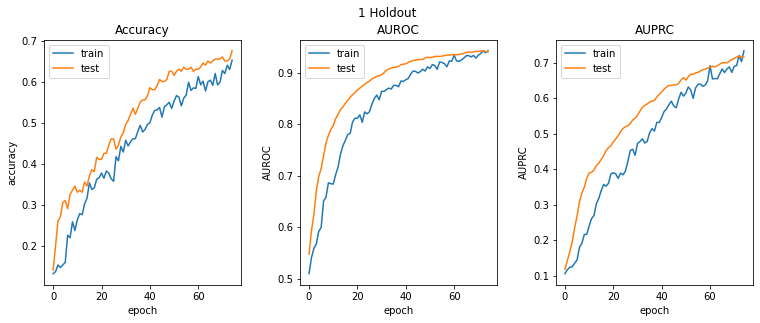

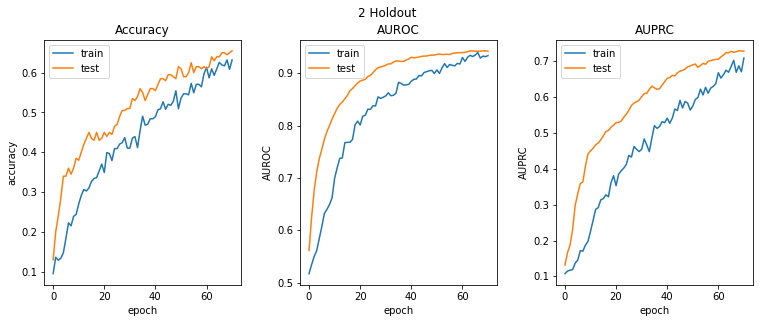

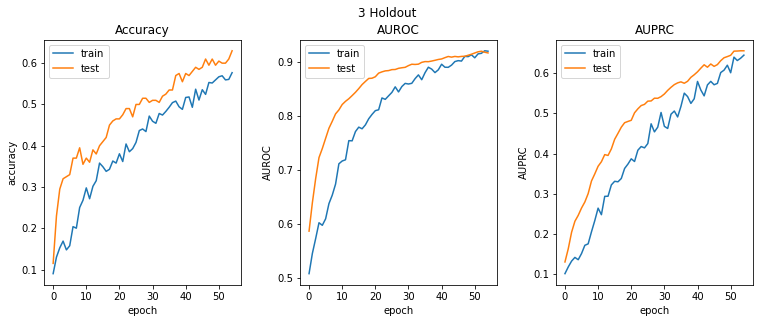

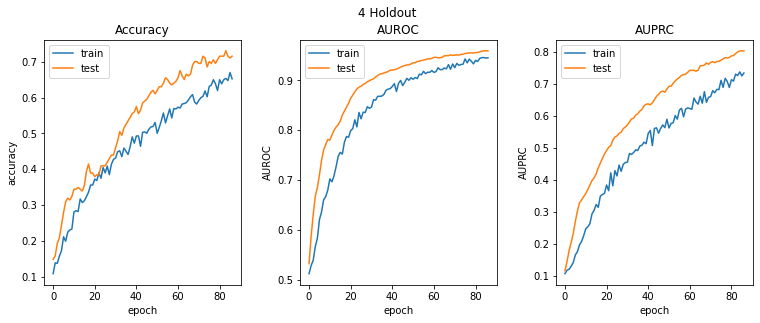

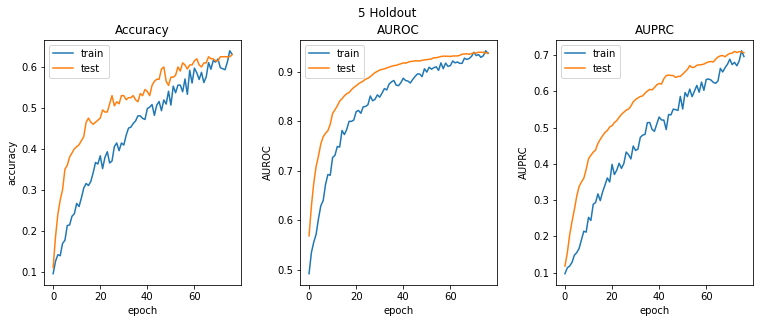

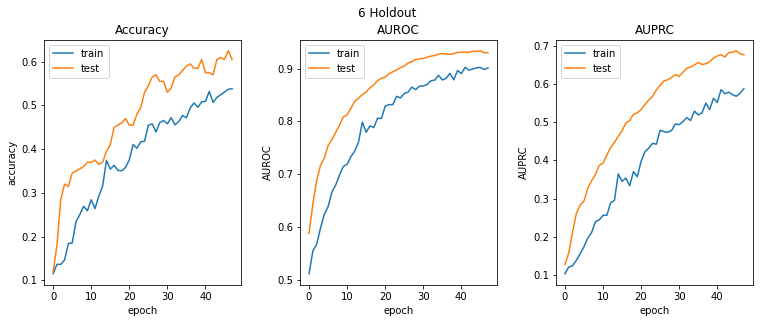

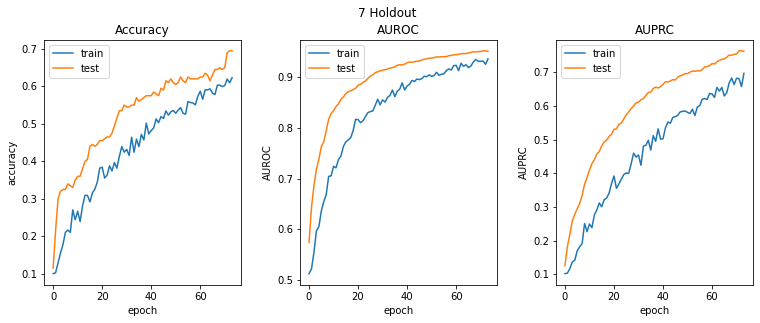

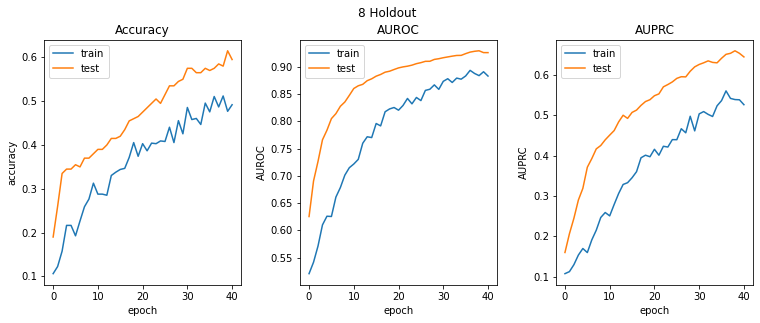

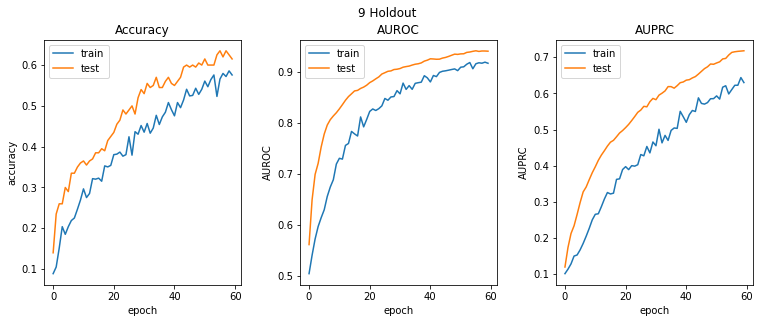

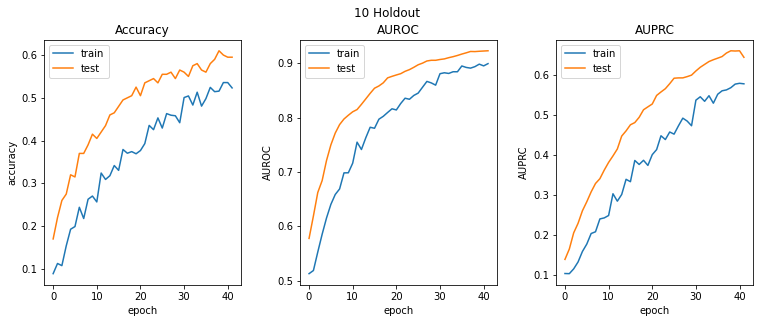

----------------------------------------------------------------------------------------------------
-- WINDOW window_3s --
MLP Fixed Metrics - 10-holdouts estimate:
Accuracy : train - 0.961811113357544  --  test - 0.8786072194576263
AUROC : train - 0.9990216016769409  --  test - 0.9896780610084533
AUPRC : train - 0.9928601801395416  --  test - 0.9466524302959443
--------------------------------------------------------------------------------
MLP - Train history:


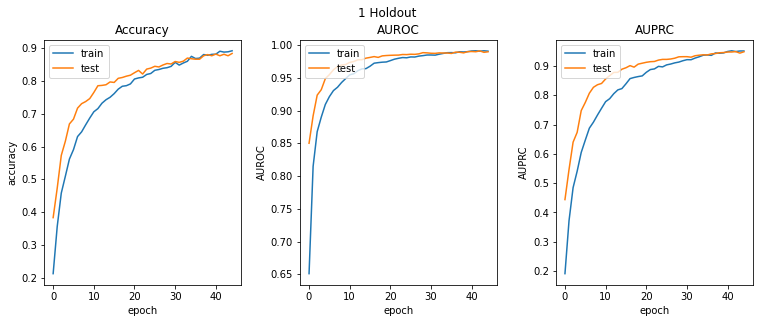

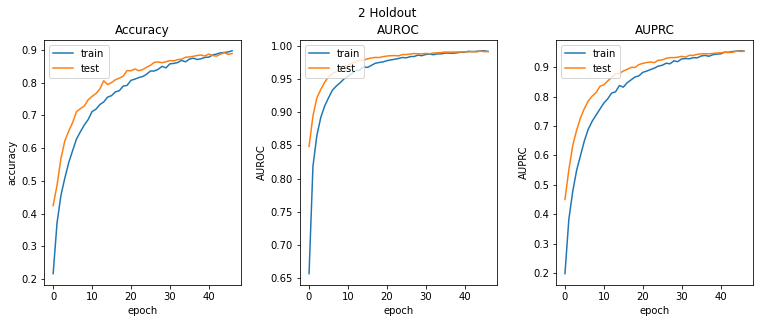

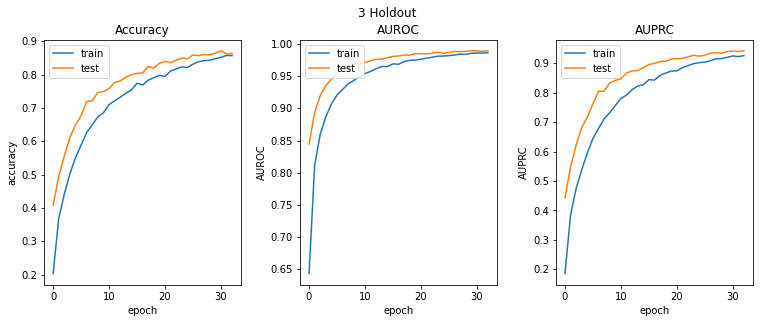

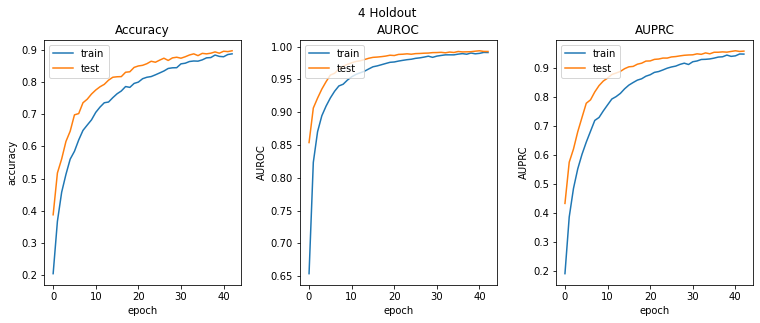

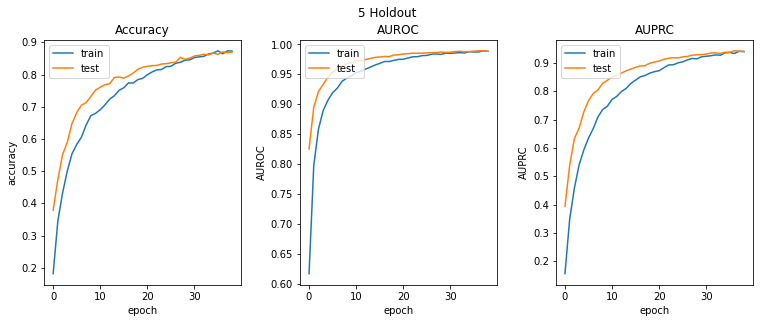

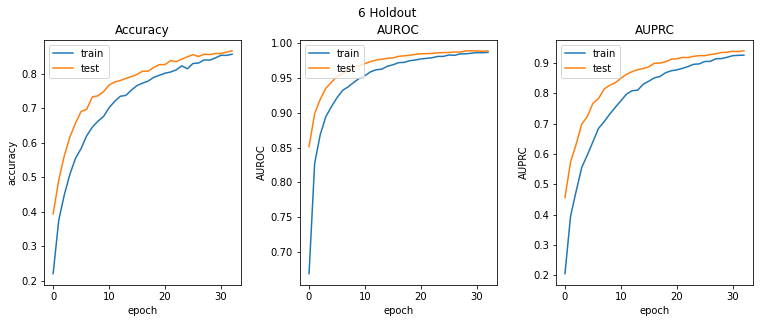

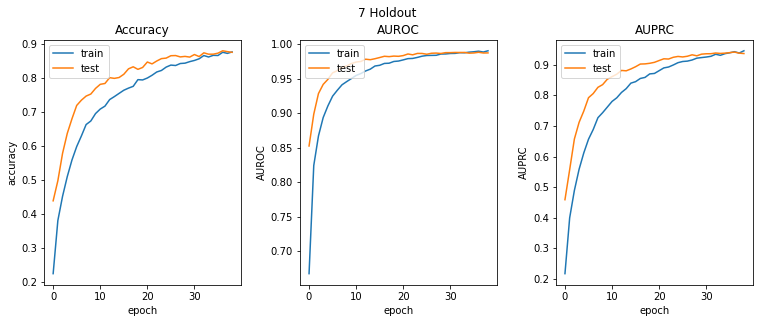

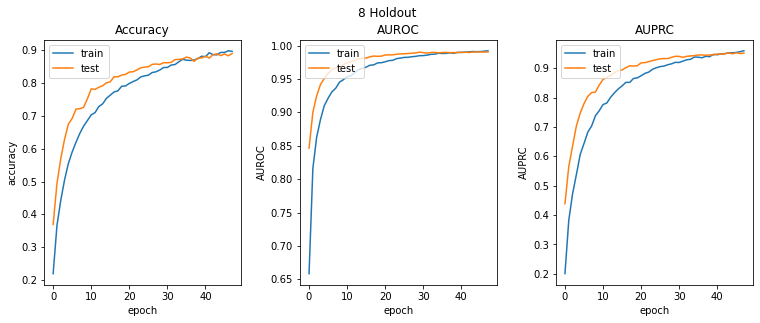

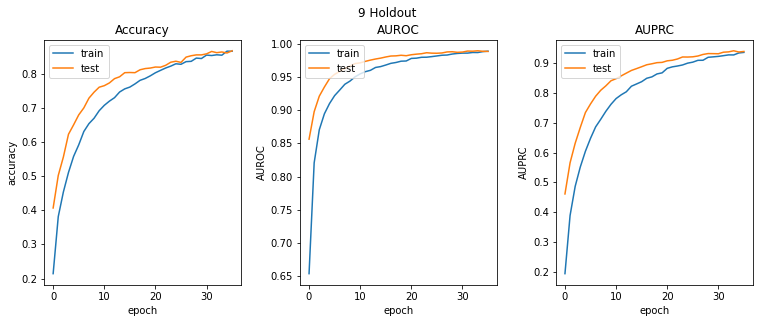

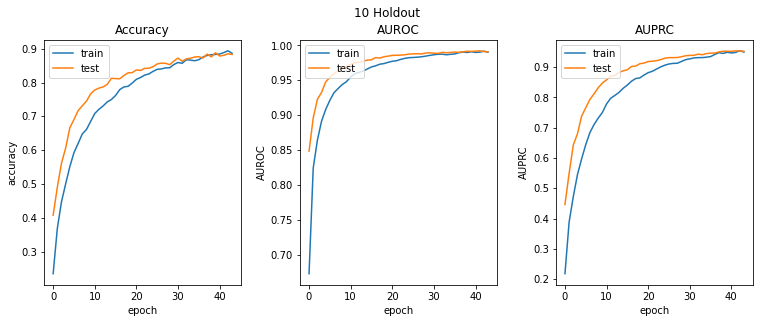

----------------------------------------------------------------------------------------------------


In [89]:
for window_type in ("window_30s", "window_3s"):
    MLP_metrics_estimate = model_metrics_holdout_estimate(MLP_fixed_metrics[window_type], number_of_splits)
    print(f"-- WINDOW {window_type} --")
    print(f"MLP Fixed Metrics - {number_of_splits}-holdouts estimate:")
    print(f"Accuracy : train - {MLP_metrics_estimate['accuracy_train']}  --  test - {MLP_metrics_estimate['accuracy_test']}")
    print(f"AUROC : train - {MLP_metrics_estimate['AUROC_train']}  --  test - {MLP_metrics_estimate['AUROC_test']}")
    print(f"AUPRC : train - {MLP_metrics_estimate['AUPRC_train']}  --  test - {MLP_metrics_estimate['AUPRC_test']}")
    print("-"*80)
    print("MLP - Train history:")
    plot_train_history(MLP_fixed_history[window_type])
    print("-"*100)

#### Tuned MLP

In [92]:
print("---- Tuned MLP ----")

input_data = {"window_30s": data['features_30s'], "window_3s": data['features_3s']}
data_labels = {"window_30s": labels_30s, "window_3s": labels_3s}

MLP_tuned_metrics = {}
MLP_tuned_history = {}

MLP_tuned_metrics["window_30s"] = []
MLP_tuned_metrics["window_3s"] = []

MLP_tuned_history["window_30s"] = []
MLP_tuned_history["window_3s"] = []

for window_type in ("window_30s", "window_3s"):
    # Generate holdouts
    for holdout_number, (train_indices, test_indices) in enumerate(tqdm(holdouts_generator.split(input_data[window_type], data_labels[window_type]))):
        print(f"-- HOLDOUT {holdout_number+1} -- WINDOW {window_type}")
        # Train/Test data
        x_train, x_test = input_data[window_type].iloc[train_indices], input_data[window_type].iloc[test_indices]
        y_train, y_test = data_labels[window_type].iloc[train_indices], data_labels[window_type].iloc[test_indices]

        ## Hyperparameter tuning
        # Generate holdouts
        for holdout_number_tuning, (train_indices_tuning, val_indices_tuning) in enumerate(holdouts_generator_tuning.split(x_train, y_train)):
            # Train/Validation data
            x_train_tuning, x_val_tuning = x_train.iloc[train_indices_tuning], x_train.iloc[val_indices_tuning]
            y_train_tuning, y_val_tuning = y_train.iloc[train_indices_tuning], y_train.iloc[val_indices_tuning]

            # One-hot encoding
            y_train_tuning = one_hot_encoding(y_train_tuning, 10)
            y_val_tuning = one_hot_encoding(y_val_tuning, 10)
        
            hp = kt.HyperParameters()

            best_hyperparameters = hyperparameter_tuning(
                x_train_tuning.values,
                x_val_tuning.values,
                y_train_tuning.values,
                y_val_tuning.values,
                build_MLP_hypermodel,
                name = "MLP_hypermodel_" + str(holdout_number) + "_" + str(window_type),
                directory='MLP_hypermodel',
                max_trials = 8,
                epochs = 50,
                batch_size = 128
            )
        
        ## Remove uncorrelated features with the output
        uncorrelated_features = uncorrelated_features_test(x_train, y_train)
        for feature in (x_train.columns):
            if feature in (uncorrelated_features):
                x_train = x_train.drop(columns=feature)
                x_test = x_test.drop(columns=feature)

        ## Remove correlated features with eachother
        correlated_features = correlated_features_test(x_train)
        for feature in (x_train.columns):
            if feature in (correlated_features):
                x_train = x_train.drop(columns=feature)
                x_test = x_test.drop(columns=feature)

        # One-hot encoding
        y_train = one_hot_encoding(y_train, 10)
        y_test = one_hot_encoding(y_test, 10)

        # Build MLP with best set of hyperparameters
        MLP = build_MLP(best_hyperparameters, x_train.shape)

        print("- Training model:\n")
        MLP_holdout_metrics, MLP_holdout_history = train_model(
            MLP,
            x_train.values,
            x_test.values,
            y_train.values,
            y_test.values,
            epochs,
            batch_size
        )

        MLP_tuned_metrics[window_type].append(MLP_holdout_metrics)
        MLP_tuned_history[window_type].append(MLP_holdout_history)

Trial 8 Complete [00h 00m 25s]
multi_objective: -2.7589837312698364

Best multi_objective So Far: -2.7711485028266907
Total elapsed time: 00h 04m 12s
INFO:tensorflow:Oracle triggered exit
-- Best set of hyperparameters found:
{'depth': 3, 'units_0': 104, 'dropout_0': 0.3, 'units_1': 216, 'dropout_1': 0.4, 'units_2': 120, 'dropout_2': 0.3, 'units_3': 104, 'dropout_3': 0.5, 'units_4': 40, 'dropout_4': 0.5}
-- 6 Uncorrelated features: [Pearson+Spearman]
['mfcc16_mean', 'tempo', 'mfcc10_var', 'mfcc19_mean', 'mfcc11_var', 'mfcc17_mean']
-- Actually uncorrelated features: [confirmed via MIC]
[]
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 104)               5928      
                                                                 
 dropout_1 (Dropout)         (None, 104)               0        

Epoch 12/100
63/63 [==============================] - 1s 8ms/step - loss: 0.8618 - accuracy: 0.7049 - recall: 0.5897 - precision: 0.8077 - AUROC: 0.9574 - AUPRC: 0.7841 - f1_score: 0.6817 - balanced_accuracy: 0.7870 - specificity: 0.9844 - miss_rate: 0.4103 - fall_out: 0.0156 - mcc: 0.6620 - val_loss: 0.6996 - val_accuracy: 0.7625 - val_recall: 0.6648 - val_precision: 0.8679 - val_AUROC: 0.9725 - val_AUPRC: 0.8554 - val_f1_score: 0.7529 - val_balanced_accuracy: 0.8268 - val_specificity: 0.9888 - val_miss_rate: 0.3352 - val_fall_out: 0.0112 - val_mcc: 0.7372
Epoch 13/100
63/63 [==============================] - 1s 9ms/step - loss: 0.8224 - accuracy: 0.7166 - recall: 0.6122 - precision: 0.8118 - AUROC: 0.9609 - AUPRC: 0.7982 - f1_score: 0.6980 - balanced_accuracy: 0.7982 - specificity: 0.9842 - miss_rate: 0.3878 - fall_out: 0.0158 - mcc: 0.6776 - val_loss: 0.6763 - val_accuracy: 0.7740 - val_recall: 0.6824 - val_precision: 0.8692 - val_AUROC: 0.9744 - val_AUPRC: 0.8621 - val_f1_score: 0.

Epoch 27/100
63/63 [==============================] - 1s 9ms/step - loss: 0.6202 - accuracy: 0.7922 - recall: 0.7311 - precision: 0.8501 - AUROC: 0.9766 - AUPRC: 0.8705 - f1_score: 0.7861 - balanced_accuracy: 0.8584 - specificity: 0.9857 - miss_rate: 0.2689 - fall_out: 0.0143 - mcc: 0.7670 - val_loss: 0.5239 - val_accuracy: 0.8236 - val_recall: 0.7705 - val_precision: 0.8875 - val_AUROC: 0.9836 - val_AUPRC: 0.9109 - val_f1_score: 0.8249 - val_balanced_accuracy: 0.8798 - val_specificity: 0.9891 - val_miss_rate: 0.2295 - val_fall_out: 0.0109 - val_mcc: 0.8094
Epoch 28/100
63/63 [==============================] - 1s 9ms/step - loss: 0.5844 - accuracy: 0.7976 - recall: 0.7363 - precision: 0.8550 - AUROC: 0.9795 - AUPRC: 0.8830 - f1_score: 0.7913 - balanced_accuracy: 0.8612 - specificity: 0.9861 - miss_rate: 0.2637 - fall_out: 0.0139 - mcc: 0.7726 - val_loss: 0.5159 - val_accuracy: 0.8257 - val_recall: 0.7796 - val_precision: 0.8891 - val_AUROC: 0.9839 - val_AUPRC: 0.9116 - val_f1_score: 0.

Epoch 42/100
63/63 [==============================] - 1s 9ms/step - loss: 0.4397 - accuracy: 0.8464 - recall: 0.8089 - precision: 0.8879 - AUROC: 0.9877 - AUPRC: 0.9270 - f1_score: 0.8466 - balanced_accuracy: 0.8988 - specificity: 0.9887 - miss_rate: 0.1911 - fall_out: 0.0113 - mcc: 0.8315 - val_loss: 0.4362 - val_accuracy: 0.8517 - val_recall: 0.8302 - val_precision: 0.8942 - val_AUROC: 0.9874 - val_AUPRC: 0.9319 - val_f1_score: 0.8610 - val_balanced_accuracy: 0.9096 - val_specificity: 0.9891 - val_miss_rate: 0.1698 - val_fall_out: 0.0109 - val_mcc: 0.8469
Epoch 43/100
63/63 [==============================] - 1s 9ms/step - loss: 0.4643 - accuracy: 0.8439 - recall: 0.8091 - precision: 0.8813 - AUROC: 0.9862 - AUPRC: 0.9195 - f1_score: 0.8437 - balanced_accuracy: 0.8985 - specificity: 0.9879 - miss_rate: 0.1909 - fall_out: 0.0121 - mcc: 0.8280 - val_loss: 0.4267 - val_accuracy: 0.8542 - val_recall: 0.8231 - val_precision: 0.8963 - val_AUROC: 0.9880 - val_AUPRC: 0.9340 - val_f1_score: 0.

10it [45:18, 271.84s/it]


-- WINDOW window_30s --
MLP Tuned Metrics - 10-holdouts estimate:
Accuracy : train - 0.8122653305530548  --  test - 0.6745000064373017
AUROC : train - 0.979555082321167  --  test - 0.9464241802692414
AUPRC : train - 0.8871137201786041  --  test - 0.7454391419887543
--------------------------------------------------------------------------------
MLP - Train history:


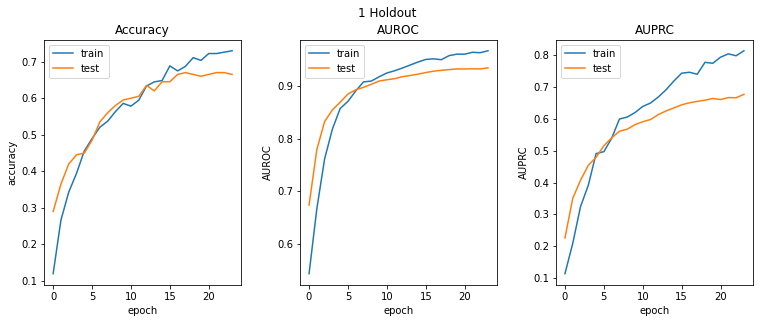

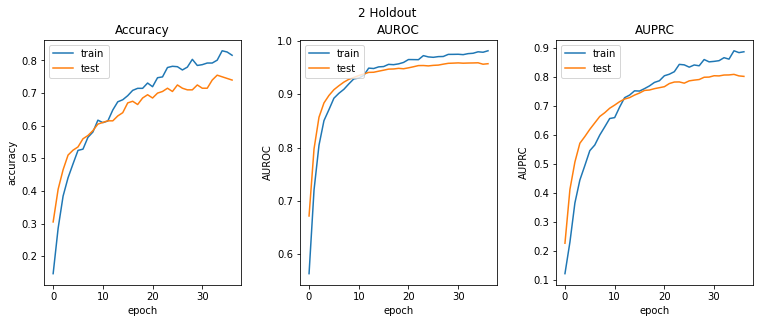

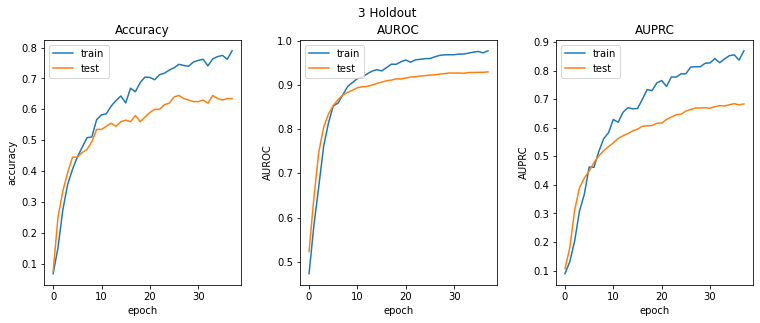

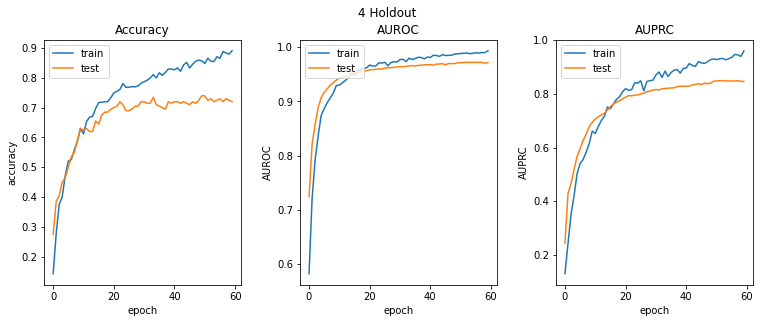

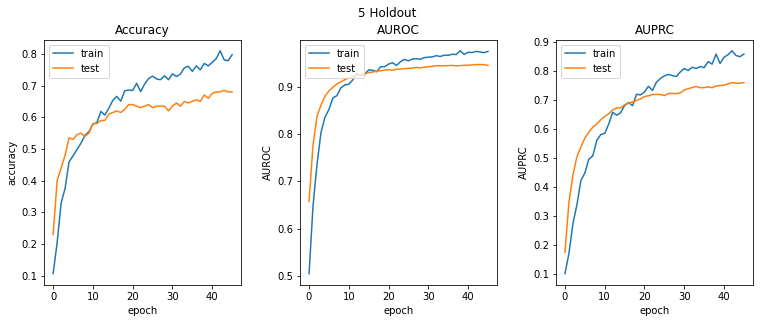

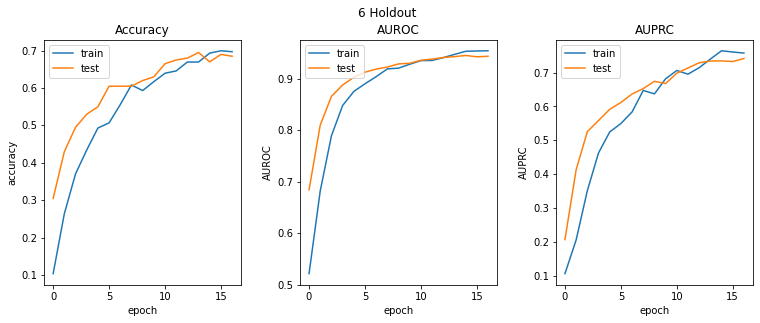

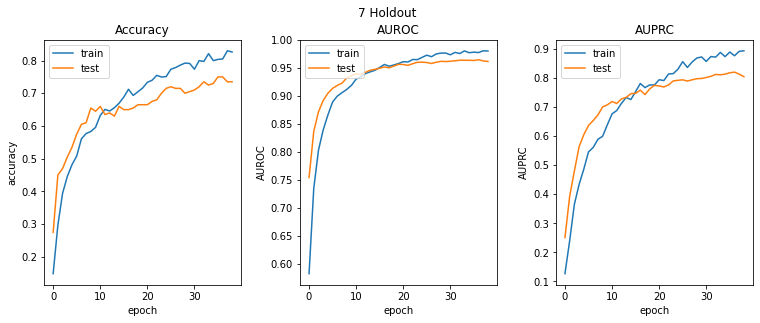

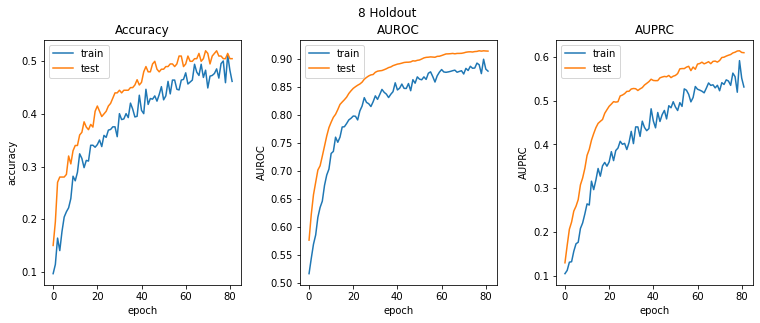

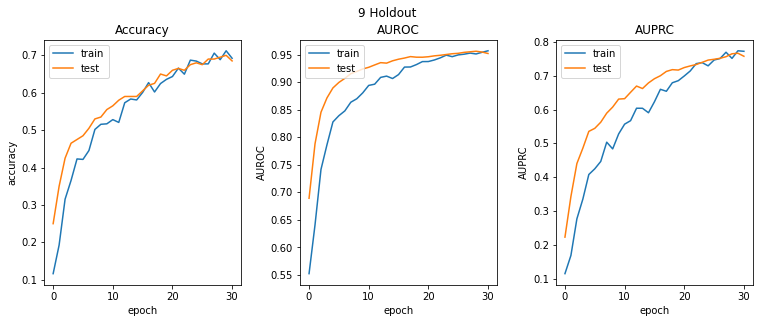

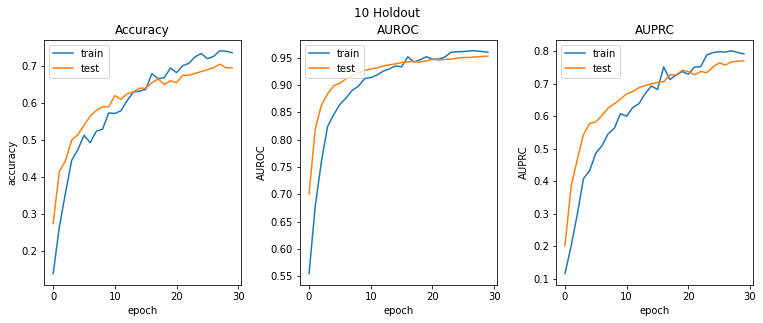

----------------------------------------------------------------------------------------------------
-- WINDOW window_3s --
MLP Tuned Metrics - 10-holdouts estimate:
Accuracy : train - 0.9506262481212616  --  test - 0.8638276517391205
AUROC : train - 0.9981555879116059  --  test - 0.9882614970207214
AUPRC : train - 0.9877791702747345  --  test - 0.9361467361450195
--------------------------------------------------------------------------------
MLP - Train history:


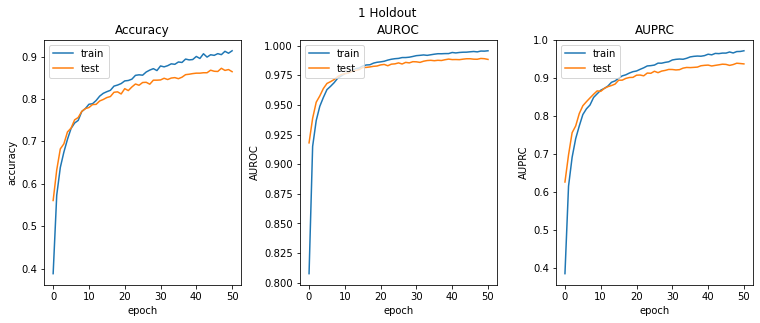

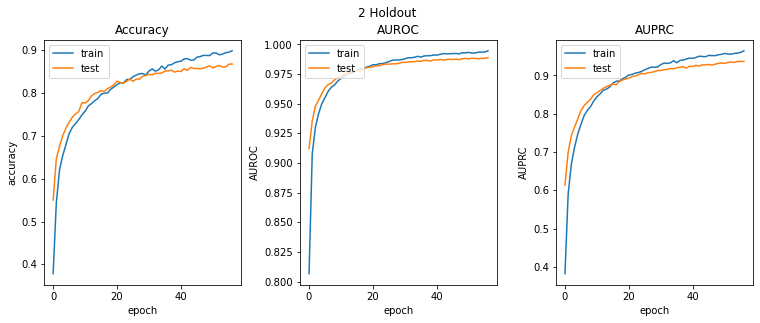

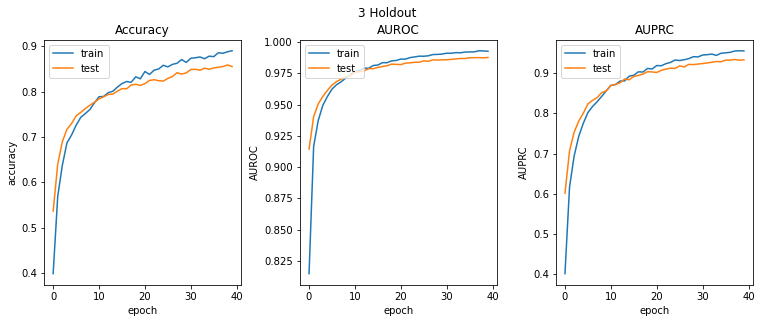

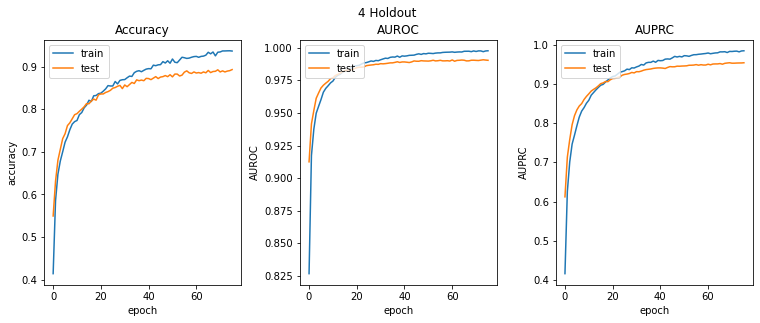

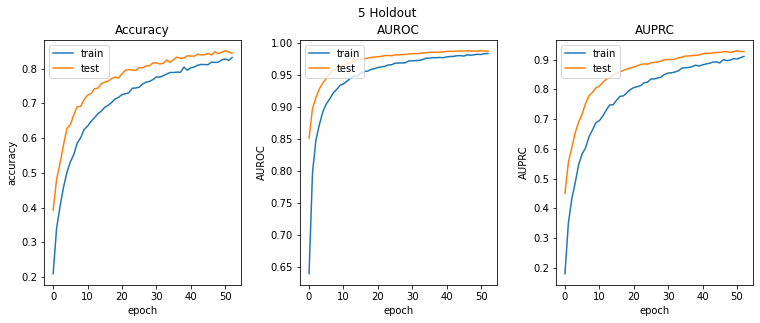

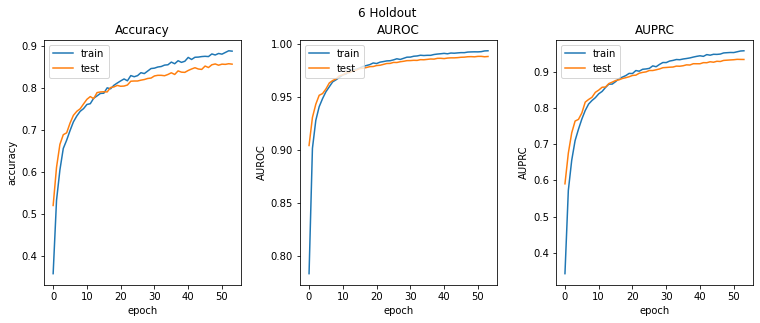

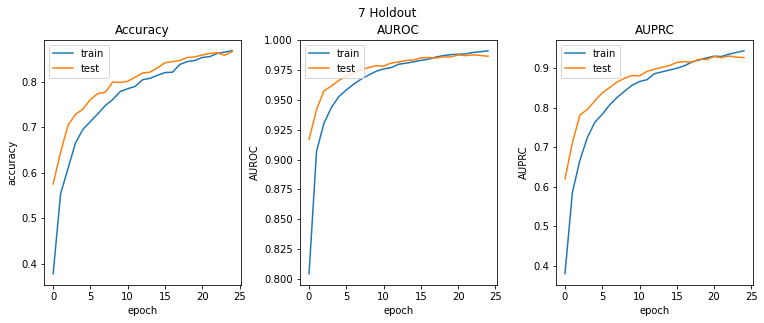

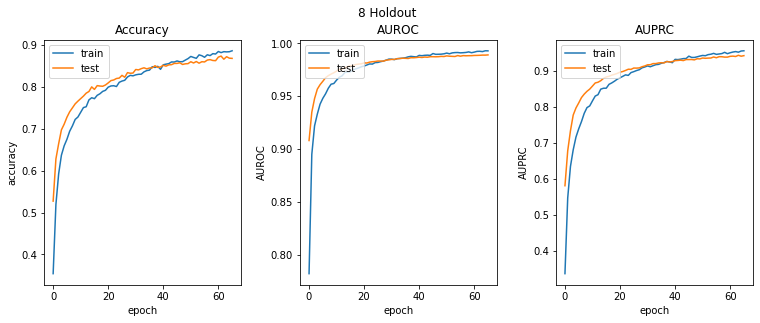

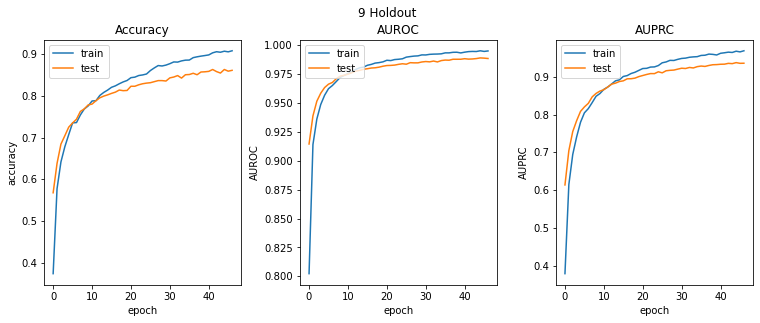

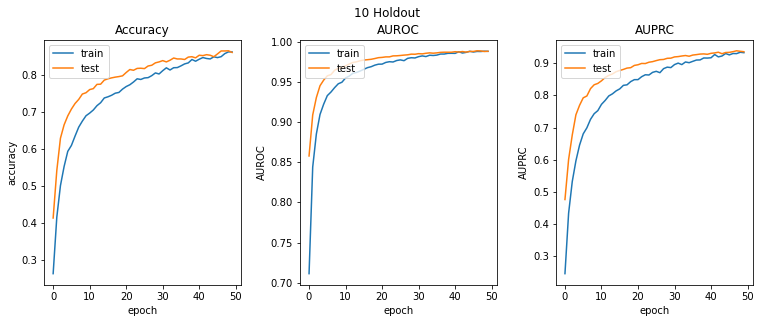

----------------------------------------------------------------------------------------------------


In [93]:
for window_type in ("window_30s", "window_3s"):
    MLP_metrics_estimate = model_metrics_holdout_estimate(MLP_tuned_metrics[window_type], number_of_splits)
    print(f"-- WINDOW {window_type} --")
    print(f"MLP Tuned Metrics - {number_of_splits}-holdouts estimate:")
    print(f"Accuracy : train - {MLP_metrics_estimate['accuracy_train']}  --  test - {MLP_metrics_estimate['accuracy_test']}")
    print(f"AUROC : train - {MLP_metrics_estimate['AUROC_train']}  --  test - {MLP_metrics_estimate['AUROC_test']}")
    print(f"AUPRC : train - {MLP_metrics_estimate['AUPRC_train']}  --  test - {MLP_metrics_estimate['AUPRC_test']}")
    print("-"*80)
    print("MLP - Train history:")
    plot_train_history(MLP_tuned_history[window_type])
    print("-"*100)

#### Tuned MLP on other features only (not Mfccs)

It is literature consensus that mfccs are very powerful features for audio pattern recognition, in particular for this music genre classification task.  
In order to determine to what extent other features are relevant and useful for the task the following models are tuned on the 30s and 3s window excluding mfccs mean and variance.

In [74]:
print("---- Tuned Other Features ----")

other_features = {}
other_features['features_30s'] = data['features_30s'].drop(data['features_3s'].loc[:, data['features_30s'].columns.str.startswith('mfcc')].columns, axis=1)
other_features['features_3s'] = data['features_3s'].drop(data['features_3s'].loc[:, data['features_3s'].columns.str.startswith('mfcc')].columns, axis=1)

feature_number = other_features['features_30s'].shape[1]

input_data = {"window_30s": other_features['features_30s'], "window_3s": other_features['features_3s']}
data_labels = {"window_30s": labels_30s, "window_3s":  labels_3s}

MLP_other_features_metrics = {}
MLP_other_features_history = {}

MLP_other_features_metrics["window_30s"] = []
MLP_other_features_metrics["window_3s"] = []

MLP_other_features_history["window_30s"] = []
MLP_other_features_history["window_3s"] = []

for window_type in ("window_30s", "window_3s"):
    # Generate holdouts
    for holdout_number, (train_indices, test_indices) in enumerate(tqdm(holdouts_generator.split(input_data[window_type], data_labels[window_type]))):
        print(f"-- HOLDOUT {holdout_number+1} -- WINDOW {window_type}")
        # Train/Test data
        x_train, x_test = input_data[window_type].iloc[train_indices], input_data[window_type].iloc[test_indices]
        y_train, y_test = data_labels[window_type].iloc[train_indices], data_labels[window_type].iloc[test_indices]

        ## Hyperparameter tuning
        # Generate holdouts
        for holdout_number_tuning, (train_indices_tuning, val_indices_tuning) in enumerate(holdouts_generator_tuning.split(x_train, y_train)):
            # Train/Validation data
            x_train_tuning, x_val_tuning = x_train.iloc[train_indices_tuning], x_train.iloc[val_indices_tuning]
            y_train_tuning, y_val_tuning = y_train.iloc[train_indices_tuning], y_train.iloc[val_indices_tuning]

            # One-hot encoding
            y_train_tuning = one_hot_encoding(y_train_tuning, 10)
            y_val_tuning = one_hot_encoding(y_val_tuning, 10)
        
            hp = kt.HyperParameters()

            best_hyperparameters = hyperparameter_tuning(
                x_train_tuning.values,
                x_val_tuning.values,
                y_train_tuning.values,
                y_val_tuning.values,
                build_MLP_hypermodel,
                name = "MLP_hypermodel_no_mfccs_" + str(holdout_number) + "_" + str(window_type),
                directory='MLP_hypermodel',
                max_trials = 8,
                epochs = 50,
                batch_size = 128
            )
        
        ## Remove uncorrelated features with the output
        uncorrelated_features = uncorrelated_features_test(x_train, y_train)
        for feature in (x_train.columns):
            if feature in (uncorrelated_features):
                x_train = x_train.drop(columns=feature)
                x_test = x_test.drop(columns=feature)

        ## Remove correlated features with eachother
        correlated_features = correlated_features_test(x_train)
        for feature in (x_train.columns):
            if feature in (correlated_features):
                x_train = x_train.drop(columns=feature)
                x_test = x_test.drop(columns=feature)

        # One-hot encoding
        y_train = one_hot_encoding(y_train, 10)
        y_test = one_hot_encoding(y_test, 10)

        # Build MLP with best set of hyperparameters
        MLP = build_MLP(best_hyperparameters, x_train.shape)

        print("- Training model:\n")
        MLP_holdout_metrics, MLP_holdout_history = train_model(
            MLP,
            x_train.values,
            x_test.values,
            y_train.values,
            y_test.values,
            epochs,
            batch_size
        )

        MLP_other_features_metrics[window_type].append(MLP_holdout_metrics)
        MLP_other_features_history[window_type].append(MLP_holdout_history)

Trial 8 Complete [00h 00m 28s]
multi_objective: -1.9335779547691345

Best multi_objective So Far: -1.9346843957901
Total elapsed time: 00h 04m 14s
INFO:tensorflow:Oracle triggered exit
-- Best set of hyperparameters found:
{'depth': 1, 'units_0': 8, 'dropout_0': 0.3, 'units_1': 168, 'dropout_1': 0.5, 'units_2': 8, 'dropout_2': 0.3, 'units_3': 8, 'dropout_3': 0.3, 'units_4': 120, 'dropout_4': 0.5}
-- 1 Uncorrelated features: [Pearson+Spearman]
['tempo']
-- Actually uncorrelated features: [confirmed via MIC]
[]
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 8)                 136       
                                                                 
 dropout_1 (Dropout)         (None, 8)                 0         
                                                                 
 dense_3 (Den

63/63 [==============================] - 0s 8ms/step - loss: 1.8203 - accuracy: 0.3171 - recall: 0.0911 - precision: 0.6658 - AUROC: 0.7921 - AUPRC: 0.3403 - f1_score: 0.1602 - balanced_accuracy: 0.5430 - specificity: 0.9949 - miss_rate: 0.9089 - fall_out: 0.0051 - mcc: 0.2221 - val_loss: 1.7003 - val_accuracy: 0.3798 - val_recall: 0.0872 - val_precision: 0.7909 - val_AUROC: 0.8369 - val_AUPRC: 0.4091 - val_f1_score: 0.1570 - val_balanced_accuracy: 0.5423 - val_specificity: 0.9974 - val_miss_rate: 0.9128 - val_fall_out: 0.0026 - val_mcc: 0.2431
Epoch 14/100
63/63 [==============================] - 0s 7ms/step - loss: 1.7960 - accuracy: 0.3298 - recall: 0.0963 - precision: 0.6704 - AUROC: 0.7991 - AUPRC: 0.3494 - f1_score: 0.1684 - balanced_accuracy: 0.5455 - specificity: 0.9947 - miss_rate: 0.9037 - fall_out: 0.0053 - mcc: 0.2296 - val_loss: 1.6805 - val_accuracy: 0.3858 - val_recall: 0.0937 - val_precision: 0.7991 - val_AUROC: 0.8412 - val_AUPRC: 0.4190 - val_f1_score: 0.1677 - val_ba

Epoch 28/100
63/63 [==============================] - 0s 7ms/step - loss: 1.6811 - accuracy: 0.3764 - recall: 0.1279 - precision: 0.6931 - AUROC: 0.8295 - AUPRC: 0.4028 - f1_score: 0.2159 - balanced_accuracy: 0.5608 - specificity: 0.9937 - miss_rate: 0.8721 - fall_out: 0.0063 - mcc: 0.2711 - val_loss: 1.5592 - val_accuracy: 0.4324 - val_recall: 0.1383 - val_precision: 0.8190 - val_AUROC: 0.8651 - val_AUPRC: 0.4782 - val_f1_score: 0.2366 - val_balanced_accuracy: 0.5674 - val_specificity: 0.9966 - val_miss_rate: 0.8617 - val_fall_out: 0.0034 - val_mcc: 0.3141
Epoch 29/100
63/63 [==============================] - 0s 7ms/step - loss: 1.6825 - accuracy: 0.3702 - recall: 0.1259 - precision: 0.6781 - AUROC: 0.8291 - AUPRC: 0.3966 - f1_score: 0.2123 - balanced_accuracy: 0.5596 - specificity: 0.9934 - miss_rate: 0.8741 - fall_out: 0.0066 - mcc: 0.2650 - val_loss: 1.5534 - val_accuracy: 0.4339 - val_recall: 0.1418 - val_precision: 0.8227 - val_AUROC: 0.8662 - val_AUPRC: 0.4804 - val_f1_score: 0.

Epoch 43/100
63/63 [==============================] - 0s 7ms/step - loss: 1.6161 - accuracy: 0.4048 - recall: 0.1493 - precision: 0.7133 - AUROC: 0.8457 - AUPRC: 0.4330 - f1_score: 0.2469 - balanced_accuracy: 0.5713 - specificity: 0.9933 - miss_rate: 0.8507 - fall_out: 0.0067 - mcc: 0.2989 - val_loss: 1.4870 - val_accuracy: 0.4830 - val_recall: 0.1598 - val_precision: 0.8351 - val_AUROC: 0.8789 - val_AUPRC: 0.5158 - val_f1_score: 0.2683 - val_balanced_accuracy: 0.5782 - val_specificity: 0.9965 - val_miss_rate: 0.8402 - val_fall_out: 0.0035 - val_mcc: 0.3423
Epoch 44/100
63/63 [==============================] - 0s 7ms/step - loss: 1.6229 - accuracy: 0.4006 - recall: 0.1498 - precision: 0.7123 - AUROC: 0.8434 - AUPRC: 0.4299 - f1_score: 0.2475 - balanced_accuracy: 0.5715 - specificity: 0.9933 - miss_rate: 0.8502 - fall_out: 0.0067 - mcc: 0.2992 - val_loss: 1.4847 - val_accuracy: 0.4795 - val_recall: 0.1608 - val_precision: 0.8381 - val_AUROC: 0.8792 - val_AUPRC: 0.5163 - val_f1_score: 0.

Epoch 58/100
63/63 [==============================] - 0s 7ms/step - loss: 1.5885 - accuracy: 0.4203 - recall: 0.1723 - precision: 0.7300 - AUROC: 0.8509 - AUPRC: 0.4528 - f1_score: 0.2789 - balanced_accuracy: 0.5826 - specificity: 0.9929 - miss_rate: 0.8277 - fall_out: 0.0071 - mcc: 0.3265 - val_loss: 1.4472 - val_accuracy: 0.5000 - val_recall: 0.1759 - val_precision: 0.8163 - val_AUROC: 0.8852 - val_AUPRC: 0.5334 - val_f1_score: 0.2894 - val_balanced_accuracy: 0.5857 - val_specificity: 0.9956 - val_miss_rate: 0.8241 - val_fall_out: 0.0044 - val_mcc: 0.3543
Epoch 59/100
63/63 [==============================] - 0s 7ms/step - loss: 1.5752 - accuracy: 0.4236 - recall: 0.1738 - precision: 0.7282 - AUROC: 0.8532 - AUPRC: 0.4563 - f1_score: 0.2807 - balanced_accuracy: 0.5833 - specificity: 0.9928 - miss_rate: 0.8262 - fall_out: 0.0072 - mcc: 0.3275 - val_loss: 1.4458 - val_accuracy: 0.5005 - val_recall: 0.1779 - val_precision: 0.8124 - val_AUROC: 0.8854 - val_AUPRC: 0.5342 - val_f1_score: 0.

Epoch 73/100
63/63 [==============================] - 0s 7ms/step - loss: 1.5712 - accuracy: 0.4251 - recall: 0.1801 - precision: 0.7299 - AUROC: 0.8534 - AUPRC: 0.4597 - f1_score: 0.2889 - balanced_accuracy: 0.5864 - specificity: 0.9926 - miss_rate: 0.8199 - fall_out: 0.0074 - mcc: 0.3340 - val_loss: 1.4250 - val_accuracy: 0.5125 - val_recall: 0.1819 - val_precision: 0.8176 - val_AUROC: 0.8890 - val_AUPRC: 0.5466 - val_f1_score: 0.2975 - val_balanced_accuracy: 0.5887 - val_specificity: 0.9955 - val_miss_rate: 0.8181 - val_fall_out: 0.0045 - val_mcc: 0.3608
Epoch 74/100
63/63 [==============================] - 0s 7ms/step - loss: 1.5668 - accuracy: 0.4178 - recall: 0.1820 - precision: 0.7283 - AUROC: 0.8543 - AUPRC: 0.4604 - f1_score: 0.2912 - balanced_accuracy: 0.5872 - specificity: 0.9925 - miss_rate: 0.8180 - fall_out: 0.0075 - mcc: 0.3353 - val_loss: 1.4251 - val_accuracy: 0.5155 - val_recall: 0.1829 - val_precision: 0.8184 - val_AUROC: 0.8890 - val_AUPRC: 0.5463 - val_f1_score: 0.

Epoch 88/100
63/63 [==============================] - 1s 9ms/step - loss: 1.5577 - accuracy: 0.4304 - recall: 0.1862 - precision: 0.7365 - AUROC: 0.8569 - AUPRC: 0.4663 - f1_score: 0.2973 - balanced_accuracy: 0.5894 - specificity: 0.9926 - miss_rate: 0.8138 - fall_out: 0.0074 - mcc: 0.3417 - val_loss: 1.4114 - val_accuracy: 0.5130 - val_recall: 0.1904 - val_precision: 0.8172 - val_AUROC: 0.8911 - val_AUPRC: 0.5520 - val_f1_score: 0.3088 - val_balanced_accuracy: 0.5928 - val_specificity: 0.9953 - val_miss_rate: 0.8096 - val_fall_out: 0.0047 - val_mcc: 0.3692
Epoch 89/100
63/63 [==============================] - 0s 7ms/step - loss: 1.5535 - accuracy: 0.4315 - recall: 0.1878 - precision: 0.7352 - AUROC: 0.8576 - AUPRC: 0.4665 - f1_score: 0.2991 - balanced_accuracy: 0.5901 - specificity: 0.9925 - miss_rate: 0.8122 - fall_out: 0.0075 - mcc: 0.3428 - val_loss: 1.4101 - val_accuracy: 0.5125 - val_recall: 0.1894 - val_precision: 0.8182 - val_AUROC: 0.8916 - val_AUPRC: 0.5532 - val_f1_score: 0.

10it [42:58, 257.87s/it]


-- WINDOW window_30s --
MLP Tuned No Mfccs Metrics - 10-holdouts estimate:
Accuracy : train - 0.5521902292966843  --  test - 0.49649999737739564
AUROC : train - 0.9043975651264191  --  test - 0.8792526304721833
AUPRC : train - 0.5961230337619782  --  test - 0.5214183390140533
--------------------------------------------------------------------------------
MLP - Train history:


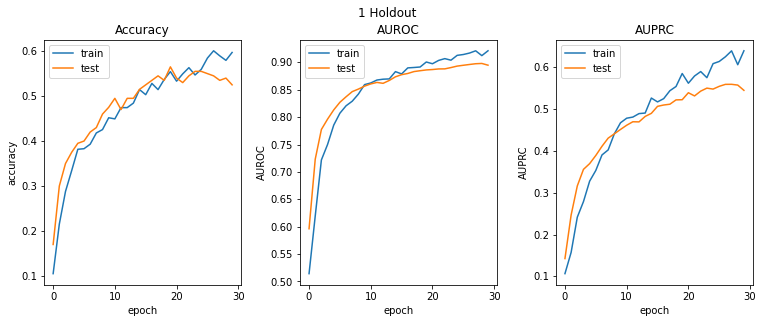

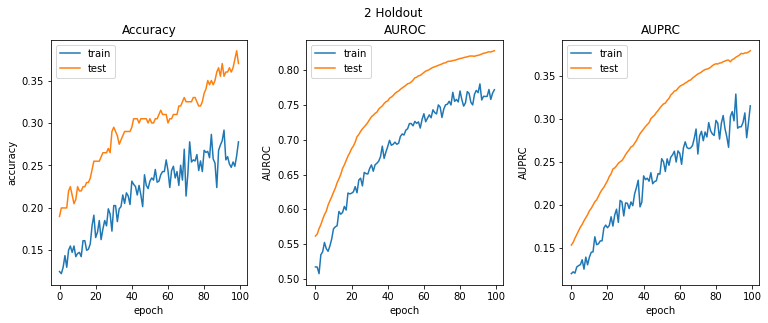

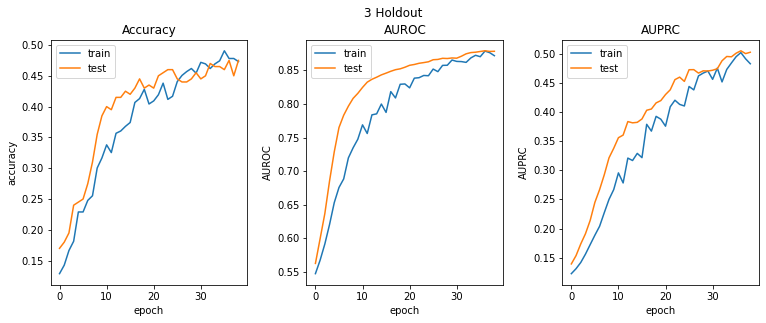

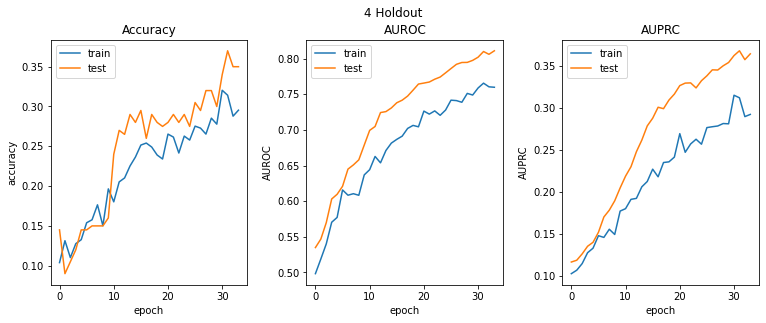

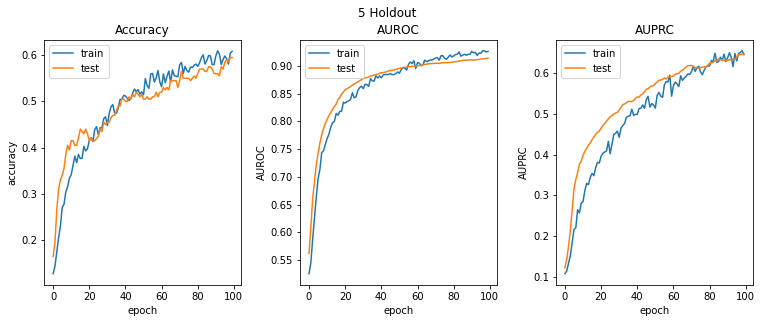

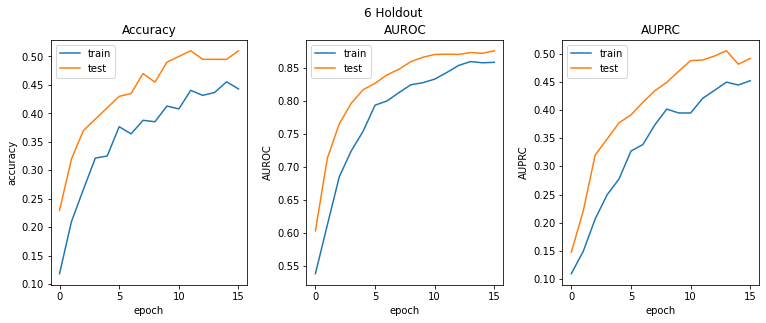

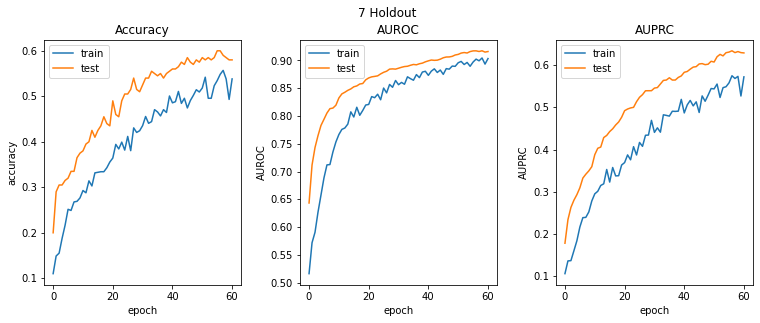

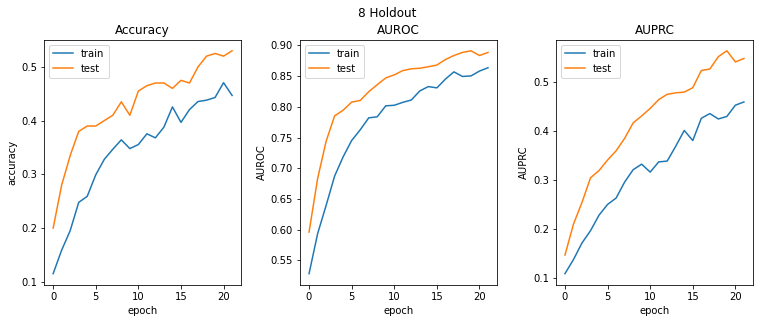

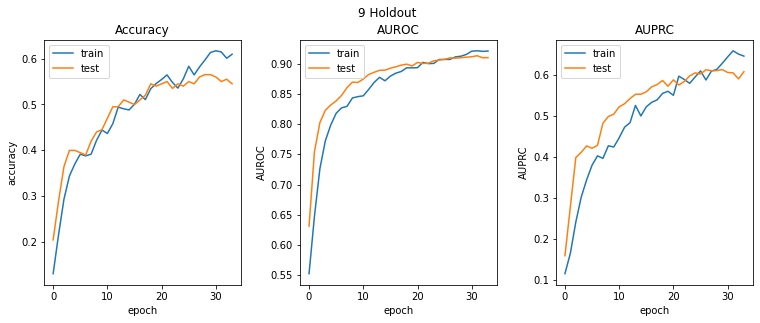

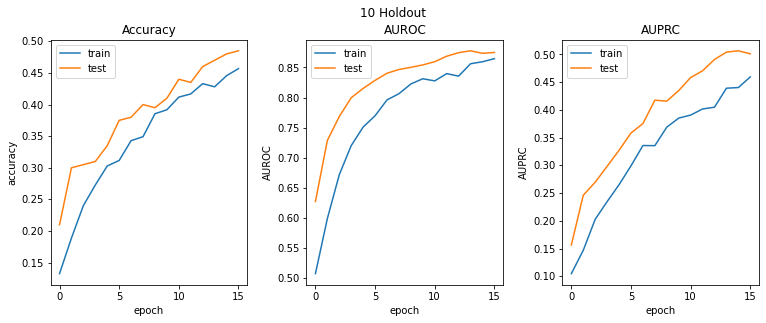

----------------------------------------------------------------------------------------------------
-- WINDOW window_3s --
MLP Tuned No Mfccs Metrics - 10-holdouts estimate:
Accuracy : train - 0.7172720432281494  --  test - 0.6791583240032196
AUROC : train - 0.9584499299526215  --  test - 0.9480005145072937
AUPRC : train - 0.797723388671875  --  test - 0.7567114174365998
--------------------------------------------------------------------------------
MLP - Train history:


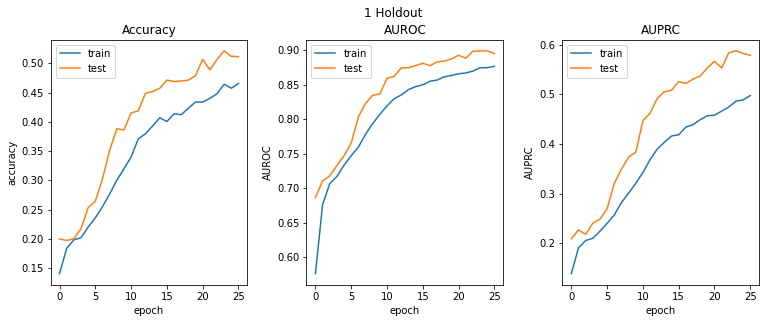

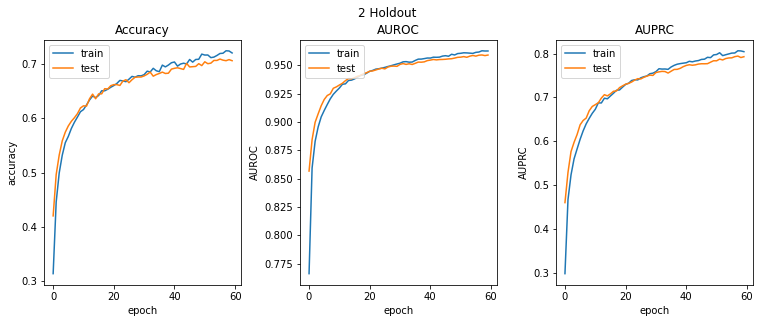

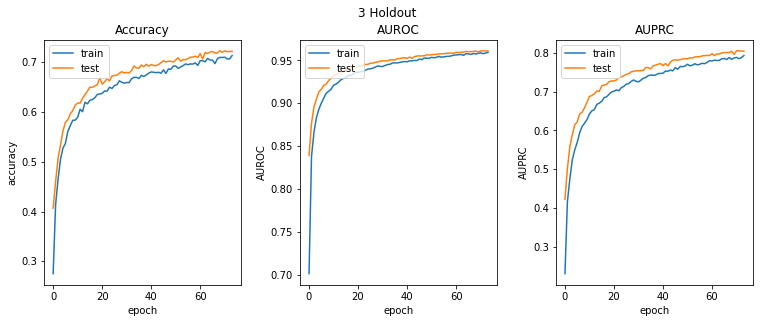

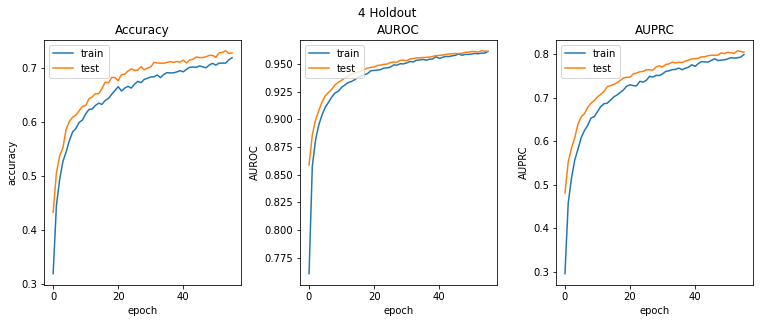

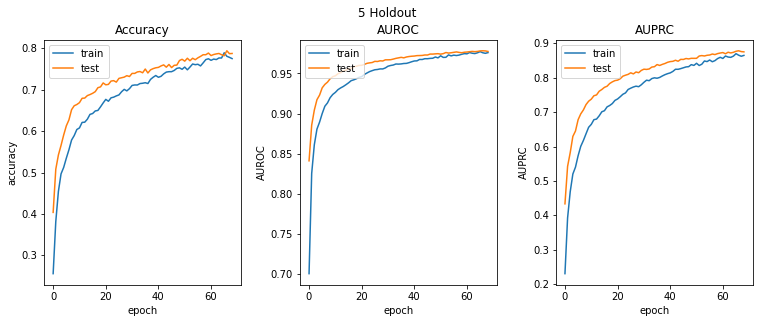

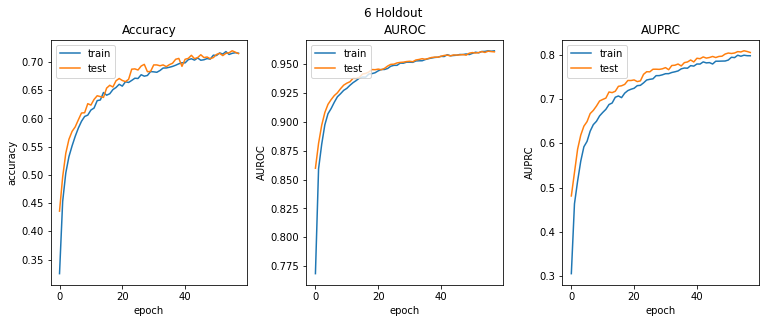

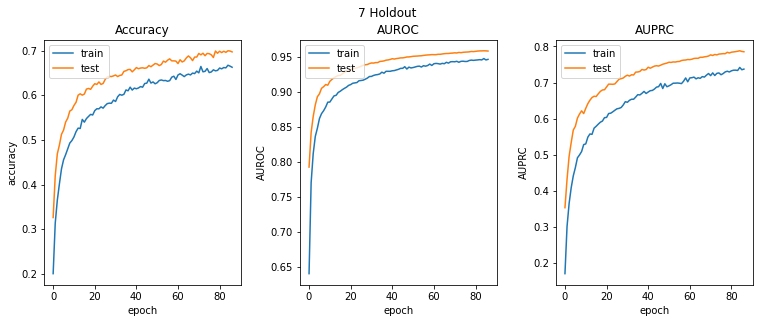

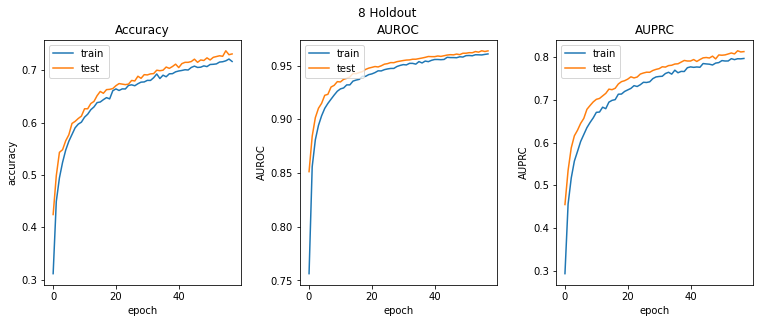

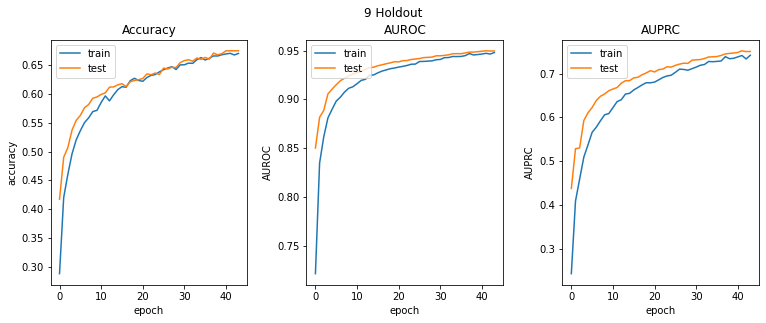

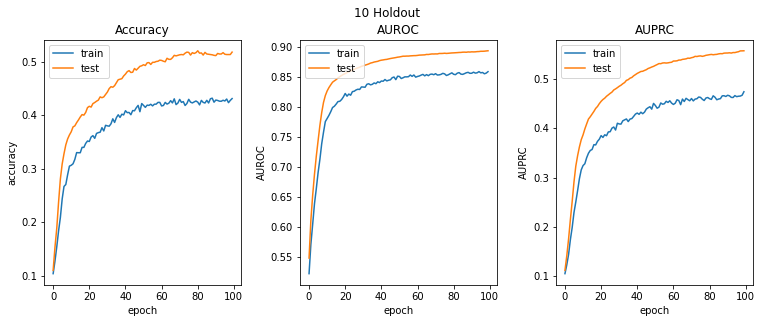

----------------------------------------------------------------------------------------------------


In [76]:
for window_type in ("window_30s", "window_3s"):
    MLP_metrics_estimate_other_features = model_metrics_holdout_estimate(MLP_other_features_metrics[window_type], number_of_splits)
    print(f"-- WINDOW {window_type} --")
    print(f"MLP Tuned No Mfccs Metrics - {number_of_splits}-holdouts estimate:")
    print(f"Accuracy : train - {MLP_metrics_estimate_other_features['accuracy_train']}  --  test - {MLP_metrics_estimate_other_features['accuracy_test']}")
    print(f"AUROC : train - {MLP_metrics_estimate_other_features['AUROC_train']}  --  test - {MLP_metrics_estimate_other_features['AUROC_test']}")
    print(f"AUPRC : train - {MLP_metrics_estimate_other_features['AUPRC_train']}  --  test - {MLP_metrics_estimate_other_features['AUPRC_test']}")
    print("-"*80)
    print("MLP - Train history:")
    plot_train_history(MLP_other_features_history[window_type])
    print("-"*100)

### CNN
A convolutional neural network consists a set of **convolutional** layers (convolution+maxPooling) and a set of **dense** layer. To avoid overfitting of the model dropout layers were added.

To have a statistically sound estimate of an architecture performance, multiple models are built and trained, each with the same architecture, over different portions of the data (holdouts) and, the average performance of those, is considered as an estimate of the overall performance of the architecture.

*Hyperparameter tuning* is not performed in this case as the literature found specific complex configurations hard to replicate with tuning with the low amount of data provided by the GTZAN dataset. These fixed architectures still provide good results.

Here are the functions to **evaluate** the model performances and to build and train the **model**.

These architectures handle well 2D data retaining spatial information, hence the data used to train and evaluate them are:
- 30s window Mel spectrogram (from GTZAN)
- 3s window STFT spectrogram
- 3s window Mel spectrogram
- 3s window Mfccs (20)

In [27]:
def build_fixed_CNN_melS_30s(
    input_shape: tuple
) -> tf.keras.Model:
    """ Returns the fixed CNN model for 30s window Mel spectrogram.
    
    Parameters
    ------------------------
    input_shape: tuple
        The shape of the input.
        
    Returns
    ------------------------
    model: model
        The fixed model."""
    
    CNN = Sequential(name="CNN_MelS_30s")
    CNN.add(layers.Input(input_shape))
    
    CNN.add(layers.Conv2D(
        filters = 128,
        kernel_size = 3,
        padding='same',
        activation='relu'))
    CNN.add(layers.MaxPooling2D(pool_size=(3),strides=(2),padding='same')),
    
    CNN.add(layers.Conv2D(
        filters = 64,
        kernel_size = 3,
        padding='same',
        activation='relu'))
    CNN.add(layers.MaxPooling2D(pool_size=(3),strides=(2),padding='same')),
    
    CNN.add(layers.Conv2D(
        filters = 64,
        kernel_size = 3,
        padding='same',
        activation='relu'))
    CNN.add(layers.MaxPooling2D(pool_size=(3),strides=(2),padding='same')),
    
    CNN.add(layers.Conv2D(
        filters = 128,
        kernel_size = 3,
        padding='same',
        activation='relu'))
    CNN.add(layers.MaxPooling2D(pool_size=(3),strides=(2),padding='same')),

    CNN.add(layers.Flatten())
    
    for i in range(1):
        CNN.add(layers.Dense(units = 128, activation='relu'))
        CNN.add(layers.Dropout(0.5))
        
    CNN.add(layers.Dense(10, activation='softmax'))
    
    CNN.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=get_standard_binary_metrics()
    )
    
    CNN.summary()
    
    return CNN

In [28]:
def build_fixed_CNN_S(
    input_shape: tuple
) -> tf.keras.Model:
    """ Returns the fixed CNN model for 3s window spectrogram.
    
    Parameters
    ------------------------
    input_shape: tuple
        The shape of the input.
        
    Returns
    ------------------------
    model: model
        The fixed model."""
    
    CNN = Sequential(name="CNN_S_3s")
    CNN.add(layers.Input(input_shape))
    
    CNN.add(layers.Conv2D(
        filters = 128,
        kernel_size = 3,
        padding='same',
        activation='relu'))
    CNN.add(layers.MaxPooling2D(pool_size=(3),strides=(2),padding='same')),
    
    CNN.add(layers.Conv2D(
        filters = 64,
        kernel_size = 3,
        padding='same',
        activation='relu'))
    CNN.add(layers.MaxPooling2D(pool_size=(3),strides=(2),padding='same')),
    
    CNN.add(layers.Conv2D(
        filters = 64,
        kernel_size = 3,
        padding='same',
        activation='relu'))
    CNN.add(layers.MaxPooling2D(pool_size=(3),strides=(2),padding='same')),
    
    CNN.add(layers.Conv2D(
        filters = 128,
        kernel_size = 4,
        padding='same',
        activation='relu'))

    CNN.add(layers.Flatten())
    
    for i in range(2):
        CNN.add(layers.Dense(units = 128, activation='relu'))
        CNN.add(layers.Dropout(0.5))
        
    CNN.add(layers.Dense(10, activation='softmax'))
    
    CNN.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=get_standard_binary_metrics()
    )
    
    CNN.summary()
    
    return CNN

In [38]:
def build_fixed_CNN_melS(
    input_shape: tuple
) -> tf.keras.Model:
    """ Returns the fixed CNN model for 3s window Mel spectrogram.
    
    Parameters
    ------------------------
    input_shape: tuple
        The shape of the input.
        
    Returns
    ------------------------
    model: model
        The fixed model."""
    
    CNN = Sequential(name="CNN_MelS_3s")
    CNN.add(layers.Input(input_shape))
    
    CNN.add(layers.Conv2D(
        filters = 64,
        kernel_size = 3,
        padding='same',
        activation='relu'))
    CNN.add(layers.MaxPooling2D(pool_size=(3),strides=(2),padding='same')),

    CNN.add(layers.Conv2D(
        filters = 64,
        kernel_size = 3,
        padding='same',
        activation='relu'))
    CNN.add(layers.MaxPooling2D(pool_size=(3),strides=(2),padding='same')),

    CNN.add(layers.Conv2D(
        filters = 128,
        kernel_size = 3,
        padding='same',
        activation='relu'))
    CNN.add(layers.MaxPooling2D(pool_size=(3),strides=(2),padding='same')),

    CNN.add(layers.Conv2D(
        filters = 128,
        kernel_size = 4,
        padding='same',
        activation='relu'))
            
    CNN.add(layers.Flatten())
    
    for i in range(2):
        CNN.add(layers.Dense(units = 128, activation='relu'))
        CNN.add(layers.Dropout(0.5))
        
    CNN.add(layers.Dense(10, activation='softmax'))
    
    CNN.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=get_standard_binary_metrics()
    )
    
    CNN.summary()
    
    return CNN

In [80]:
def build_fixed_CNN_mfccs(
    input_shape: tuple
) -> tf.keras.Model:
    """ Returns the fixed CNN model for 3s window Mfccs.
    
    Parameters
    ------------------------
    input_shape: tuple
        The shape of the input.
        
    Returns
    ------------------------
    model: model
        The fixed model."""
    
    CNN = Sequential(name="CNN_Mfccs_3s")
    CNN.add(layers.Input(input_shape))
    
    CNN.add(layers.Conv2D(
        filters = 256,
        kernel_size = 3,
        padding='same',
        activation='relu'))
    CNN.add(layers.MaxPooling2D(pool_size=(3),strides=(2),padding='same')),
    
    CNN.add(layers.Conv2D(
        filters = 256,
        kernel_size = 3,
        padding='same',
        activation='relu'))
    CNN.add(layers.MaxPooling2D(pool_size=(3),strides=(2),padding='same')),
    
    CNN.add(layers.Conv2D(
        filters = 256,
        kernel_size = 3,
        padding='same',
        activation='relu'))
    CNN.add(layers.MaxPooling2D(pool_size=(3),strides=(2),padding='same')),
    
    CNN.add(layers.Conv2D(
        filters = 512,
        kernel_size = 3,
        padding='same',
        activation='relu'))
    CNN.add(layers.MaxPooling2D(pool_size=(3),strides=(2),padding='same')),
            
    CNN.add(layers.Flatten())
    
    for i in range(2):
        CNN.add(layers.Dense(units = 256, activation='relu'))
        CNN.add(layers.Dropout(0.5))
        
    CNN.add(layers.Dense(10, activation='softmax'))
    
    CNN.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=get_standard_binary_metrics()
    )
    
    CNN.summary()
    
    return CNN

### Main training loop - CNN
* Data preprocessing (normalization, resize) depending on the type of data.
* Build and train the fixed model over the training set and test it over the test set.

In [30]:
epochs = 100
batch_size = 128

#### 30s Window Mel Spectrogram (GTZAN) CNN
* Preprocessing consists of a **resize** of the images in a (100,100) format and a **normalization** in the 0-1 range.

In [31]:
def resize(data, shape):
    """Returns the data resized with the given shape"""
    
    resized_data = data.copy()
    for i in range(len(resized_data)):
        resized_data[i] = cv2.resize(resized_data[i].astype(np.uint8), shape, interpolation = cv2.INTER_CUBIC)
    return resized_data

In [79]:
print("---- 30s window Mel Spectrogram - Fixed CNN ----")

resized_input_data = resize(data['mel_spectrogram_30s'], (100,100))
normalized_input_data = [x/255 for x in resized_input_data] # Normalization in 0-1 range
input_data = [np.expand_dims(x, axis=-1) for x in normalized_input_data]
data_labels = data['labels_30s']

CNN_MelS_30s_metrics = []
CNN_MelS_30s_history = []

# Generate holdouts
for holdout_number, (train_indices, test_indices) in enumerate(tqdm(holdouts_generator.split(input_data, data_labels))):
    print(f"-- HOLDOUT {holdout_number+1}")
    # Train/Test data
    x_train, x_test = np.array([input_data[x] for x in train_indices]), np.array([input_data[x] for x in test_indices])
    y_train, y_test = data_labels.iloc[train_indices], data_labels.iloc[test_indices]

    #One hot encoding
    y_train = one_hot_encoding(y_train, 10)
    y_test = one_hot_encoding(y_test, 10)

    # Build CNN
    CNN = build_fixed_CNN_melS_30s(x_train.shape[1:])

    print("- Training model:\n")
    CNN_holdout_metrics, CNN_holdout_history = train_model(
        CNN,
        np.array(x_train),
        np.array(x_test),
        y_train.values,
        y_test.values,
        epochs,
        batch_size
    )

    CNN_MelS_30s_metrics.append(CNN_holdout_metrics)
    CNN_MelS_30s_history.append(CNN_holdout_history)

---- 30s window Mel Spectrogram - Fixed CNN ----


0it [00:00, ?it/s]

-- HOLDOUT 1
Model: "CNN_MelS_30s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_120 (Conv2D)         (None, 100, 100, 128)     1280      
                                                                 
 max_pooling2d_120 (MaxPooli  (None, 50, 50, 128)      0         
 ng2D)                                                           
                                                                 
 conv2d_121 (Conv2D)         (None, 50, 50, 64)        73792     
                                                                 
 max_pooling2d_121 (MaxPooli  (None, 25, 25, 64)       0         
 ng2D)                                                           
                                                                 
 conv2d_122 (Conv2D)         (None, 25, 25, 64)        36928     
                                                                 
 max_pooling2d_122 (MaxPooli  (None, 13, 

Epoch 11/100
7/7 [==============================] - 0s 59ms/step - loss: 1.9201 - accuracy: 0.3016 - recall: 0.0839 - precision: 0.5492 - AUROC: 0.7660 - AUPRC: 0.3015 - f1_score: 0.1455 - balanced_accuracy: 0.5381 - specificity: 0.9924 - miss_rate: 0.9161 - fall_out: 0.0076 - mcc: 0.1864 - val_loss: 1.8695 - val_accuracy: 0.3500 - val_recall: 0.0550 - val_precision: 0.5500 - val_AUROC: 0.7913 - val_AUPRC: 0.3434 - val_f1_score: 0.1000 - val_balanced_accuracy: 0.5250 - val_specificity: 0.9950 - val_miss_rate: 0.9450 - val_fall_out: 0.0050 - val_mcc: 0.1508
Epoch 12/100
7/7 [==============================] - 0s 58ms/step - loss: 1.8709 - accuracy: 0.3417 - recall: 0.0914 - precision: 0.6952 - AUROC: 0.7770 - AUPRC: 0.3360 - f1_score: 0.1615 - balanced_accuracy: 0.5435 - specificity: 0.9955 - miss_rate: 0.9086 - fall_out: 0.0045 - mcc: 0.2290 - val_loss: 1.8116 - val_accuracy: 0.4000 - val_recall: 0.0850 - val_precision: 0.6538 - val_AUROC: 0.8090 - val_AUPRC: 0.3690 - val_f1_score: 0.15

1it [00:10, 10.36s/it]

-- HOLDOUT 2
Model: "CNN_MelS_30s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_124 (Conv2D)         (None, 100, 100, 128)     1280      
                                                                 
 max_pooling2d_124 (MaxPooli  (None, 50, 50, 128)      0         
 ng2D)                                                           
                                                                 
 conv2d_125 (Conv2D)         (None, 50, 50, 64)        73792     
                                                                 
 max_pooling2d_125 (MaxPooli  (None, 25, 25, 64)       0         
 ng2D)                                                           
                                                                 
 conv2d_126 (Conv2D)         (None, 25, 25, 64)        36928     
                                                                 
 max_pooling2d_126 (MaxPooli  (None, 13, 

Epoch 11/100
7/7 [==============================] - 0s 58ms/step - loss: 1.9774 - accuracy: 0.2628 - recall: 0.0313 - precision: 0.5319 - AUROC: 0.7411 - AUPRC: 0.2555 - f1_score: 0.0591 - balanced_accuracy: 0.5141 - specificity: 0.9969 - miss_rate: 0.9687 - fall_out: 0.0031 - mcc: 0.1107 - val_loss: 1.9112 - val_accuracy: 0.3350 - val_recall: 0.0250 - val_precision: 1.0000 - val_AUROC: 0.7846 - val_AUPRC: 0.3300 - val_f1_score: 0.0488 - val_balanced_accuracy: 0.5125 - val_specificity: 1.0000 - val_miss_rate: 0.9750 - val_fall_out: 0.0000e+00 - val_mcc: 0.1502
Epoch 12/100
7/7 [==============================] - 0s 59ms/step - loss: 1.9831 - accuracy: 0.2328 - recall: 0.0250 - precision: 0.6452 - AUROC: 0.7446 - AUPRC: 0.2454 - f1_score: 0.0482 - balanced_accuracy: 0.5118 - specificity: 0.9985 - miss_rate: 0.9750 - fall_out: 0.0015 - mcc: 0.1134 - val_loss: 1.7912 - val_accuracy: 0.3650 - val_recall: 0.0600 - val_precision: 1.0000 - val_AUROC: 0.8260 - val_AUPRC: 0.3937 - val_f1_score: 

Epoch 26/100
7/7 [==============================] - 0s 59ms/step - loss: 1.5407 - accuracy: 0.4180 - recall: 0.1627 - precision: 0.6989 - AUROC: 0.8613 - AUPRC: 0.4625 - f1_score: 0.2640 - balanced_accuracy: 0.5775 - specificity: 0.9922 - miss_rate: 0.8373 - fall_out: 0.0078 - mcc: 0.3082 - val_loss: 1.4058 - val_accuracy: 0.5200 - val_recall: 0.1900 - val_precision: 0.7917 - val_AUROC: 0.8906 - val_AUPRC: 0.5627 - val_f1_score: 0.3065 - val_balanced_accuracy: 0.5922 - val_specificity: 0.9944 - val_miss_rate: 0.8100 - val_fall_out: 0.0056 - val_mcc: 0.3615
Epoch 27/100
7/7 [==============================] - 0s 59ms/step - loss: 1.5275 - accuracy: 0.4481 - recall: 0.1990 - precision: 0.7536 - AUROC: 0.8631 - AUPRC: 0.4923 - f1_score: 0.3149 - balanced_accuracy: 0.5959 - specificity: 0.9928 - miss_rate: 0.8010 - fall_out: 0.0072 - mcc: 0.3588 - val_loss: 1.4307 - val_accuracy: 0.4900 - val_recall: 0.2100 - val_precision: 0.8077 - val_AUROC: 0.8831 - val_AUPRC: 0.5597 - val_f1_score: 0.33

2it [00:23, 12.18s/it]

-- HOLDOUT 3
Model: "CNN_MelS_30s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_128 (Conv2D)         (None, 100, 100, 128)     1280      
                                                                 
 max_pooling2d_128 (MaxPooli  (None, 50, 50, 128)      0         
 ng2D)                                                           
                                                                 
 conv2d_129 (Conv2D)         (None, 50, 50, 64)        73792     
                                                                 
 max_pooling2d_129 (MaxPooli  (None, 25, 25, 64)       0         
 ng2D)                                                           
                                                                 
 conv2d_130 (Conv2D)         (None, 25, 25, 64)        36928     
                                                                 
 max_pooling2d_130 (MaxPooli  (None, 13, 

7/7 [==============================] - 0s 8ms/step - loss: 1.6408 - accuracy: 0.4350 - recall: 0.1700 - precision: 0.6939 - AUROC: 0.8421 - AUPRC: 0.4542 - f1_score: 0.2731 - balanced_accuracy: 0.5808 - specificity: 0.9917 - miss_rate: 0.8300 - fall_out: 0.0083 - mcc: 0.3137


3it [00:36, 12.21s/it]

-- HOLDOUT 4
Model: "CNN_MelS_30s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_132 (Conv2D)         (None, 100, 100, 128)     1280      
                                                                 
 max_pooling2d_132 (MaxPooli  (None, 50, 50, 128)      0         
 ng2D)                                                           
                                                                 
 conv2d_133 (Conv2D)         (None, 50, 50, 64)        73792     
                                                                 
 max_pooling2d_133 (MaxPooli  (None, 25, 25, 64)       0         
 ng2D)                                                           
                                                                 
 conv2d_134 (Conv2D)         (None, 25, 25, 64)        36928     
                                                                 
 max_pooling2d_134 (MaxPooli  (None, 13, 

Epoch 26/100
7/7 [==============================] - 0s 59ms/step - loss: 1.3898 - accuracy: 0.5282 - recall: 0.2240 - precision: 0.7458 - AUROC: 0.8931 - AUPRC: 0.5514 - f1_score: 0.3446 - balanced_accuracy: 0.6078 - specificity: 0.9915 - miss_rate: 0.7760 - fall_out: 0.0085 - mcc: 0.3788 - val_loss: 1.4801 - val_accuracy: 0.5000 - val_recall: 0.2000 - val_precision: 0.7547 - val_AUROC: 0.8726 - val_AUPRC: 0.5087 - val_f1_score: 0.3162 - val_balanced_accuracy: 0.5964 - val_specificity: 0.9928 - val_miss_rate: 0.8000 - val_fall_out: 0.0072 - val_mcc: 0.3601
Epoch 27/100
7/7 [==============================] - 0s 59ms/step - loss: 1.3625 - accuracy: 0.5169 - recall: 0.2741 - precision: 0.7526 - AUROC: 0.8959 - AUPRC: 0.5624 - f1_score: 0.4018 - balanced_accuracy: 0.6320 - specificity: 0.9900 - miss_rate: 0.7259 - fall_out: 0.0100 - mcc: 0.4229 - val_loss: 1.5320 - val_accuracy: 0.4450 - val_recall: 0.2050 - val_precision: 0.7321 - val_AUROC: 0.8607 - val_AUPRC: 0.4874 - val_f1_score: 0.32

4it [00:49, 12.75s/it]

-- HOLDOUT 5
Model: "CNN_MelS_30s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_136 (Conv2D)         (None, 100, 100, 128)     1280      
                                                                 
 max_pooling2d_136 (MaxPooli  (None, 50, 50, 128)      0         
 ng2D)                                                           
                                                                 
 conv2d_137 (Conv2D)         (None, 50, 50, 64)        73792     
                                                                 
 max_pooling2d_137 (MaxPooli  (None, 25, 25, 64)       0         
 ng2D)                                                           
                                                                 
 conv2d_138 (Conv2D)         (None, 25, 25, 64)        36928     
                                                                 
 max_pooling2d_138 (MaxPooli  (None, 13, 

7/7 [==============================] - 0s 8ms/step - loss: 1.5485 - accuracy: 0.4150 - recall: 0.1600 - precision: 0.6957 - AUROC: 0.8682 - AUPRC: 0.4789 - f1_score: 0.2602 - balanced_accuracy: 0.5761 - specificity: 0.9922 - miss_rate: 0.8400 - fall_out: 0.0078 - mcc: 0.3046


5it [01:01, 12.42s/it]

-- HOLDOUT 6
Model: "CNN_MelS_30s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_140 (Conv2D)         (None, 100, 100, 128)     1280      
                                                                 
 max_pooling2d_140 (MaxPooli  (None, 50, 50, 128)      0         
 ng2D)                                                           
                                                                 
 conv2d_141 (Conv2D)         (None, 50, 50, 64)        73792     
                                                                 
 max_pooling2d_141 (MaxPooli  (None, 25, 25, 64)       0         
 ng2D)                                                           
                                                                 
 conv2d_142 (Conv2D)         (None, 25, 25, 64)        36928     
                                                                 
 max_pooling2d_142 (MaxPooli  (None, 13, 

Epoch 11/100
7/7 [==============================] - 0s 59ms/step - loss: 1.9218 - accuracy: 0.2991 - recall: 0.0638 - precision: 0.7183 - AUROC: 0.7554 - AUPRC: 0.2987 - f1_score: 0.1172 - balanced_accuracy: 0.5305 - specificity: 0.9972 - miss_rate: 0.9362 - fall_out: 0.0028 - mcc: 0.1952 - val_loss: 1.9172 - val_accuracy: 0.2900 - val_recall: 0.1400 - val_precision: 0.6829 - val_AUROC: 0.7573 - val_AUPRC: 0.3124 - val_f1_score: 0.2324 - val_balanced_accuracy: 0.5664 - val_specificity: 0.9928 - val_miss_rate: 0.8600 - val_fall_out: 0.0072 - val_mcc: 0.2811
Epoch 12/100
7/7 [==============================] - 0s 8ms/step - loss: 1.9236 - accuracy: 0.3100 - recall: 0.0700 - precision: 0.9333 - AUROC: 0.7609 - AUPRC: 0.3337 - f1_score: 0.1302 - balanced_accuracy: 0.5347 - specificity: 0.9994 - miss_rate: 0.9300 - fall_out: 5.5556e-04 - mcc: 0.2415


6it [01:09, 10.98s/it]

-- HOLDOUT 7
Model: "CNN_MelS_30s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_144 (Conv2D)         (None, 100, 100, 128)     1280      
                                                                 
 max_pooling2d_144 (MaxPooli  (None, 50, 50, 128)      0         
 ng2D)                                                           
                                                                 
 conv2d_145 (Conv2D)         (None, 50, 50, 64)        73792     
                                                                 
 max_pooling2d_145 (MaxPooli  (None, 25, 25, 64)       0         
 ng2D)                                                           
                                                                 
 conv2d_146 (Conv2D)         (None, 25, 25, 64)        36928     
                                                                 
 max_pooling2d_146 (MaxPooli  (None, 13, 

Epoch 26/100
7/7 [==============================] - 0s 59ms/step - loss: 1.3844 - accuracy: 0.5169 - recall: 0.2766 - precision: 0.7809 - AUROC: 0.8883 - AUPRC: 0.5711 - f1_score: 0.4085 - balanced_accuracy: 0.6340 - specificity: 0.9914 - miss_rate: 0.7234 - fall_out: 0.0086 - mcc: 0.4349 - val_loss: 1.3326 - val_accuracy: 0.5250 - val_recall: 0.2550 - val_precision: 0.8500 - val_AUROC: 0.9011 - val_AUPRC: 0.5829 - val_f1_score: 0.3923 - val_balanced_accuracy: 0.6250 - val_specificity: 0.9950 - val_miss_rate: 0.7450 - val_fall_out: 0.0050 - val_mcc: 0.4397
Epoch 27/100
7/7 [==============================] - 0s 59ms/step - loss: 1.4109 - accuracy: 0.4781 - recall: 0.2466 - precision: 0.7817 - AUROC: 0.8859 - AUPRC: 0.5494 - f1_score: 0.3749 - balanced_accuracy: 0.6195 - specificity: 0.9924 - miss_rate: 0.7534 - fall_out: 0.0076 - mcc: 0.4101 - val_loss: 1.4071 - val_accuracy: 0.4500 - val_recall: 0.2500 - val_precision: 0.7042 - val_AUROC: 0.8862 - val_AUPRC: 0.5310 - val_f1_score: 0.36

7it [01:23, 11.82s/it]

-- HOLDOUT 8
Model: "CNN_MelS_30s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_148 (Conv2D)         (None, 100, 100, 128)     1280      
                                                                 
 max_pooling2d_148 (MaxPooli  (None, 50, 50, 128)      0         
 ng2D)                                                           
                                                                 
 conv2d_149 (Conv2D)         (None, 50, 50, 64)        73792     
                                                                 
 max_pooling2d_149 (MaxPooli  (None, 25, 25, 64)       0         
 ng2D)                                                           
                                                                 
 conv2d_150 (Conv2D)         (None, 25, 25, 64)        36928     
                                                                 
 max_pooling2d_150 (MaxPooli  (None, 13, 

Epoch 26/100
7/7 [==============================] - 0s 59ms/step - loss: 1.4788 - accuracy: 0.4556 - recall: 0.2253 - precision: 0.7347 - AUROC: 0.8732 - AUPRC: 0.5122 - f1_score: 0.3448 - balanced_accuracy: 0.6081 - specificity: 0.9910 - miss_rate: 0.7747 - fall_out: 0.0090 - mcc: 0.3763 - val_loss: 1.4846 - val_accuracy: 0.5050 - val_recall: 0.2450 - val_precision: 0.7424 - val_AUROC: 0.8788 - val_AUPRC: 0.5210 - val_f1_score: 0.3684 - val_balanced_accuracy: 0.6178 - val_specificity: 0.9906 - val_miss_rate: 0.7550 - val_fall_out: 0.0094 - val_mcc: 0.3956
Epoch 27/100
7/7 [==============================] - 0s 59ms/step - loss: 1.5264 - accuracy: 0.4518 - recall: 0.2065 - precision: 0.7333 - AUROC: 0.8658 - AUPRC: 0.4923 - f1_score: 0.3223 - balanced_accuracy: 0.5991 - specificity: 0.9917 - miss_rate: 0.7935 - fall_out: 0.0083 - mcc: 0.3594 - val_loss: 1.4315 - val_accuracy: 0.5050 - val_recall: 0.2050 - val_precision: 0.7736 - val_AUROC: 0.8884 - val_AUPRC: 0.5339 - val_f1_score: 0.32

8it [01:37, 12.51s/it]

-- HOLDOUT 9
Model: "CNN_MelS_30s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_152 (Conv2D)         (None, 100, 100, 128)     1280      
                                                                 
 max_pooling2d_152 (MaxPooli  (None, 50, 50, 128)      0         
 ng2D)                                                           
                                                                 
 conv2d_153 (Conv2D)         (None, 50, 50, 64)        73792     
                                                                 
 max_pooling2d_153 (MaxPooli  (None, 25, 25, 64)       0         
 ng2D)                                                           
                                                                 
 conv2d_154 (Conv2D)         (None, 25, 25, 64)        36928     
                                                                 
 max_pooling2d_154 (MaxPooli  (None, 13, 

9it [01:44, 10.87s/it]

-- HOLDOUT 10
Model: "CNN_MelS_30s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_156 (Conv2D)         (None, 100, 100, 128)     1280      
                                                                 
 max_pooling2d_156 (MaxPooli  (None, 50, 50, 128)      0         
 ng2D)                                                           
                                                                 
 conv2d_157 (Conv2D)         (None, 50, 50, 64)        73792     
                                                                 
 max_pooling2d_157 (MaxPooli  (None, 25, 25, 64)       0         
 ng2D)                                                           
                                                                 
 conv2d_158 (Conv2D)         (None, 25, 25, 64)        36928     
                                                                 
 max_pooling2d_158 (MaxPooli  (None, 13,

10it [01:51, 11.17s/it]


CNN Mel spectrogram 30s Metrics - 10-holdouts estimate:
Accuracy : train - 0.47622027397155764  --  test - 0.4054999977350235
AUROC : train - 0.8707141101360321  --  test - 0.8398672342300415
AUPRC : train - 0.521598556637764  --  test - 0.4434808850288391
--------------------------------------------------------------------------------
CNN - Train history:


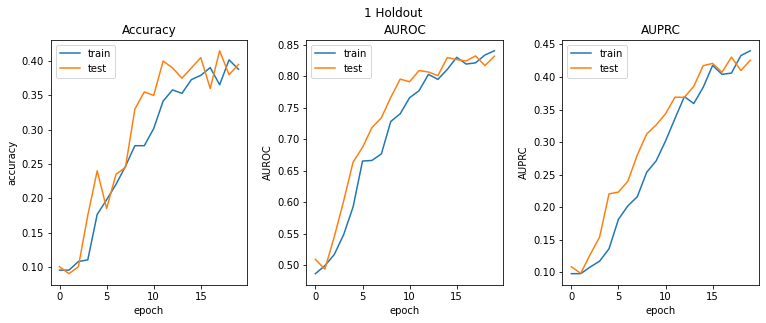

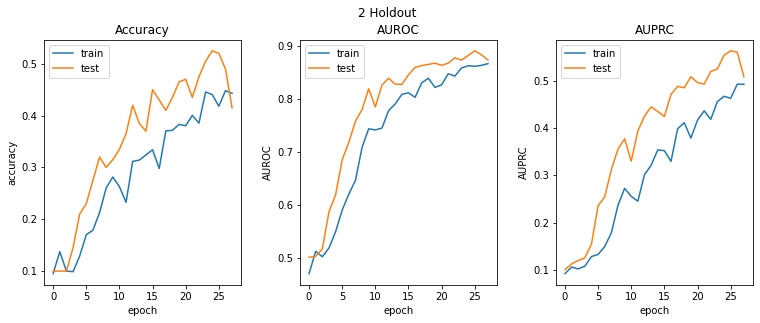

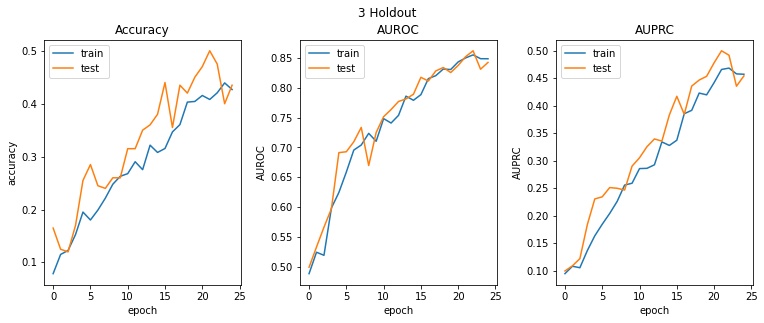

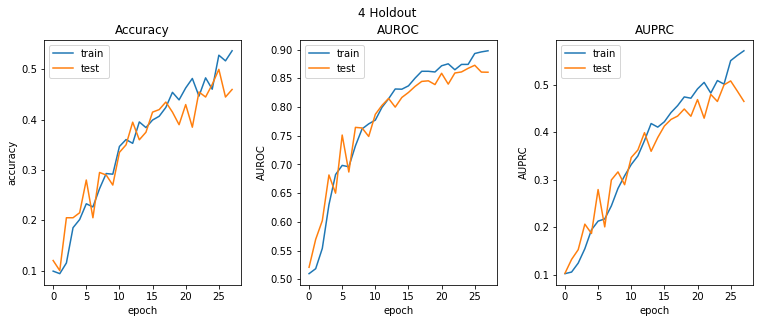

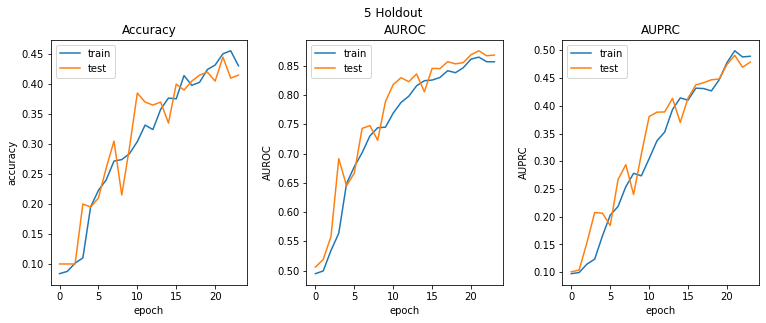

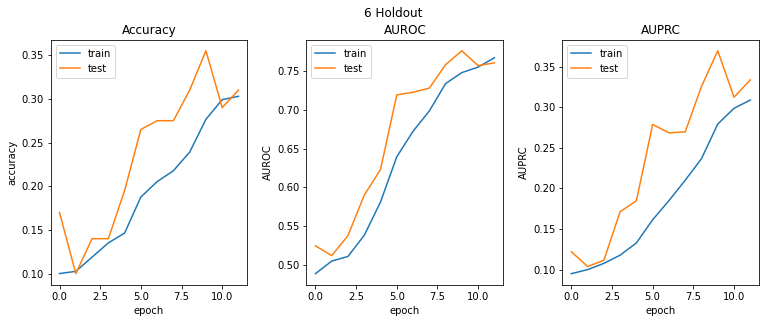

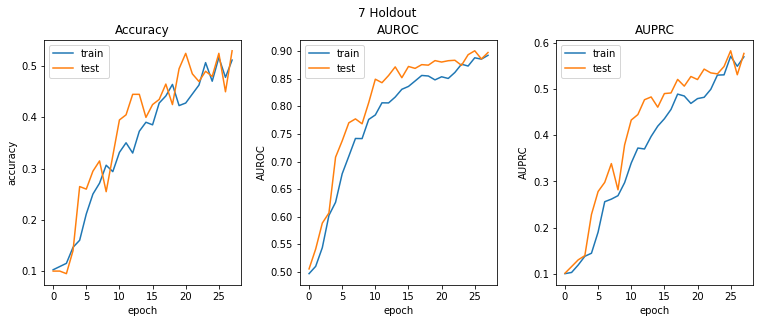

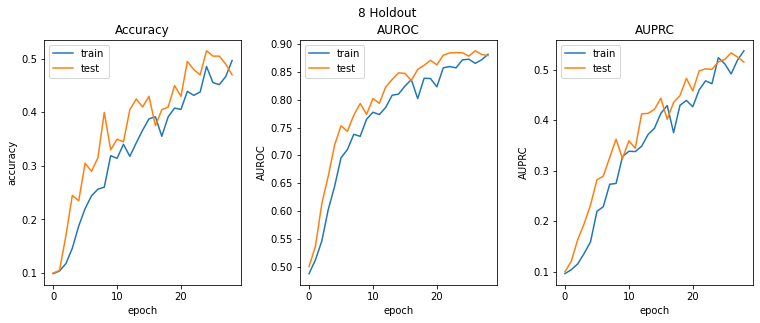

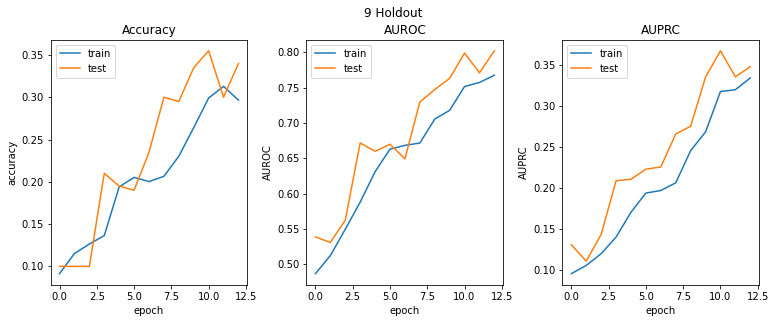

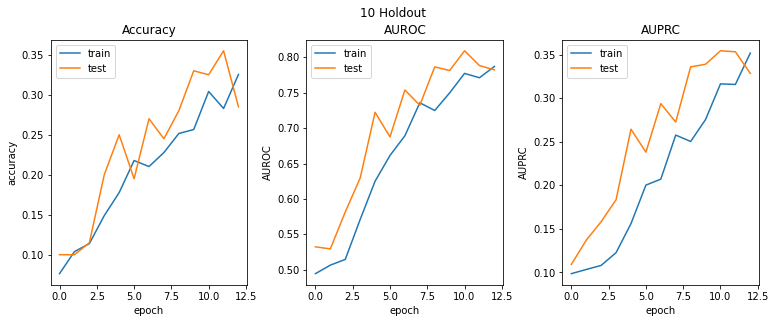

----------------------------------------------------------------------------------------------------


In [80]:
CNN_metrics_estimate = model_metrics_holdout_estimate(CNN_MelS_30s_metrics, number_of_splits)
print(f"CNN Mel spectrogram 30s Metrics - {number_of_splits}-holdouts estimate:")
print(f"Accuracy : train - {CNN_metrics_estimate['accuracy_train']}  --  test - {CNN_metrics_estimate['accuracy_test']}")
print(f"AUROC : train - {CNN_metrics_estimate['AUROC_train']}  --  test - {CNN_metrics_estimate['AUROC_test']}")
print(f"AUPRC : train - {CNN_metrics_estimate['AUPRC_train']}  --  test - {CNN_metrics_estimate['AUPRC_test']}")
print("-"*80)
print("CNN - Train history:")
plot_train_history(CNN_MelS_30s_history)
print("-"*100)

#### 3s Window STFT Spectrogram CNN
* Preprocessing consists of a **resize** of the images in a (100,130) format.

In [65]:
data['spectrogram'][sample].shape

(1025, 130)

In [85]:
print("---- 3s window Spectrogram - Fixed CNN ----")

resized_input_data = resize(data['spectrogram'], (130, 100))
input_data = [np.expand_dims(x, axis=-1) for x in resized_input_data]
data_labels = data['labels_3s']

CNN_S_3s_metrics = []
CNN_S_3s_history = []

# Generate holdouts
for holdout_number, (train_indices, test_indices) in enumerate(tqdm(holdouts_generator.split(input_data, data_labels))):
    print(f"-- HOLDOUT {holdout_number+1}")
    # Train/Test data
    x_train, x_test = np.array([input_data[x] for x in train_indices]), np.array([input_data[x] for x in test_indices])
    y_train, y_test = data_labels.iloc[train_indices], data_labels.iloc[test_indices]

    # One-hot encoding
    y_train = one_hot_encoding(y_train, 10)
    y_test = one_hot_encoding(y_test, 10)

    # Build CNN
    CNN = build_fixed_CNN_S(x_train.shape[1:])

    print("- Training model:\n")
    CNN_holdout_metrics, CNN_holdout_history = train_model(
        CNN,
        np.array(x_train),
        np.array(x_test),
        y_train.values,
        y_test.values,
        epochs,
        batch_size
    )

    CNN_S_3s_metrics.append(CNN_holdout_metrics)
    CNN_S_3s_history.append(CNN_holdout_history)

---- 3s window Spectrogram - Fixed CNN ----


0it [00:00, ?it/s]

-- HOLDOUT 1
Model: "CNN_S_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_88 (Conv2D)          (None, 100, 130, 128)     1280      
                                                                 
 max_pooling2d_67 (MaxPoolin  (None, 50, 65, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_89 (Conv2D)          (None, 50, 65, 64)        73792     
                                                                 
 max_pooling2d_68 (MaxPoolin  (None, 25, 33, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_90 (Conv2D)          (None, 25, 33, 64)        36928     
                                                                 
 max_pooling2d_69 (MaxPoolin  (None, 13, 17, 

1it [01:09, 69.19s/it]

-- HOLDOUT 2
Model: "CNN_S_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_92 (Conv2D)          (None, 100, 130, 128)     1280      
                                                                 
 max_pooling2d_70 (MaxPoolin  (None, 50, 65, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_93 (Conv2D)          (None, 50, 65, 64)        73792     
                                                                 
 max_pooling2d_71 (MaxPoolin  (None, 25, 33, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_94 (Conv2D)          (None, 25, 33, 64)        36928     
                                                                 
 max_pooling2d_72 (MaxPoolin  (None, 13, 17, 

2it [02:22, 71.85s/it]

-- HOLDOUT 3
Model: "CNN_S_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_96 (Conv2D)          (None, 100, 130, 128)     1280      
                                                                 
 max_pooling2d_73 (MaxPoolin  (None, 50, 65, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_97 (Conv2D)          (None, 50, 65, 64)        73792     
                                                                 
 max_pooling2d_74 (MaxPoolin  (None, 25, 33, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_98 (Conv2D)          (None, 25, 33, 64)        36928     
                                                                 
 max_pooling2d_75 (MaxPoolin  (None, 13, 17, 

3it [03:36, 72.78s/it]

-- HOLDOUT 4
Model: "CNN_S_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_100 (Conv2D)         (None, 100, 130, 128)     1280      
                                                                 
 max_pooling2d_76 (MaxPoolin  (None, 50, 65, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_101 (Conv2D)         (None, 50, 65, 64)        73792     
                                                                 
 max_pooling2d_77 (MaxPoolin  (None, 25, 33, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_102 (Conv2D)         (None, 25, 33, 64)        36928     
                                                                 
 max_pooling2d_78 (MaxPoolin  (None, 13, 17, 

4it [04:57, 75.82s/it]

-- HOLDOUT 5
Model: "CNN_S_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_104 (Conv2D)         (None, 100, 130, 128)     1280      
                                                                 
 max_pooling2d_79 (MaxPoolin  (None, 50, 65, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_105 (Conv2D)         (None, 50, 65, 64)        73792     
                                                                 
 max_pooling2d_80 (MaxPoolin  (None, 25, 33, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_106 (Conv2D)         (None, 25, 33, 64)        36928     
                                                                 
 max_pooling2d_81 (MaxPoolin  (None, 13, 17, 

5it [05:57, 70.31s/it]

-- HOLDOUT 6
Model: "CNN_S_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_108 (Conv2D)         (None, 100, 130, 128)     1280      
                                                                 
 max_pooling2d_82 (MaxPoolin  (None, 50, 65, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_109 (Conv2D)         (None, 50, 65, 64)        73792     
                                                                 
 max_pooling2d_83 (MaxPoolin  (None, 25, 33, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_110 (Conv2D)         (None, 25, 33, 64)        36928     
                                                                 
 max_pooling2d_84 (MaxPoolin  (None, 13, 17, 

6it [07:08, 70.57s/it]

-- HOLDOUT 7
Model: "CNN_S_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_112 (Conv2D)         (None, 100, 130, 128)     1280      
                                                                 
 max_pooling2d_85 (MaxPoolin  (None, 50, 65, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_113 (Conv2D)         (None, 50, 65, 64)        73792     
                                                                 
 max_pooling2d_86 (MaxPoolin  (None, 25, 33, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_114 (Conv2D)         (None, 25, 33, 64)        36928     
                                                                 
 max_pooling2d_87 (MaxPoolin  (None, 13, 17, 

7it [07:56, 62.91s/it]

-- HOLDOUT 8
Model: "CNN_S_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_116 (Conv2D)         (None, 100, 130, 128)     1280      
                                                                 
 max_pooling2d_88 (MaxPoolin  (None, 50, 65, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_117 (Conv2D)         (None, 50, 65, 64)        73792     
                                                                 
 max_pooling2d_89 (MaxPoolin  (None, 25, 33, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_118 (Conv2D)         (None, 25, 33, 64)        36928     
                                                                 
 max_pooling2d_90 (MaxPoolin  (None, 13, 17, 

8it [09:02, 63.94s/it]

-- HOLDOUT 9
Model: "CNN_S_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_120 (Conv2D)         (None, 100, 130, 128)     1280      
                                                                 
 max_pooling2d_91 (MaxPoolin  (None, 50, 65, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_121 (Conv2D)         (None, 50, 65, 64)        73792     
                                                                 
 max_pooling2d_92 (MaxPoolin  (None, 25, 33, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_122 (Conv2D)         (None, 25, 33, 64)        36928     
                                                                 
 max_pooling2d_93 (MaxPoolin  (None, 13, 17, 

9it [10:17, 67.53s/it]

-- HOLDOUT 10
Model: "CNN_S_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_124 (Conv2D)         (None, 100, 130, 128)     1280      
                                                                 
 max_pooling2d_94 (MaxPoolin  (None, 50, 65, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_125 (Conv2D)         (None, 50, 65, 64)        73792     
                                                                 
 max_pooling2d_95 (MaxPoolin  (None, 25, 33, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_126 (Conv2D)         (None, 25, 33, 64)        36928     
                                                                 
 max_pooling2d_96 (MaxPoolin  (None, 13, 17,

10it [11:27, 68.74s/it]


CNN Metrics - 10-holdouts estimate:
Accuracy : train - 0.8699649333953857  --  test - 0.704757136106491
AUROC : train - 0.9898907244205475  --  test - 0.951000201702118
AUPRC : train - 0.9411249101161957  --  test - 0.7865305840969086
--------------------------------------------------------------------------------
CNN - Train history:


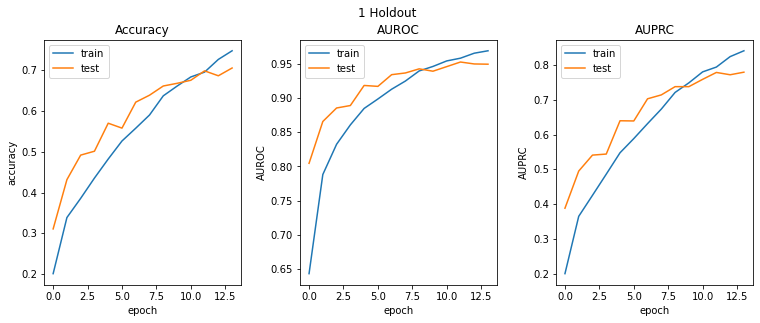

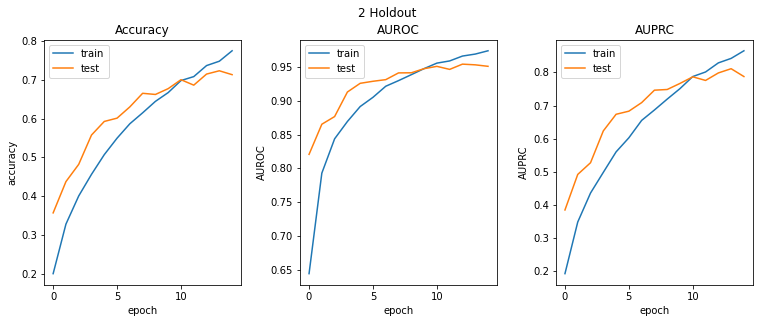

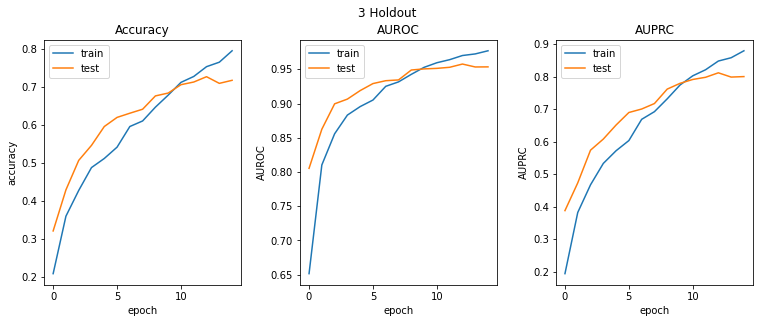

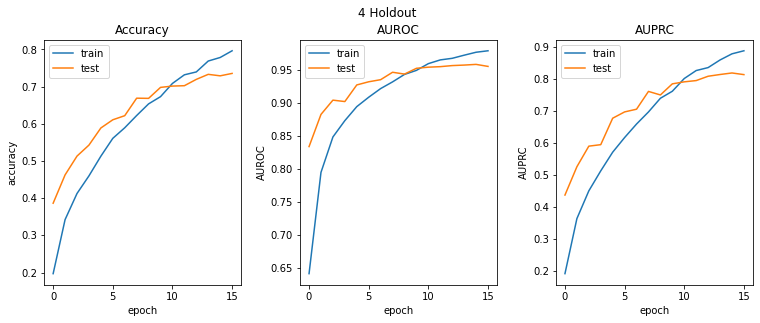

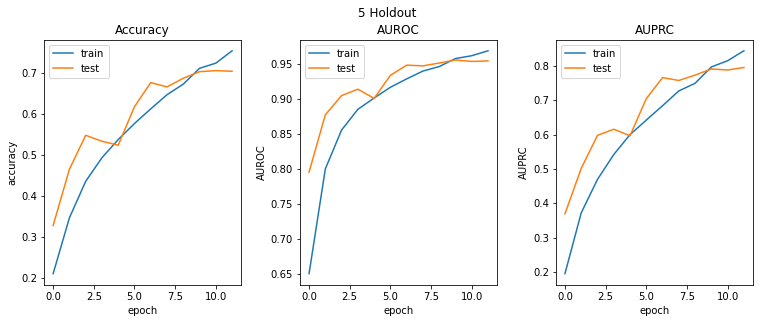

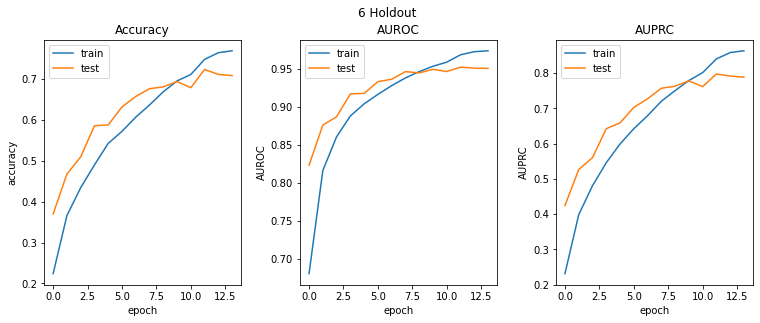

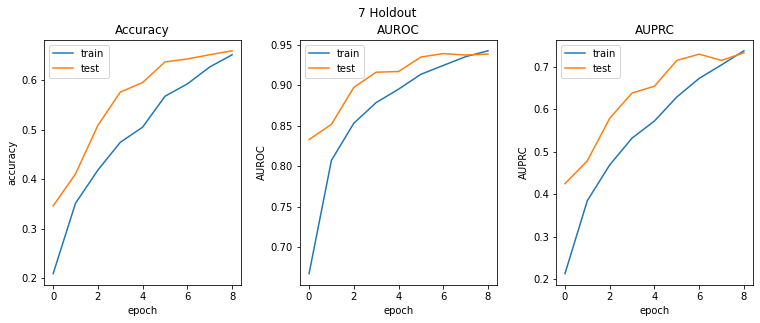

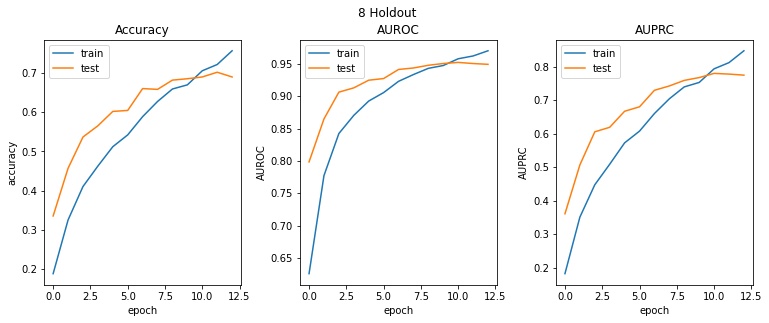

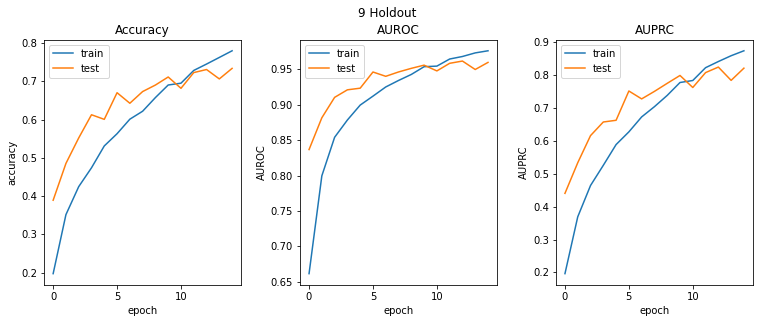

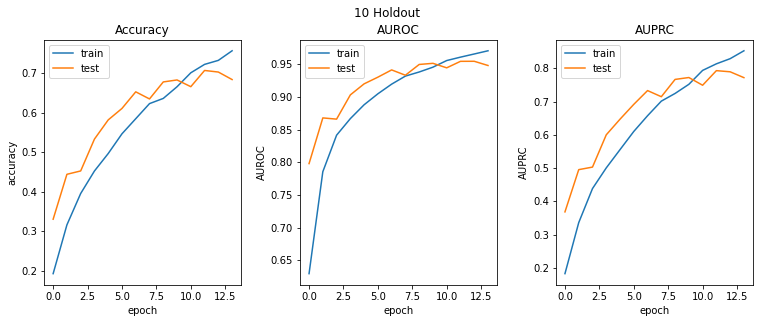

----------------------------------------------------------------------------------------------------


In [86]:
CNN_metrics_estimate = model_metrics_holdout_estimate(CNN_S_3s_metrics, number_of_splits)
print(f"CNN Metrics - {number_of_splits}-holdouts estimate:")
print(f"Accuracy : train - {CNN_metrics_estimate['accuracy_train']}  --  test - {CNN_metrics_estimate['accuracy_test']}")
print(f"AUROC : train - {CNN_metrics_estimate['AUROC_train']}  --  test - {CNN_metrics_estimate['AUROC_test']}")
print(f"AUPRC : train - {CNN_metrics_estimate['AUPRC_train']}  --  test - {CNN_metrics_estimate['AUPRC_test']}")
print("-"*80)
print("CNN - Train history:")
plot_train_history(CNN_S_3s_history)
print("-"*100)

#### 3s Window Mel Spectrogram CNN

In [34]:
data['mel_spectrogram_3s'][sample].shape

(128, 130)

In [59]:
print("---- 3s window Mel Spectrogram - Fixed CNN ----")

input_data = [np.expand_dims(x, axis=-1) for x in data['mel_spectrogram_3s']]
data_labels = data['labels_3s']

CNN_MelS_3s_metrics = []
CNN_MelS_3s_history = []

# Generate holdouts
for holdout_number, (train_indices, test_indices) in enumerate(tqdm(holdouts_generator.split(input_data, data_labels))):
    print(f"-- HOLDOUT {holdout_number+1}")
    # Train/Test data
    x_train, x_test = np.array([input_data[x] for x in train_indices]), np.array([input_data[x] for x in test_indices])
    y_train, y_test = data_labels.iloc[train_indices], data_labels.iloc[test_indices]

    # One-hot encoding
    y_train = one_hot_encoding(y_train, 10)
    y_test = one_hot_encoding(y_test, 10)

    # Build CNN
    CNN = build_fixed_CNN_melS(x_train.shape[1:])

    print("- Training model:\n")
    CNN_holdout_metrics, CNN_holdout_history = train_model(
        CNN,
        np.array(x_train),
        np.array(x_test),
        y_train.values,
        y_test.values,
        epochs,
        batch_size
    )

    CNN_MelS_3s_metrics.append(CNN_holdout_metrics)
    CNN_MelS_3s_history.append(CNN_holdout_history)

---- 3s window Mel Spectrogram - Fixed CNN ----


0it [00:00, ?it/s]

-- HOLDOUT 1
Model: "CNN_MelS_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 128, 130, 64)      640       
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 64, 65, 64)       0         
 2D)                                                             
                                                                 
 conv2d_13 (Conv2D)          (None, 64, 65, 64)        36928     
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 32, 33, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 32, 33, 128)       73856     
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 16, 1

1it [01:17, 77.65s/it]

-- HOLDOUT 2
Model: "CNN_MelS_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_16 (Conv2D)          (None, 128, 130, 64)      640       
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 64, 65, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_17 (Conv2D)          (None, 64, 65, 64)        36928     
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 32, 33, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_18 (Conv2D)          (None, 32, 33, 128)       73856     
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 16, 1

2it [02:33, 76.88s/it]

-- HOLDOUT 3
Model: "CNN_MelS_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_20 (Conv2D)          (None, 128, 130, 64)      640       
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 64, 65, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_21 (Conv2D)          (None, 64, 65, 64)        36928     
                                                                 
 max_pooling2d_16 (MaxPoolin  (None, 32, 33, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_22 (Conv2D)          (None, 32, 33, 128)       73856     
                                                                 
 max_pooling2d_17 (MaxPoolin  (None, 16, 1

3it [03:49, 76.30s/it]

-- HOLDOUT 4
Model: "CNN_MelS_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 128, 130, 64)      640       
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 64, 65, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_25 (Conv2D)          (None, 64, 65, 64)        36928     
                                                                 
 max_pooling2d_19 (MaxPoolin  (None, 32, 33, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_26 (Conv2D)          (None, 32, 33, 128)       73856     
                                                                 
 max_pooling2d_20 (MaxPoolin  (None, 16, 1

4it [04:52, 71.13s/it]

-- HOLDOUT 5
Model: "CNN_MelS_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_28 (Conv2D)          (None, 128, 130, 64)      640       
                                                                 
 max_pooling2d_21 (MaxPoolin  (None, 64, 65, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_29 (Conv2D)          (None, 64, 65, 64)        36928     
                                                                 
 max_pooling2d_22 (MaxPoolin  (None, 32, 33, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_30 (Conv2D)          (None, 32, 33, 128)       73856     
                                                                 
 max_pooling2d_23 (MaxPoolin  (None, 16, 1

5it [05:57, 68.65s/it]

-- HOLDOUT 6
Model: "CNN_MelS_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_32 (Conv2D)          (None, 128, 130, 64)      640       
                                                                 
 max_pooling2d_24 (MaxPoolin  (None, 64, 65, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_33 (Conv2D)          (None, 64, 65, 64)        36928     
                                                                 
 max_pooling2d_25 (MaxPoolin  (None, 32, 33, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_34 (Conv2D)          (None, 32, 33, 128)       73856     
                                                                 
 max_pooling2d_26 (MaxPoolin  (None, 16, 1

6it [07:00, 66.75s/it]

-- HOLDOUT 7
Model: "CNN_MelS_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_36 (Conv2D)          (None, 128, 130, 64)      640       
                                                                 
 max_pooling2d_27 (MaxPoolin  (None, 64, 65, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_37 (Conv2D)          (None, 64, 65, 64)        36928     
                                                                 
 max_pooling2d_28 (MaxPoolin  (None, 32, 33, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_38 (Conv2D)          (None, 32, 33, 128)       73856     
                                                                 
 max_pooling2d_29 (MaxPoolin  (None, 16, 1

7it [08:07, 66.90s/it]

-- HOLDOUT 8
Model: "CNN_MelS_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_40 (Conv2D)          (None, 128, 130, 64)      640       
                                                                 
 max_pooling2d_30 (MaxPoolin  (None, 64, 65, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_41 (Conv2D)          (None, 64, 65, 64)        36928     
                                                                 
 max_pooling2d_31 (MaxPoolin  (None, 32, 33, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_42 (Conv2D)          (None, 32, 33, 128)       73856     
                                                                 
 max_pooling2d_32 (MaxPoolin  (None, 16, 1

8it [09:23, 69.88s/it]

-- HOLDOUT 9
Model: "CNN_MelS_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_44 (Conv2D)          (None, 128, 130, 64)      640       
                                                                 
 max_pooling2d_33 (MaxPoolin  (None, 64, 65, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_45 (Conv2D)          (None, 64, 65, 64)        36928     
                                                                 
 max_pooling2d_34 (MaxPoolin  (None, 32, 33, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_46 (Conv2D)          (None, 32, 33, 128)       73856     
                                                                 
 max_pooling2d_35 (MaxPoolin  (None, 16, 1

9it [10:41, 72.47s/it]

-- HOLDOUT 10
Model: "CNN_MelS_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_48 (Conv2D)          (None, 128, 130, 64)      640       
                                                                 
 max_pooling2d_36 (MaxPoolin  (None, 64, 65, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_49 (Conv2D)          (None, 64, 65, 64)        36928     
                                                                 
 max_pooling2d_37 (MaxPoolin  (None, 32, 33, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_50 (Conv2D)          (None, 32, 33, 128)       73856     
                                                                 
 max_pooling2d_38 (MaxPoolin  (None, 16, 

10it [11:50, 71.10s/it]


CNN Metrics - 10-holdouts estimate:
Accuracy : train - 0.8564879775047303  --  test - 0.7238357603549957
AUROC : train - 0.9883146703243255  --  test - 0.9539275467395782
AUPRC : train - 0.9345849871635437  --  test - 0.8043521642684937
--------------------------------------------------------------------------------
CNN - Train history:


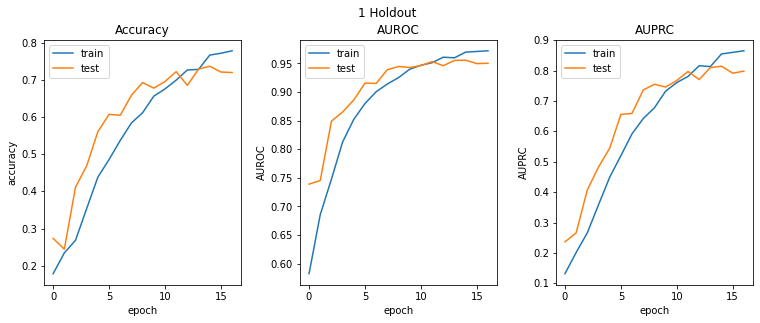

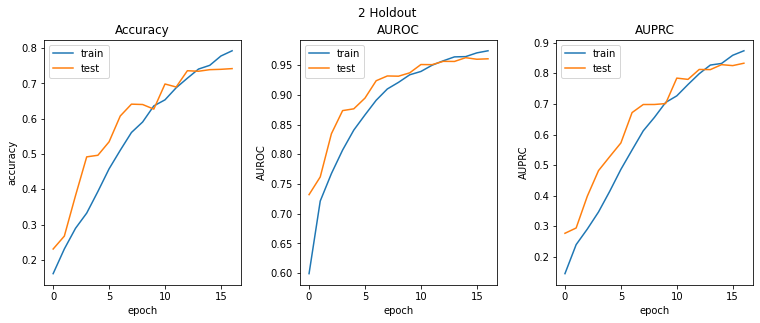

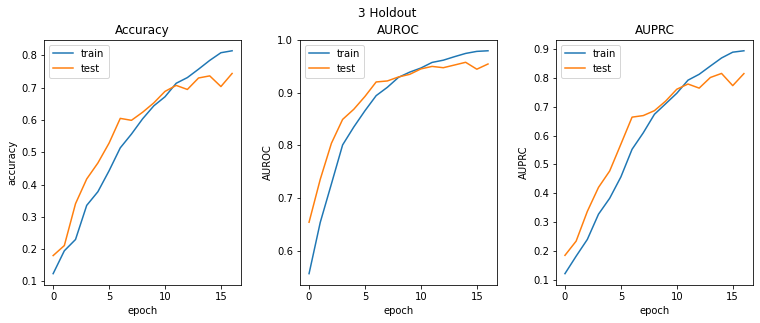

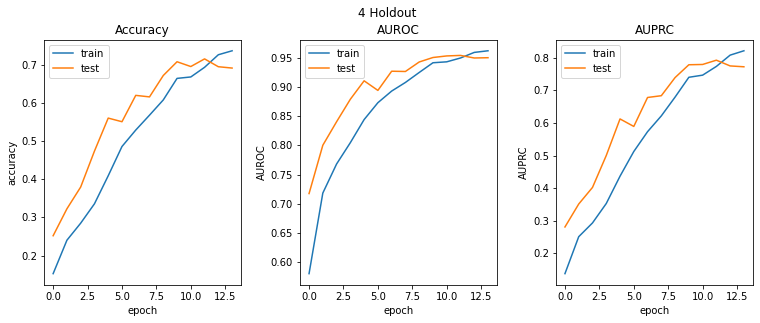

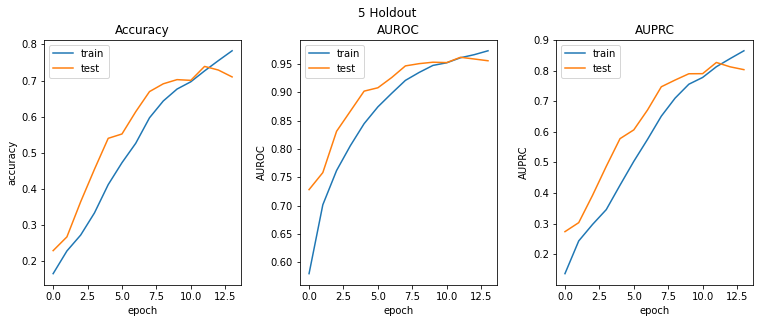

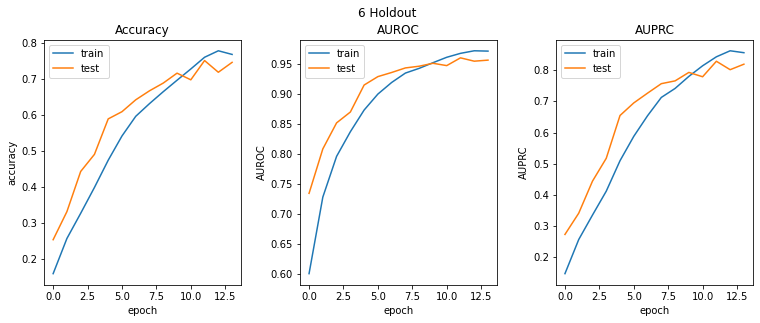

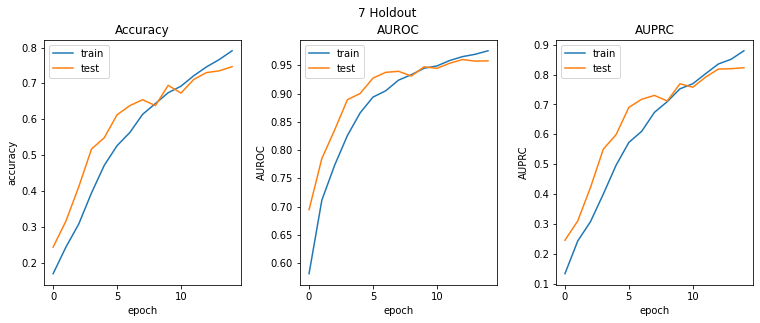

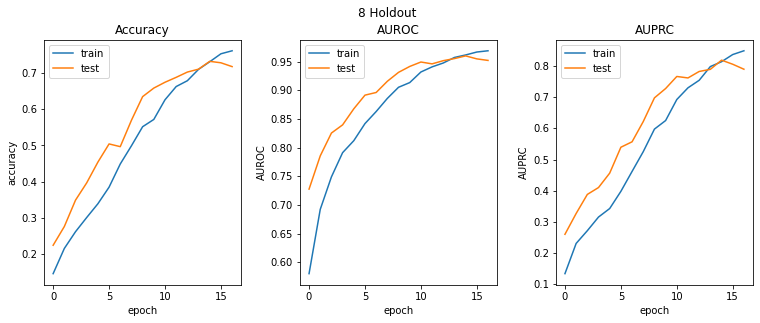

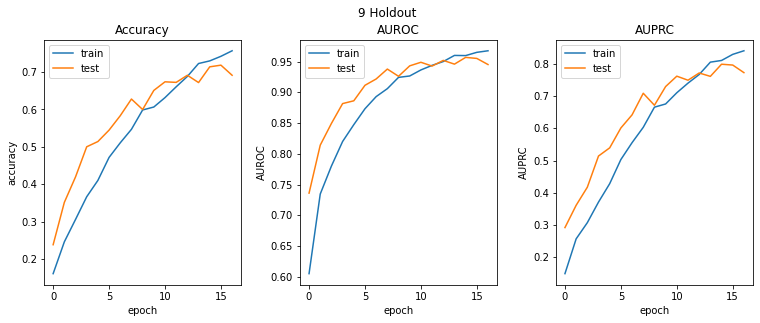

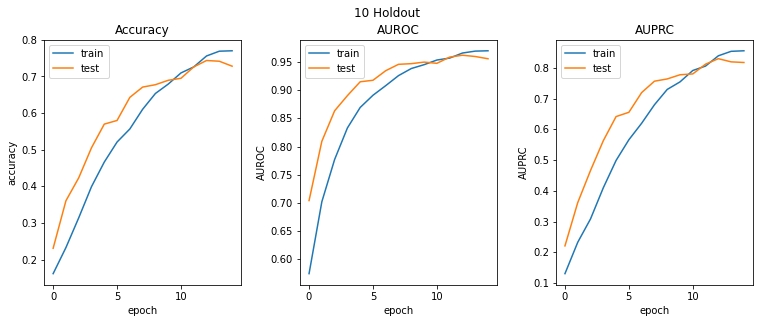

----------------------------------------------------------------------------------------------------


In [60]:
CNN_metrics_estimate = model_metrics_holdout_estimate(CNN_MelS_3s_metrics, number_of_splits)
print(f"CNN Metrics - {number_of_splits}-holdouts estimate:")
print(f"Accuracy : train - {CNN_metrics_estimate['accuracy_train']}  --  test - {CNN_metrics_estimate['accuracy_test']}")
print(f"AUROC : train - {CNN_metrics_estimate['AUROC_train']}  --  test - {CNN_metrics_estimate['AUROC_test']}")
print(f"AUPRC : train - {CNN_metrics_estimate['AUPRC_train']}  --  test - {CNN_metrics_estimate['AUPRC_test']}")
print("-"*80)
print("CNN - Train history:")
plot_train_history(CNN_MelS_3s_history)
print("-"*100)

#### 3s Window Mfccs CNN
* Preprocessing consists of a **Cepstral mean and variance normalization** over a sliding window (CMVNW).  
CMVN minimizes distortion by noise contamination for robust feature extraction by linearly transforming the cepstral coefficients to have the same segmental statistics.

In [44]:
data['mfccs'][22].shape

(20, 130)

In [45]:
from speechpy.processing import cmvnw

In [81]:
print("---- 3s window Mfccs - Fixed CNN ----")

normalized_input_data = [cmvnw(np.array(x), win_size=301, variance_normalization=True) for x in data['mfccs']]
input_data = [np.expand_dims(x, axis=-1) for x in normalized_input_data]
data_labels = data['labels_3s']

CNN_mfccs_3s_metrics = []
CNN_mfccs_3s_history = []

# Generate holdouts
for holdout_number, (train_indices, test_indices) in enumerate(tqdm(holdouts_generator.split(input_data, data_labels))):
    print(f"-- HOLDOUT {holdout_number+1}")
    # Train/Test data
    x_train, x_test = np.array([input_data[x] for x in train_indices]), np.array([input_data[x] for x in test_indices])
    y_train, y_test = data_labels.iloc[train_indices], data_labels.iloc[test_indices]
    
    # One-hot encoding
    y_train = one_hot_encoding(y_train, 10)
    y_test = one_hot_encoding(y_test, 10)

    # Build CNN with best set of hyperparameters
    CNN = build_fixed_CNN_mfccs(x_train.shape[1:])

    print("- Training model:\n")
    CNN_holdout_metrics, CNN_holdout_history = train_model(
        CNN,
        x_train,
        x_test,
        y_train.values,
        y_test.values,
        epochs,
        batch_size
    )

    CNN_mfccs_3s_metrics.append(CNN_holdout_metrics)
    CNN_mfccs_3s_history.append(CNN_holdout_history)

---- 3s window Mfccs - Fixed CNN ----


0it [00:00, ?it/s]

-- HOLDOUT 1
Model: "CNN_Mfccs_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_304 (Conv2D)         (None, 20, 130, 256)      2560      
                                                                 
 max_pooling2d_304 (MaxPooli  (None, 10, 65, 256)      0         
 ng2D)                                                           
                                                                 
 conv2d_305 (Conv2D)         (None, 10, 65, 256)       590080    
                                                                 
 max_pooling2d_305 (MaxPooli  (None, 5, 33, 256)       0         
 ng2D)                                                           
                                                                 
 conv2d_306 (Conv2D)         (None, 5, 33, 256)        590080    
                                                                 
 max_pooling2d_306 (MaxPooli  (None, 3, 1

Epoch 11/100
63/63 [==============================] - 1s 8ms/step - loss: 0.8358 - accuracy: 0.7141 - recall: 0.6249 - precision: 0.8088 - AUROC: 0.9593 - AUPRC: 0.8009 - f1_score: 0.7051 - balanced_accuracy: 0.8043 - specificity: 0.9836 - miss_rate: 0.3751 - fall_out: 0.0164 - mcc: 0.6837


1it [00:39, 39.69s/it]

-- HOLDOUT 2
Model: "CNN_Mfccs_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_308 (Conv2D)         (None, 20, 130, 256)      2560      
                                                                 
 max_pooling2d_308 (MaxPooli  (None, 10, 65, 256)      0         
 ng2D)                                                           
                                                                 
 conv2d_309 (Conv2D)         (None, 10, 65, 256)       590080    
                                                                 
 max_pooling2d_309 (MaxPooli  (None, 5, 33, 256)       0         
 ng2D)                                                           
                                                                 
 conv2d_310 (Conv2D)         (None, 5, 33, 256)        590080    
                                                                 
 max_pooling2d_310 (MaxPooli  (None, 3, 1

Epoch 11/100
63/63 [==============================] - 3s 49ms/step - loss: 0.7929 - accuracy: 0.7278 - recall: 0.6253 - precision: 0.8220 - AUROC: 0.9634 - AUPRC: 0.8138 - f1_score: 0.7103 - balanced_accuracy: 0.8051 - specificity: 0.9850 - miss_rate: 0.3747 - fall_out: 0.0150 - mcc: 0.6905 - val_loss: 0.8294 - val_accuracy: 0.7191 - val_recall: 0.6309 - val_precision: 0.8051 - val_AUROC: 0.9603 - val_AUPRC: 0.8000 - val_f1_score: 0.7075 - val_balanced_accuracy: 0.8070 - val_specificity: 0.9830 - val_miss_rate: 0.3691 - val_fall_out: 0.0170 - val_mcc: 0.6854
Epoch 12/100
63/63 [==============================] - 3s 51ms/step - loss: 0.7454 - accuracy: 0.7457 - recall: 0.6543 - precision: 0.8357 - AUROC: 0.9677 - AUPRC: 0.8328 - f1_score: 0.7340 - balanced_accuracy: 0.8200 - specificity: 0.9857 - miss_rate: 0.3457 - fall_out: 0.0143 - mcc: 0.7147 - val_loss: 0.7498 - val_accuracy: 0.7411 - val_recall: 0.6600 - val_precision: 0.8274 - val_AUROC: 0.9666 - val_AUPRC: 0.8349 - val_f1_score: 

2it [01:28, 45.29s/it]

-- HOLDOUT 3
Model: "CNN_Mfccs_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_312 (Conv2D)         (None, 20, 130, 256)      2560      
                                                                 
 max_pooling2d_312 (MaxPooli  (None, 10, 65, 256)      0         
 ng2D)                                                           
                                                                 
 conv2d_313 (Conv2D)         (None, 10, 65, 256)       590080    
                                                                 
 max_pooling2d_313 (MaxPooli  (None, 5, 33, 256)       0         
 ng2D)                                                           
                                                                 
 conv2d_314 (Conv2D)         (None, 5, 33, 256)        590080    
                                                                 
 max_pooling2d_314 (MaxPooli  (None, 3, 1

Epoch 11/100
63/63 [==============================] - 3s 50ms/step - loss: 0.6934 - accuracy: 0.7653 - recall: 0.6789 - precision: 0.8511 - AUROC: 0.9717 - AUPRC: 0.8521 - f1_score: 0.7553 - balanced_accuracy: 0.8328 - specificity: 0.9868 - miss_rate: 0.3211 - fall_out: 0.0132 - mcc: 0.7371 - val_loss: 0.7281 - val_accuracy: 0.7566 - val_recall: 0.7031 - val_precision: 0.8235 - val_AUROC: 0.9673 - val_AUPRC: 0.8452 - val_f1_score: 0.7585 - val_balanced_accuracy: 0.8432 - val_specificity: 0.9833 - val_miss_rate: 0.2969 - val_fall_out: 0.0167 - val_mcc: 0.7368
Epoch 12/100
63/63 [==============================] - 3s 50ms/step - loss: 0.6075 - accuracy: 0.7993 - recall: 0.7288 - precision: 0.8694 - AUROC: 0.9771 - AUPRC: 0.8810 - f1_score: 0.7929 - balanced_accuracy: 0.8583 - specificity: 0.9878 - miss_rate: 0.2712 - fall_out: 0.0122 - mcc: 0.7758 - val_loss: 0.7564 - val_accuracy: 0.7466 - val_recall: 0.6720 - val_precision: 0.8284 - val_AUROC: 0.9661 - val_AUPRC: 0.8357 - val_f1_score: 

3it [02:15, 45.83s/it]

-- HOLDOUT 4
Model: "CNN_Mfccs_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_316 (Conv2D)         (None, 20, 130, 256)      2560      
                                                                 
 max_pooling2d_316 (MaxPooli  (None, 10, 65, 256)      0         
 ng2D)                                                           
                                                                 
 conv2d_317 (Conv2D)         (None, 10, 65, 256)       590080    
                                                                 
 max_pooling2d_317 (MaxPooli  (None, 5, 33, 256)       0         
 ng2D)                                                           
                                                                 
 conv2d_318 (Conv2D)         (None, 5, 33, 256)        590080    
                                                                 
 max_pooling2d_318 (MaxPooli  (None, 3, 1

Epoch 11/100
63/63 [==============================] - 3s 50ms/step - loss: 0.7250 - accuracy: 0.7610 - recall: 0.6698 - precision: 0.8410 - AUROC: 0.9689 - AUPRC: 0.8406 - f1_score: 0.7457 - balanced_accuracy: 0.8279 - specificity: 0.9859 - miss_rate: 0.3302 - fall_out: 0.0141 - mcc: 0.7266 - val_loss: 0.7841 - val_accuracy: 0.7316 - val_recall: 0.6510 - val_precision: 0.8270 - val_AUROC: 0.9636 - val_AUPRC: 0.8232 - val_f1_score: 0.7285 - val_balanced_accuracy: 0.8179 - val_specificity: 0.9849 - val_miss_rate: 0.3490 - val_fall_out: 0.0151 - val_mcc: 0.7083
Epoch 12/100
63/63 [==============================] - 3s 50ms/step - loss: 0.6811 - accuracy: 0.7758 - recall: 0.6901 - precision: 0.8539 - AUROC: 0.9723 - AUPRC: 0.8566 - f1_score: 0.7633 - balanced_accuracy: 0.8385 - specificity: 0.9869 - miss_rate: 0.3099 - fall_out: 0.0131 - mcc: 0.7452 - val_loss: 0.6620 - val_accuracy: 0.7807 - val_recall: 0.7246 - val_precision: 0.8542 - val_AUROC: 0.9735 - val_AUPRC: 0.8650 - val_f1_score: 

4it [03:16, 51.95s/it]

-- HOLDOUT 5
Model: "CNN_Mfccs_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_320 (Conv2D)         (None, 20, 130, 256)      2560      
                                                                 
 max_pooling2d_320 (MaxPooli  (None, 10, 65, 256)      0         
 ng2D)                                                           
                                                                 
 conv2d_321 (Conv2D)         (None, 10, 65, 256)       590080    
                                                                 
 max_pooling2d_321 (MaxPooli  (None, 5, 33, 256)       0         
 ng2D)                                                           
                                                                 
 conv2d_322 (Conv2D)         (None, 5, 33, 256)        590080    
                                                                 
 max_pooling2d_322 (MaxPooli  (None, 3, 1

Epoch 11/100
63/63 [==============================] - 3s 50ms/step - loss: 0.8712 - accuracy: 0.6961 - recall: 0.5758 - precision: 0.8072 - AUROC: 0.9566 - AUPRC: 0.7787 - f1_score: 0.6721 - balanced_accuracy: 0.7802 - specificity: 0.9847 - miss_rate: 0.4242 - fall_out: 0.0153 - mcc: 0.6533 - val_loss: 0.9157 - val_accuracy: 0.6785 - val_recall: 0.5984 - val_precision: 0.7597 - val_AUROC: 0.9517 - val_AUPRC: 0.7659 - val_f1_score: 0.6695 - val_balanced_accuracy: 0.7887 - val_specificity: 0.9790 - val_miss_rate: 0.4016 - val_fall_out: 0.0210 - val_mcc: 0.6430
Epoch 12/100
63/63 [==============================] - 3s 50ms/step - loss: 0.7690 - accuracy: 0.7365 - recall: 0.6354 - precision: 0.8257 - AUROC: 0.9655 - AUPRC: 0.8199 - f1_score: 0.7181 - balanced_accuracy: 0.8102 - specificity: 0.9851 - miss_rate: 0.3646 - fall_out: 0.0149 - mcc: 0.6984 - val_loss: 0.8051 - val_accuracy: 0.7211 - val_recall: 0.6450 - val_precision: 0.7936 - val_AUROC: 0.9628 - val_AUPRC: 0.8062 - val_f1_score: 

5it [04:11, 52.84s/it]

-- HOLDOUT 6
Model: "CNN_Mfccs_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_324 (Conv2D)         (None, 20, 130, 256)      2560      
                                                                 
 max_pooling2d_324 (MaxPooli  (None, 10, 65, 256)      0         
 ng2D)                                                           
                                                                 
 conv2d_325 (Conv2D)         (None, 10, 65, 256)       590080    
                                                                 
 max_pooling2d_325 (MaxPooli  (None, 5, 33, 256)       0         
 ng2D)                                                           
                                                                 
 conv2d_326 (Conv2D)         (None, 5, 33, 256)        590080    
                                                                 
 max_pooling2d_326 (MaxPooli  (None, 3, 1

Epoch 11/100
63/63 [==============================] - 3s 50ms/step - loss: 0.7050 - accuracy: 0.7604 - recall: 0.6740 - precision: 0.8454 - AUROC: 0.9709 - AUPRC: 0.8466 - f1_score: 0.7500 - balanced_accuracy: 0.8301 - specificity: 0.9863 - miss_rate: 0.3260 - fall_out: 0.0137 - mcc: 0.7313 - val_loss: 0.7538 - val_accuracy: 0.7376 - val_recall: 0.6715 - val_precision: 0.8217 - val_AUROC: 0.9660 - val_AUPRC: 0.8319 - val_f1_score: 0.7390 - val_balanced_accuracy: 0.8277 - val_specificity: 0.9838 - val_miss_rate: 0.3285 - val_fall_out: 0.0162 - val_mcc: 0.7177
Epoch 12/100
63/63 [==============================] - 3s 54ms/step - loss: 0.6096 - accuracy: 0.7945 - recall: 0.7233 - precision: 0.8643 - AUROC: 0.9777 - AUPRC: 0.8800 - f1_score: 0.7875 - balanced_accuracy: 0.8553 - specificity: 0.9874 - miss_rate: 0.2767 - fall_out: 0.0126 - mcc: 0.7699 - val_loss: 0.6340 - val_accuracy: 0.7782 - val_recall: 0.7236 - val_precision: 0.8431 - val_AUROC: 0.9772 - val_AUPRC: 0.8756 - val_f1_score: 

6it [05:03, 52.52s/it]

-- HOLDOUT 7
Model: "CNN_Mfccs_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_328 (Conv2D)         (None, 20, 130, 256)      2560      
                                                                 
 max_pooling2d_328 (MaxPooli  (None, 10, 65, 256)      0         
 ng2D)                                                           
                                                                 
 conv2d_329 (Conv2D)         (None, 10, 65, 256)       590080    
                                                                 
 max_pooling2d_329 (MaxPooli  (None, 5, 33, 256)       0         
 ng2D)                                                           
                                                                 
 conv2d_330 (Conv2D)         (None, 5, 33, 256)        590080    
                                                                 
 max_pooling2d_330 (MaxPooli  (None, 3, 1

Epoch 11/100
63/63 [==============================] - 3s 53ms/step - loss: 0.7658 - accuracy: 0.7415 - recall: 0.6443 - precision: 0.8337 - AUROC: 0.9658 - AUPRC: 0.8234 - f1_score: 0.7269 - balanced_accuracy: 0.8150 - specificity: 0.9857 - miss_rate: 0.3557 - fall_out: 0.0143 - mcc: 0.7078 - val_loss: 0.7890 - val_accuracy: 0.7216 - val_recall: 0.6139 - val_precision: 0.8461 - val_AUROC: 0.9655 - val_AUPRC: 0.8232 - val_f1_score: 0.7115 - val_balanced_accuracy: 0.8008 - val_specificity: 0.9876 - val_miss_rate: 0.3861 - val_fall_out: 0.0124 - val_mcc: 0.6956
Epoch 12/100
63/63 [==============================] - 3s 54ms/step - loss: 0.7580 - accuracy: 0.7436 - recall: 0.6449 - precision: 0.8351 - AUROC: 0.9663 - AUPRC: 0.8273 - f1_score: 0.7278 - balanced_accuracy: 0.8154 - specificity: 0.9858 - miss_rate: 0.3551 - fall_out: 0.0142 - mcc: 0.7088 - val_loss: 0.8280 - val_accuracy: 0.7111 - val_recall: 0.6249 - val_precision: 0.8067 - val_AUROC: 0.9603 - val_AUPRC: 0.7970 - val_f1_score: 

7it [06:01, 54.45s/it]

-- HOLDOUT 8
Model: "CNN_Mfccs_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_332 (Conv2D)         (None, 20, 130, 256)      2560      
                                                                 
 max_pooling2d_332 (MaxPooli  (None, 10, 65, 256)      0         
 ng2D)                                                           
                                                                 
 conv2d_333 (Conv2D)         (None, 10, 65, 256)       590080    
                                                                 
 max_pooling2d_333 (MaxPooli  (None, 5, 33, 256)       0         
 ng2D)                                                           
                                                                 
 conv2d_334 (Conv2D)         (None, 5, 33, 256)        590080    
                                                                 
 max_pooling2d_334 (MaxPooli  (None, 3, 1

Epoch 11/100
63/63 [==============================] - 3s 49ms/step - loss: 0.7795 - accuracy: 0.7316 - recall: 0.6318 - precision: 0.8270 - AUROC: 0.9647 - AUPRC: 0.8197 - f1_score: 0.7163 - balanced_accuracy: 0.8085 - specificity: 0.9853 - miss_rate: 0.3682 - fall_out: 0.0147 - mcc: 0.6969 - val_loss: 0.7809 - val_accuracy: 0.7331 - val_recall: 0.6149 - val_precision: 0.8510 - val_AUROC: 0.9659 - val_AUPRC: 0.8218 - val_f1_score: 0.7140 - val_balanced_accuracy: 0.8015 - val_specificity: 0.9880 - val_miss_rate: 0.3851 - val_fall_out: 0.0120 - val_mcc: 0.6986
Epoch 12/100
63/63 [==============================] - 3s 52ms/step - loss: 0.7493 - accuracy: 0.7381 - recall: 0.6433 - precision: 0.8309 - AUROC: 0.9675 - AUPRC: 0.8276 - f1_score: 0.7252 - balanced_accuracy: 0.8144 - specificity: 0.9855 - miss_rate: 0.3567 - fall_out: 0.0145 - mcc: 0.7058 - val_loss: 0.8611 - val_accuracy: 0.7016 - val_recall: 0.5769 - val_precision: 0.8000 - val_AUROC: 0.9578 - val_AUPRC: 0.7848 - val_f1_score: 

8it [07:01, 56.20s/it]

-- HOLDOUT 9
Model: "CNN_Mfccs_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_336 (Conv2D)         (None, 20, 130, 256)      2560      
                                                                 
 max_pooling2d_336 (MaxPooli  (None, 10, 65, 256)      0         
 ng2D)                                                           
                                                                 
 conv2d_337 (Conv2D)         (None, 10, 65, 256)       590080    
                                                                 
 max_pooling2d_337 (MaxPooli  (None, 5, 33, 256)       0         
 ng2D)                                                           
                                                                 
 conv2d_338 (Conv2D)         (None, 5, 33, 256)        590080    
                                                                 
 max_pooling2d_338 (MaxPooli  (None, 3, 1

Epoch 11/100
63/63 [==============================] - 3s 48ms/step - loss: 0.8637 - accuracy: 0.7050 - recall: 0.5877 - precision: 0.8125 - AUROC: 0.9573 - AUPRC: 0.7869 - f1_score: 0.6820 - balanced_accuracy: 0.7863 - specificity: 0.9849 - miss_rate: 0.4123 - fall_out: 0.0151 - mcc: 0.6632 - val_loss: 0.7985 - val_accuracy: 0.7226 - val_recall: 0.6254 - val_precision: 0.8217 - val_AUROC: 0.9640 - val_AUPRC: 0.8102 - val_f1_score: 0.7103 - val_balanced_accuracy: 0.8052 - val_specificity: 0.9849 - val_miss_rate: 0.3746 - val_fall_out: 0.0151 - val_mcc: 0.6905
Epoch 12/100
63/63 [==============================] - 3s 48ms/step - loss: 0.7823 - accuracy: 0.7356 - recall: 0.6414 - precision: 0.8297 - AUROC: 0.9644 - AUPRC: 0.8205 - f1_score: 0.7235 - balanced_accuracy: 0.8134 - specificity: 0.9854 - miss_rate: 0.3586 - fall_out: 0.0146 - mcc: 0.7041 - val_loss: 0.8332 - val_accuracy: 0.7076 - val_recall: 0.6209 - val_precision: 0.7979 - val_AUROC: 0.9603 - val_AUPRC: 0.7920 - val_f1_score: 

9it [07:59, 56.75s/it]

-- HOLDOUT 10
Model: "CNN_Mfccs_3s"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_340 (Conv2D)         (None, 20, 130, 256)      2560      
                                                                 
 max_pooling2d_340 (MaxPooli  (None, 10, 65, 256)      0         
 ng2D)                                                           
                                                                 
 conv2d_341 (Conv2D)         (None, 10, 65, 256)       590080    
                                                                 
 max_pooling2d_341 (MaxPooli  (None, 5, 33, 256)       0         
 ng2D)                                                           
                                                                 
 conv2d_342 (Conv2D)         (None, 5, 33, 256)        590080    
                                                                 
 max_pooling2d_342 (MaxPooli  (None, 3, 

Epoch 11/100
63/63 [==============================] - 3s 48ms/step - loss: 0.8332 - accuracy: 0.7136 - recall: 0.6081 - precision: 0.8124 - AUROC: 0.9598 - AUPRC: 0.7968 - f1_score: 0.6956 - balanced_accuracy: 0.7962 - specificity: 0.9844 - miss_rate: 0.3919 - fall_out: 0.0156 - mcc: 0.6755 - val_loss: 0.8841 - val_accuracy: 0.7001 - val_recall: 0.6234 - val_precision: 0.7920 - val_AUROC: 0.9551 - val_AUPRC: 0.7853 - val_f1_score: 0.6977 - val_balanced_accuracy: 0.8026 - val_specificity: 0.9818 - val_miss_rate: 0.3766 - val_fall_out: 0.0182 - val_mcc: 0.6742
Epoch 12/100
63/63 [==============================] - 3s 48ms/step - loss: 0.7536 - accuracy: 0.7399 - recall: 0.6475 - precision: 0.8331 - AUROC: 0.9668 - AUPRC: 0.8282 - f1_score: 0.7287 - balanced_accuracy: 0.8166 - specificity: 0.9856 - miss_rate: 0.3525 - fall_out: 0.0144 - mcc: 0.7094 - val_loss: 0.7631 - val_accuracy: 0.7376 - val_recall: 0.6505 - val_precision: 0.8332 - val_AUROC: 0.9665 - val_AUPRC: 0.8319 - val_f1_score: 

10it [08:51, 53.12s/it]


MLP Metrics - 10-holdouts estimate:
Accuracy : train - 0.9264278650283814  --  test - 0.7890836238861084
AUROC : train - 0.9966089308261872  --  test - 0.9697807788848877
AUPRC : train - 0.978346186876297  --  test - 0.8678218841552734
--------------------------------------------------------------------------------
MLP - Train history:


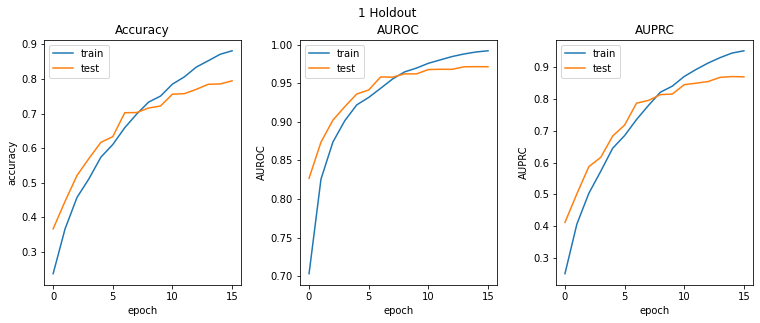

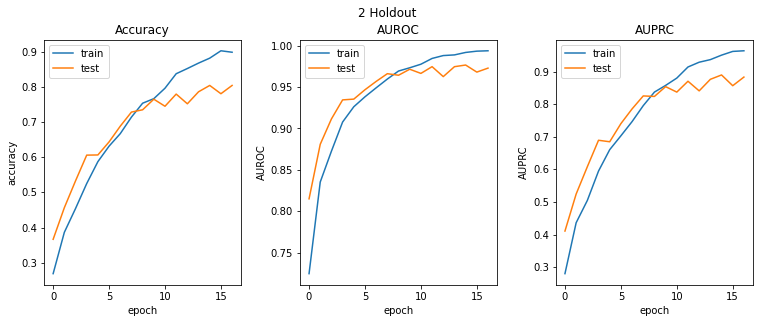

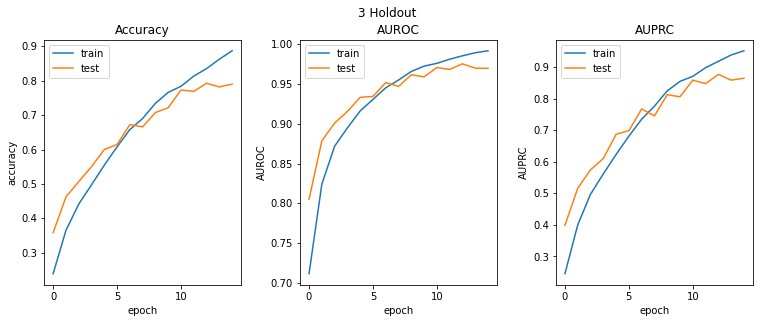

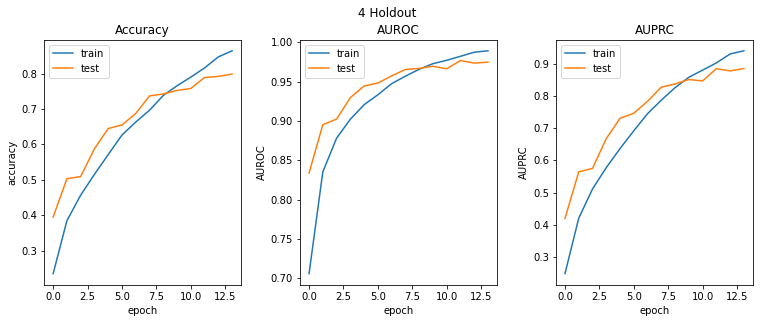

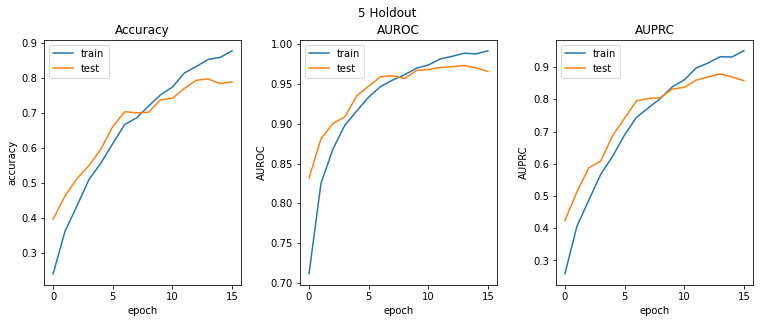

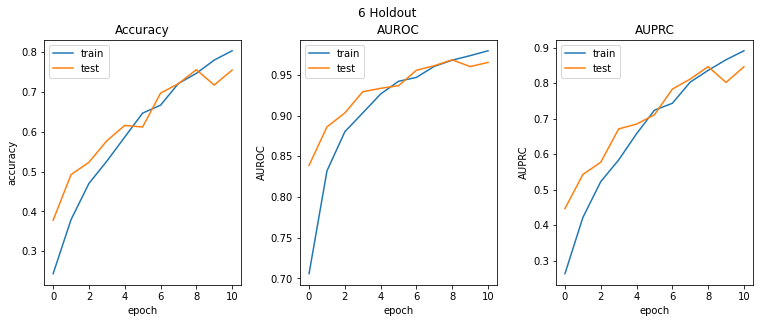

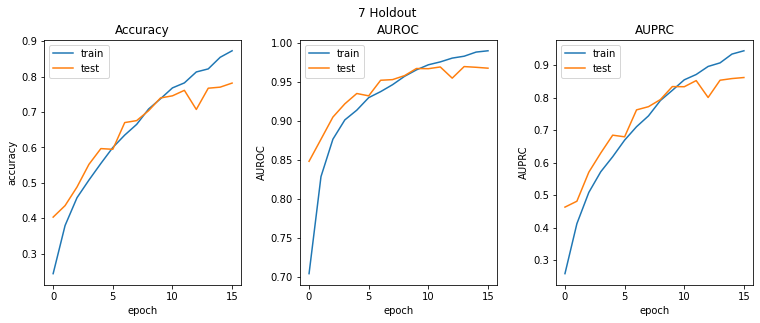

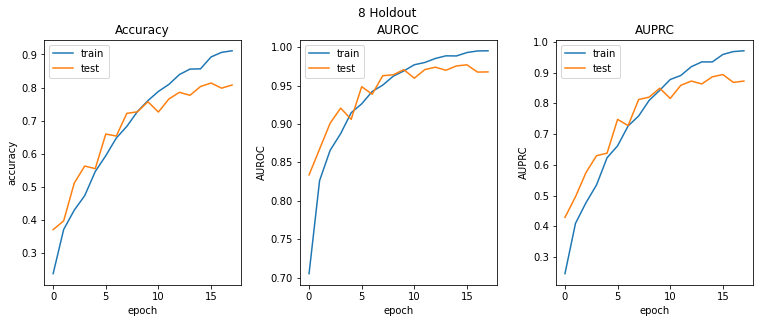

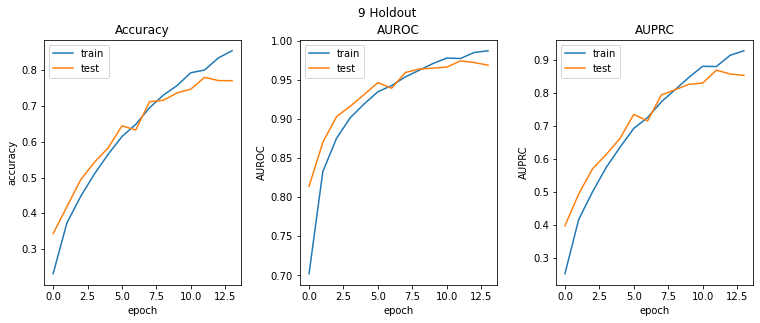

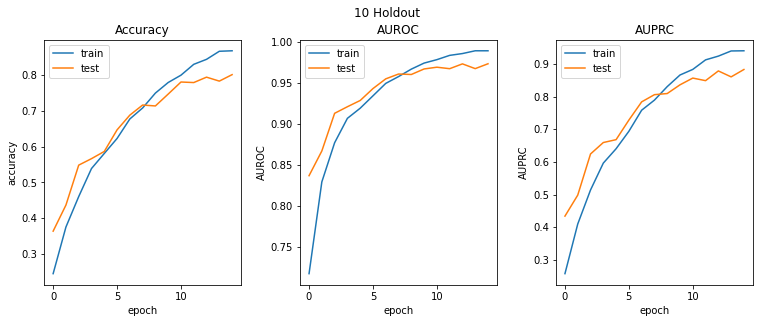

----------------------------------------------------------------------------------------------------


In [71]:
MLP_mfccs_metrics_estimate = model_metrics_holdout_estimate(CNN_mfccs_3s_metrics, number_of_splits)
print(f"MLP Metrics - {number_of_splits}-holdouts estimate:")
print(f"Accuracy : train - {MLP_mfccs_metrics_estimate['accuracy_train']}  --  test - {MLP_mfccs_metrics_estimate['accuracy_test']}")
print(f"AUROC : train - {MLP_mfccs_metrics_estimate['AUROC_train']}  --  test - {MLP_mfccs_metrics_estimate['AUROC_test']}")
print(f"AUPRC : train - {MLP_mfccs_metrics_estimate['AUPRC_train']}  --  test - {MLP_mfccs_metrics_estimate['AUPRC_test']}")
print("-"*80)
print("MLP - Train history:")
plot_train_history(CNN_mfccs_3s_history)
print("-"*100)

### Multi modal neural network
A multi-modal neural network is a model capable of jointly represent and exploit the information of **both data modalities** (audio features and mfccs). To shape this network the layers of a MLP and a CNN are *concatenated*, each receiving their specific input, the outputs are then combined into a final dense layer and output layer.

The MMNN is here composed by a MLP and a CNN, which are then concatenated and trained as a whole.

To have a statistically sound estimate of an architecture performance, multiple models are built and trained, each with the same architecture, over different portions of the data (holdouts) and, the average performance of those, is considered as an estimate of the overall performance of the architecture.

Here are the functions to align data in the two modalities, build the models, and to build and train the MMNN.

In [78]:
data['labels_3s'] = data['labels_3s'].values.reshape(-1,).tolist()
labels_3s = labels_3s.values.reshape(-1,).tolist()

In [79]:
print(len(data['mfccs']))
print(len(data['labels_3s']))

print(len(data['features_3s']))
print(len(labels_3s))

9981
9981
9980
9980


In [80]:
audio_records = {}
current_genre = 0
count = 0
for x in data['labels_3s']:
    if (x != current_genre):
        current_genre = x
        count = 0
    count += 1
    audio_records[current_genre] = count
        
audio_features_records = {}
current_genre = 0
count = 0
for a in labels_3s:
    if (a != current_genre):
        current_genre = a
        count = 0
    count += 1
    audio_features_records[current_genre] = count

In [81]:
print(audio_records)
print(audio_features_records)

{0: 1000, 1: 998, 2: 997, 3: 999, 4: 998, 5: 990, 6: 1000, 7: 1000, 8: 1000, 9: 999}
{0: 1000, 1: 998, 2: 997, 3: 999, 4: 998, 5: 990, 6: 1000, 7: 1000, 8: 1000, 9: 998}


In [82]:
import dictdiffer
for diff in list(dictdiffer.diff(audio_features_records, audio_records)):         
    print(f"Data not aligned: {diff}")

Data not aligned: ('change', [9], (998, 999))


In [83]:
data['features_3s'] = data['features_3s'].assign(label=labels_3s)

missing_record_label = 9
print(f"Adding filler record for {missing_record_label} genre")

# Get features of the genre, compute the mean, insert filler row with mean values of the genre
data_genre = data['features_3s'].loc[data['features_3s']['label'] == missing_record_label]
data['features_3s'].loc['fill'] = data_genre.mean(numeric_only=True)
labels_3s.append(missing_record_label)

data['features_3s'].drop(columns='label', inplace=True)

Adding filler record for 9 genre


In [84]:
data['features_3s'].tail()

,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
9986,-0.096986,-0.221106,-0.683808,-0.557025,-0.334996,0.035363,-0.461796,0.089440,-0.400326,0.006542,...,0.082156,-0.313519,-1.097868,0.753692,-0.596023,0.387686,-1.481438,0.574530,0.234605,-0.670425
9987,-0.294935,0.346556,-0.743164,-0.313275,-0.798740,0.904125,-0.952597,0.445438,-0.989745,0.847088,...,-0.335065,1.229027,0.265369,-0.647568,0.635708,-0.488365,0.716551,0.147628,0.117531,-0.071338
9988,0.021098,-0.026699,-0.591618,-0.464542,-0.116389,-0.140172,-0.302428,-0.611560,-0.144295,-0.389084,...,0.359782,-0.451281,-0.127506,-0.790993,0.893671,-0.628180,0.809212,-0.533891,0.274300,-0.825086
9989,-0.122802,0.145835,-0.763462,-0.565311,-0.532426,0.331943,-0.517406,0.271792,-0.528958,0.209712,...,-0.016998,-0.098481,-0.990300,0.520288,-0.142934,0.429189,-0.672200,-0.113524,-0.382814,-0.329386
fill,0.021246,-0.226050,0.066743,-0.057070,0.027273,0.251956,0.044878,0.262106,0.014553,0.263259,...,-0.033418,-0.119369,-0.295478,-0.058187,-0.018038,0.006549,-0.235457,-0.039161,-0.042561,-0.064059


In [85]:
print(len(data['mfccs']))
print(len(data['features_3s']))

print(len(data['labels_3s']))
print(len(labels_3s))
print(data['labels_3s'] == labels_3s)

9981
9981
9981
9981
True


In [86]:
print(type(data['mfccs']))
print(type(data['labels_3s']))
print(type(labels_3s))

<class 'list'>
<class 'list'>
<class 'list'>


In [87]:
from keras_mixed_sequence import MixedSequence, VectorSequence

In [88]:
def get_mmnn_sequence(
    features: np.ndarray,
    mfccs: np.ndarray,
    labels: np.ndarray,
    batch_size: int = 128 
) -> MixedSequence:
    """ Returns the feature data and mfccs data for the MMNN training.
    
    Parameters
    -------------------------
    features: np.ndarray,
        The vector with the audio features for MLP.
    mfccs: np.ndarray,
        The mfccs for CNN.
    labels: np.ndarray,
        The data labels.
    batch_size: int = 128
        The number of samples per batch.
    
    Returns
    --------------------------
    MixedSequence: MixedSequence
        MixedSequence object to train the MMNN."""
    
    return MixedSequence(
        x={
            "features_data": VectorSequence(
                features,
                batch_size
            ),
            "mfccs_data": VectorSequence(
                mfccs,
                batch_size
            )
        },
        y=VectorSequence(
            labels,
            batch_size=batch_size
        )
    )

In [89]:
def build_fixed_MLP(
    input_shape: tuple
) -> tuple[tf.keras.Model, layers.Layer, layers.Layer]:
    """ Returns the fixed MLP model for constructing the MMNN.
    
    Parameters
    ------------------------
    input_shape: tuple
        The shape of the input.

    Returns
    ------------------------
    tuple: tuple[tf.keras.Model, layers.Layer, layers.Layer]:
        The fixed MLP model for the MMNN, the input and last hidden layers of the model."""

    print("- Building Fixed MLP:\n")
    input_features_data = layers.Input(shape=(input_shape[1]), name="features_data")

    hidden = layers.Dense(256, activation="relu")(input_features_data)
    hidden = layers.Dropout(0.4)(hidden)
    
    hidden = layers.Dense(256, activation="relu")(hidden)
    hidden = layers.Dropout(0.4)(hidden)
    
    for _ in range(2):
        hidden = layers.Dense(128, activation="relu")(hidden)
        hidden = layers.Dropout(0.4)(hidden)

    last_hidden_MLP = hidden

    output_MLP = layers.Dense(10, activation="softmax")(last_hidden_MLP)

    MLP = tf.keras.Model(
        inputs = input_features_data,
        outputs = output_MLP
    )

    MLP.compile(
        optimizer="nadam",
        loss="categorical_crossentropy",
        metrics=get_standard_binary_metrics()
    )

    MLP.summary()
    
    return MLP, input_features_data, last_hidden_MLP

In [137]:
def build_fixed_CNN(
    input_shape: tuple
) -> tuple[tf.keras.Model, layers.Layer, layers.Layer]:
    """ Returns the fixed CNN model for constructing the MMNN.
    
    Parameters
    ------------------------
    input_shape: tuple
        The shape of the input.

    Returns
    ------------------------
    tuple: tuple[tf.keras.Model, layers.Layer, layers.Layer]:
        The fixed CNN model for the MMNN, the input and last hidden layers of the model."""

    print("- Building Fixed CNN:\n")
    input_mfccs_data = layers.Input(shape=(input_shape), name="mfccs_data")

    hidden = layers.Conv2D(
        256,
        kernel_size=3,
        padding="same",
        activation="relu"
    )(input_mfccs_data) 
    
    hidden = layers.MaxPooling2D(pool_size=(3),strides=(2),padding='same')(hidden)
    hidden = layers.Dropout(0.2)(hidden)
    
    hidden = layers.Conv2D(
        256,
        kernel_size=3,
        padding="same",
        activation="relu"
    )(hidden) 
    
    hidden = layers.MaxPooling2D(pool_size=(3),strides=(2),padding='same')(hidden)
    hidden = layers.Dropout(0.2)(hidden)
    
    hidden = layers.Conv2D(
        256,
        kernel_size=3,
        padding="same",
        activation="relu"
    )(hidden) 
    
    hidden = layers.MaxPooling2D(pool_size=(3),strides=(2),padding='same')(hidden)
    hidden = layers.Dropout(0.2)(hidden)
    
    hidden = layers.Conv2D(
        512,
        kernel_size=4,
        padding="same",
        activation="relu"
    )(hidden) 
    
    hidden = layers.MaxPooling2D(pool_size=(3),strides=(2),padding='same')(hidden)

    hidden = layers.Flatten()(hidden)

    hidden = layers.Dense(128, activation="relu")(hidden)
    hidden = layers.Dropout(0.5)(hidden)
    
    hidden = layers.Dense(128, activation="relu")(hidden)
    last_hidden_CNN = layers.Dropout(0.5)(hidden)

    output_CNN = layers.Dense(10, activation="softmax")(last_hidden_CNN)

    CNN = tf.keras.Model(
        inputs = input_mfccs_data,
        outputs = output_CNN
    )

    CNN.compile(
        optimizer="adam",
        loss="categorical_crossentropy",
        metrics=get_standard_binary_metrics()
    )

    CNN.summary()
    
    return CNN, input_mfccs_data, last_hidden_CNN

In [138]:
def build_MMNN(
    input_features_data: layers.Layer,
    input_mfccs_data: layers.Layer,
    last_hidden_MLP: layers.Layer,
    last_hidden_CNN: layers.Layer
) -> tf.keras.Model:
    """ Returns the MMNN model obtained concatenating the MLP and the CNN.
    
    Parameters
    ------------------------
    input_features_data: layers.Layer
        The audio feature data (MLP input).
    input_mfccs_data: layers.Layer
        The mfccs data (CNN input).
    last_hidden_MLP: layers.Layer
        The last hidden layer of the MLP model.
    last_hidden_CNN: layers.Layer
        The last hidden layer of the CNN model.

    Returns
    ------------------------
    MMNN: Model
        The MMNN model."""
    
    print("- Building MMNN:\n")
    concatenation_layer = layers.Concatenate()([
        last_hidden_MLP,
        last_hidden_CNN
    ])

    last_hidden_MMNN = layers.Dense(64, activation='relu')(concatenation_layer)
    output_MMNN = layers.Dense(10, activation='softmax')(last_hidden_MMNN)

    MMNN = tf.keras.Model(
        inputs = [input_features_data, input_mfccs_data],
        outputs = output_MMNN
    )

    MMNN.compile(
        optimizer='nadam',
        loss='categorical_crossentropy',
        metrics=get_standard_binary_metrics()
    )

    MMNN.summary()

    return MMNN

In [139]:
def train_MMNN(
    model: tf.keras.Model,
    x_features_train: np.ndarray,
    x_features_test: np.ndarray,
    x_mfccs_train: np.ndarray,
    x_mfccs_test: np.ndarray,
    y_train: np.ndarray,
    y_test: np.ndarray,
    epochs: int,
    batch_size: int
):
    """ Train the MMNN model and return the performance metrics (accuracy, AUROC, AUPRC) for train and test
    and the training history.
    
    Parameters
    ------------------------
    x_features_train: np.ndarray
        The audio feature input data for training.
    x_features_test: np.ndarray
        The audio feature input data for testing.
    x_mfccs_train: np.ndarray
        The mfccs input data for training.
    x_mfccs_test: np.ndarray
        The mfccs input data for testing.
    y_train: np.ndarray
        The labels of the input data for training.
    y_test: np.ndarray
        The labels of the input data for testing.
    epochs: int
        The number of times the learning algorithm works through the dataset.
    batch_size: int
        The number of samples to work through before updating the model.

    Returns
    ------------------------
    MMNN: Model
        The performance metrics and history of the MMNN model."""

    train_sequence = get_mmnn_sequence(x_features_train, x_mfccs_train, y_train, batch_size)
    test_sequence = get_mmnn_sequence(x_features_test, x_mfccs_test, y_test, batch_size)

    MMNN_history = model.fit(
        train_sequence,
        validation_data = test_sequence,
        epochs = epochs,
        batch_size = batch_size,
        callbacks = [EarlyStopping("val_loss", patience=2)]
    )

    train_evaluation = model.evaluate(train_sequence, return_dict=True)
    test_evaluation = model.evaluate(test_sequence, return_dict=True)
    MMNN_metrics = {"train_evaluation": train_evaluation, "test_evaluation": test_evaluation}
    
    return MMNN_metrics, MMNN_history

### Main training loop - MMNN
* Data preprocessing: **cepstral mean and variance normalization** over a sliding window for mfccs data and **robust scaling** for audio feature data (previously done).
* For audio features data, remove features uncorrelated with the output performing the **Pearson** and **Spearman** correlation tests, the **Mic** correlation test to confirm the choice, and remove features correlated with each other performing the **Pearson** correlation test.
* Build and train the MMNN model over the entire training set with the fixed MLP and CNN, and test it over the test set.

In [145]:
print("---- Multi Modal Neural Network ----")

features_data = data['features_3s']
normalized_input_data = [cmvnw(np.array(x), win_size=301, variance_normalization=True) for x in data['mfccs']]
mfccs_data = [np.expand_dims(x, axis=-1) for x in normalized_input_data]
data_labels = pd.DataFrame(labels_3s)

MMNN_metrics = []
MMNN_history = []

# Generate holdouts
for holdout_number, (train_indices, test_indices) in enumerate(holdouts_generator.split(features_data, data_labels)):
    print(f"-- HOLDOUT {holdout_number+1} --")
    # Train/Test data
    x_features_train, x_features_test = features_data.iloc[train_indices], features_data.iloc[test_indices]
    x_mfccs_train, x_mfccs_test = np.array([mfccs_data[x] for x in train_indices]), np.array([mfccs_data[x] for x in test_indices])
    y_train, y_test = data_labels.iloc[train_indices], data_labels.iloc[test_indices]


    useless_features = []
    ## Remove uncorrelated features with the output (feature data)
    uncorrelated_features = uncorrelated_features_test(x_features_train, y_train)
    for feature in (x_features_train.columns):
        if feature in (uncorrelated_features):
            useless_features.append(feature)

    ## Remove correlated features with eachother (feature data)
    correlated_features = correlated_features_test(x_features_train)
    for feature in (x_features_train.columns):
        if feature in (correlated_features):
            useless_features.append(feature)

    # Correlation tests already executed, removing useless features found
    print(f"- Removing uncorrelated/correlated features: {useless_features}\n")
    for feature in (x_features_train.columns):
        if feature in (useless_features):
            x_features_train.drop(columns=feature, inplace=True)
            x_features_test.drop(columns=feature, inplace=True)


    # One-hot encoding
    y_train = one_hot_encoding(y_train, 10)
    y_test = one_hot_encoding(y_test, 10)

    # Build Fixed MLP, CNN
    MLP, input_features_data, last_hidden_MLP = build_fixed_MLP(x_features_train.shape)
    CNN, input_mfccs_data, last_hidden_CNN = build_fixed_CNN(x_mfccs_train.shape[1:])

    # Build MMNN
    MMNN = build_MMNN(
        input_features_data,
        input_mfccs_data,
        last_hidden_MLP,
        last_hidden_CNN
    )

    print("- Training MMNN model:\n")
    MMNN_holdout_metrics, MMNN_holdout_history = train_MMNN(
        MMNN,
        x_features_train.values,
        x_features_test.values,
        np.array(x_mfccs_train),
        np.array(x_mfccs_test),
        y_train.values,
        y_test.values,
        epochs,
        batch_size
    )

    MMNN_metrics.append(MMNN_holdout_metrics)
    MMNN_history.append(MMNN_holdout_history)

---- Multi Modal Neural Network ----
-- HOLDOUT 1 --
-- 6 Uncorrelated features: [Pearson+Spearman]
['mfcc10_var', 'mfcc17_mean', 'mfcc16_mean', 'mfcc11_var', 'tempo', 'mfcc19_mean']
-- Actually uncorrelated features: [confirmed via MIC]
[]
-- 1 Correlated features: [Pearson]
['spectral_centroid_mean']
- Removing uncorrelated/correlated features: ['spectral_centroid_mean']

- Building Fixed MLP:

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 features_data (InputLayer)  [(None, 56)]              0         
                                                                 
 dense (Dense)               (None, 256)               14592     
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               65

C:\Users\Paolo\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



- Building MMNN:

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 mfccs_data (InputLayer)        [(None, 20, 130, 1)  0           []                               
                                ]                                                                 
                                                                                                  
 conv2d (Conv2D)                (None, 20, 130, 256  2560        ['mfccs_data[0][0]']             
                                )                                                                 
                                                                                                  
 max_pooling2d (MaxPooling2D)   (None, 10, 65, 256)  0           ['conv2d[0][0]']                 
                                                                          

Epoch 4/100
63/63 [==============================] - 7s 103ms/step - loss: 1.3587 - accuracy: 0.5058 - recall: 0.2839 - precision: 0.6909 - AUROC: 0.8963 - AUPRC: 0.5408 - f1_score: 0.4025 - balanced_accuracy: 0.6349 - specificity: 0.9859 - miss_rate: 0.7161 - fall_out: 0.0141 - mcc: 0.4078 - val_loss: 1.1344 - val_accuracy: 0.5679 - val_recall: 0.3585 - val_precision: 0.7724 - val_AUROC: 0.9331 - val_AUPRC: 0.6681 - val_f1_score: 0.4897 - val_balanced_accuracy: 0.6734 - val_specificity: 0.9883 - val_miss_rate: 0.6415 - val_fall_out: 0.0117 - val_mcc: 0.4945
Epoch 5/100
63/63 [==============================] - 7s 100ms/step - loss: 1.2208 - accuracy: 0.5718 - recall: 0.3727 - precision: 0.7368 - AUROC: 0.9164 - AUPRC: 0.6199 - f1_score: 0.4951 - balanced_accuracy: 0.6790 - specificity: 0.9852 - miss_rate: 0.6273 - fall_out: 0.0148 - mcc: 0.4900 - val_loss: 0.9561 - val_accuracy: 0.6810 - val_recall: 0.4752 - val_precision: 0.8083 - val_AUROC: 0.9505 - val_AUPRC: 0.7509 - val_f1_score: 

 2D)                                                             
                                                                 
 dropout_5 (Dropout)         (None, 5, 33, 256)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 33, 256)        590080    
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 3, 17, 256)       0         
 2D)                                                             
                                                                 
 dropout_6 (Dropout)         (None, 3, 17, 256)        0         
                                                                 
 conv2d_3 (Conv2D)           (None, 3, 17, 512)        2097664   
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 2, 9, 512)        0         
 2D)                                                             
          

 dense_9 (Dense)                (None, 10)           650         ['dense_8[0][0]']                
                                                                                                  
Total params: 4,623,562
Trainable params: 4,623,562
Non-trainable params: 0
__________________________________________________________________________________________________
- Training MMNN model:

Epoch 1/100
63/63 [==============================] - 9s 107ms/step - loss: 2.1583 - accuracy: 0.2273 - recall: 0.0445 - precision: 0.5530 - AUROC: 0.6630 - AUPRC: 0.2150 - f1_score: 0.0823 - balanced_accuracy: 0.5202 - specificity: 0.9960 - miss_rate: 0.9555 - fall_out: 0.0040 - mcc: 0.1359 - val_loss: 1.8002 - val_accuracy: 0.4176 - val_recall: 0.1012 - val_precision: 0.7372 - val_AUROC: 0.8145 - val_AUPRC: 0.3997 - val_f1_score: 0.1779 - val_balanced_accuracy: 0.5486 - val_specificity: 0.9960 - val_miss_rate: 0.8988 - val_fall_out: 0.0040 - val_mcc: 0.2505
Epoch 2/100
63/63 [===================

Epoch 15/100
63/63 [==============================] - 7s 100ms/step - loss: 0.6247 - accuracy: 0.7897 - recall: 0.7262 - precision: 0.8563 - AUROC: 0.9763 - AUPRC: 0.8727 - f1_score: 0.7859 - balanced_accuracy: 0.8563 - specificity: 0.9865 - miss_rate: 0.2738 - fall_out: 0.0135 - mcc: 0.7674 - val_loss: 0.5659 - val_accuracy: 0.8057 - val_recall: 0.7621 - val_precision: 0.8638 - val_AUROC: 0.9810 - val_AUPRC: 0.8995 - val_f1_score: 0.8098 - val_balanced_accuracy: 0.8744 - val_specificity: 0.9866 - val_miss_rate: 0.2379 - val_fall_out: 0.0134 - val_mcc: 0.7920
Epoch 16/100
63/63 [==============================] - 7s 104ms/step - loss: 0.6075 - accuracy: 0.7963 - recall: 0.7400 - precision: 0.8571 - AUROC: 0.9776 - AUPRC: 0.8789 - f1_score: 0.7942 - balanced_accuracy: 0.8631 - specificity: 0.9863 - miss_rate: 0.2600 - fall_out: 0.0137 - mcc: 0.7758 - val_loss: 0.5311 - val_accuracy: 0.8167 - val_recall: 0.7636 - val_precision: 0.8790 - val_AUROC: 0.9832 - val_AUPRC: 0.9082 - val_f1_score

 conv2d_2 (Conv2D)              (None, 5, 33, 256)   590080      ['dropout_5[0][0]']              
                                                                                                  
 features_data (InputLayer)     [(None, 56)]         0           []                               
                                                                                                  
 max_pooling2d_2 (MaxPooling2D)  (None, 3, 17, 256)  0           ['conv2d_2[0][0]']               
                                                                                                  
 dense (Dense)                  (None, 256)          14592       ['features_data[0][0]']          
                                                                                                  
 dropout_6 (Dropout)            (None, 3, 17, 256)   0           ['max_pooling2d_2[0][0]']        
                                                                                                  
 dropout (

63/63 [==============================] - 7s 103ms/step - loss: 0.5126 - accuracy: 0.8278 - recall: 0.7844 - precision: 0.8751 - AUROC: 0.9834 - AUPRC: 0.9074 - f1_score: 0.8273 - balanced_accuracy: 0.8860 - specificity: 0.9876 - miss_rate: 0.2156 - fall_out: 0.0124 - mcc: 0.8107 - val_loss: 0.4624 - val_accuracy: 0.8383 - val_recall: 0.8042 - val_precision: 0.8795 - val_AUROC: 0.9864 - val_AUPRC: 0.9249 - val_f1_score: 0.8402 - val_balanced_accuracy: 0.8960 - val_specificity: 0.9878 - val_miss_rate: 0.1958 - val_fall_out: 0.0122 - val_mcc: 0.8243
Epoch 22/100
63/63 [==============================] - 7s 104ms/step - loss: 0.5033 - accuracy: 0.8313 - recall: 0.7876 - precision: 0.8716 - AUROC: 0.9836 - AUPRC: 0.9105 - f1_score: 0.8275 - balanced_accuracy: 0.8873 - specificity: 0.9871 - miss_rate: 0.2124 - fall_out: 0.0129 - mcc: 0.8107 - val_loss: 0.4875 - val_accuracy: 0.8358 - val_recall: 0.7902 - val_precision: 0.8796 - val_AUROC: 0.9846 - val_AUPRC: 0.9154 - val_f1_score: 0.8325 - va

 dense_5 (Dense)             (None, 128)               1179776   
                                                                 
 dropout_7 (Dropout)         (None, 128)               0         
                                                                 
 dense_6 (Dense)             (None, 128)               16512     
                                                                 
 dropout_8 (Dropout)         (None, 128)               0         
                                                                 
 dense_7 (Dense)             (None, 10)                1290      
                                                                 
Total params: 4,477,962
Trainable params: 4,477,962
Non-trainable params: 0
_________________________________________________________________
- Building MMNN:

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #    

Epoch 17/100
63/63 [==============================] - 7s 105ms/step - loss: 0.5855 - accuracy: 0.8006 - recall: 0.7416 - precision: 0.8625 - AUROC: 0.9790 - AUPRC: 0.8859 - f1_score: 0.7975 - balanced_accuracy: 0.8642 - specificity: 0.9869 - miss_rate: 0.2584 - fall_out: 0.0131 - mcc: 0.7796 - val_loss: 0.4958 - val_accuracy: 0.8363 - val_recall: 0.7872 - val_precision: 0.8841 - val_AUROC: 0.9846 - val_AUPRC: 0.9170 - val_f1_score: 0.8328 - val_balanced_accuracy: 0.8879 - val_specificity: 0.9885 - val_miss_rate: 0.2128 - val_fall_out: 0.0115 - val_mcc: 0.8171
Epoch 18/100
63/63 [==============================] - 7s 104ms/step - loss: 0.5578 - accuracy: 0.8143 - recall: 0.7575 - precision: 0.8657 - AUROC: 0.9806 - AUPRC: 0.8945 - f1_score: 0.8080 - balanced_accuracy: 0.8722 - specificity: 0.9869 - miss_rate: 0.2425 - fall_out: 0.0131 - mcc: 0.7904 - val_loss: 0.4619 - val_accuracy: 0.8508 - val_recall: 0.8032 - val_precision: 0.8931 - val_AUROC: 0.9860 - val_AUPRC: 0.9244 - val_f1_score

                                                                 
 dense_5 (Dense)             (None, 128)               1179776   
                                                                 
 dropout_7 (Dropout)         (None, 128)               0         
                                                                 
 dense_6 (Dense)             (None, 128)               16512     
                                                                 
 dropout_8 (Dropout)         (None, 128)               0         
                                                                 
 dense_7 (Dense)             (None, 10)                1290      
                                                                 
Total params: 4,477,962
Trainable params: 4,477,962
Non-trainable params: 0
_________________________________________________________________
- Building MMNN:

Model: "model_2"
_________________________________________________________________________________________________

Epoch 17/100
63/63 [==============================] - 7s 105ms/step - loss: 0.6343 - accuracy: 0.7863 - recall: 0.7229 - precision: 0.8525 - AUROC: 0.9749 - AUPRC: 0.8718 - f1_score: 0.7824 - balanced_accuracy: 0.8545 - specificity: 0.9861 - miss_rate: 0.2771 - fall_out: 0.0139 - mcc: 0.7635 - val_loss: 0.5228 - val_accuracy: 0.8247 - val_recall: 0.7661 - val_precision: 0.8839 - val_AUROC: 0.9837 - val_AUPRC: 0.9085 - val_f1_score: 0.8208 - val_balanced_accuracy: 0.8775 - val_specificity: 0.9888 - val_miss_rate: 0.2339 - val_fall_out: 0.0112 - val_mcc: 0.8050
Epoch 18/100
63/63 [==============================] - 7s 105ms/step - loss: 0.5976 - accuracy: 0.8041 - recall: 0.7390 - precision: 0.8568 - AUROC: 0.9779 - AUPRC: 0.8808 - f1_score: 0.7935 - balanced_accuracy: 0.8626 - specificity: 0.9863 - miss_rate: 0.2610 - fall_out: 0.0137 - mcc: 0.7750 - val_loss: 0.5115 - val_accuracy: 0.8267 - val_recall: 0.7767 - val_precision: 0.8743 - val_AUROC: 0.9845 - val_AUPRC: 0.9109 - val_f1_score

 dense_5 (Dense)             (None, 128)               1179776   
                                                                 
 dropout_7 (Dropout)         (None, 128)               0         
                                                                 
 dense_6 (Dense)             (None, 128)               16512     
                                                                 
 dropout_8 (Dropout)         (None, 128)               0         
                                                                 
 dense_7 (Dense)             (None, 10)                1290      
                                                                 
Total params: 4,477,962
Trainable params: 4,477,962
Non-trainable params: 0
_________________________________________________________________
- Building MMNN:

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #    

Epoch 17/100
63/63 [==============================] - 7s 105ms/step - loss: 0.6206 - accuracy: 0.7935 - recall: 0.7328 - precision: 0.8507 - AUROC: 0.9759 - AUPRC: 0.8730 - f1_score: 0.7874 - balanced_accuracy: 0.8593 - specificity: 0.9857 - miss_rate: 0.2672 - fall_out: 0.0143 - mcc: 0.7683 - val_loss: 0.5269 - val_accuracy: 0.8177 - val_recall: 0.7692 - val_precision: 0.8722 - val_AUROC: 0.9830 - val_AUPRC: 0.9093 - val_f1_score: 0.8175 - val_balanced_accuracy: 0.8783 - val_specificity: 0.9875 - val_miss_rate: 0.2308 - val_fall_out: 0.0125 - val_mcc: 0.8005
Epoch 18/100
63/63 [==============================] - 7s 105ms/step - loss: 0.5601 - accuracy: 0.8117 - recall: 0.7609 - precision: 0.8634 - AUROC: 0.9803 - AUPRC: 0.8940 - f1_score: 0.8089 - balanced_accuracy: 0.8738 - specificity: 0.9866 - miss_rate: 0.2391 - fall_out: 0.0134 - mcc: 0.7911 - val_loss: 0.5083 - val_accuracy: 0.8192 - val_recall: 0.7837 - val_precision: 0.8699 - val_AUROC: 0.9840 - val_AUPRC: 0.9127 - val_f1_score

                                                                 
 dense_1 (Dense)             (None, 256)               65792     
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 128)               32896     
                                                                 
 dropout_2 (Dropout)         (None, 128)               0         
                                                                 
 dense_3 (Dense)             (None, 128)               16512     
                                                                 
 dropout_3 (Dropout)         (None, 128)               0         
                                                                 
 dense_4 (Dense)             (None, 10)                1290      
                                                                 
Total para

                                                                                                  
 dense_2 (Dense)                (None, 128)          32896       ['dropout_1[0][0]']              
                                                                                                  
 dense_5 (Dense)                (None, 128)          1179776     ['flatten[0][0]']                
                                                                                                  
 dropout_2 (Dropout)            (None, 128)          0           ['dense_2[0][0]']                
                                                                                                  
 dropout_7 (Dropout)            (None, 128)          0           ['dense_5[0][0]']                
                                                                                                  
 dense_3 (Dense)                (None, 128)          16512       ['dropout_2[0][0]']              
          

Epoch 11/100
63/63 [==============================] - 7s 106ms/step - loss: 0.8444 - accuracy: 0.7148 - recall: 0.6103 - precision: 0.8087 - AUROC: 0.9582 - AUPRC: 0.7928 - f1_score: 0.6956 - balanced_accuracy: 0.7971 - specificity: 0.9840 - miss_rate: 0.3897 - fall_out: 0.0160 - mcc: 0.6749 - val_loss: 0.6825 - val_accuracy: 0.7787 - val_recall: 0.6800 - val_precision: 0.8716 - val_AUROC: 0.9731 - val_AUPRC: 0.8613 - val_f1_score: 0.7640 - val_balanced_accuracy: 0.8344 - val_specificity: 0.9889 - val_miss_rate: 0.3200 - val_fall_out: 0.0111 - val_mcc: 0.7482
Epoch 12/100
63/63 [==============================] - 7s 106ms/step - loss: 0.7850 - accuracy: 0.7387 - recall: 0.6414 - precision: 0.8232 - AUROC: 0.9640 - AUPRC: 0.8171 - f1_score: 0.7210 - balanced_accuracy: 0.8130 - specificity: 0.9847 - miss_rate: 0.3586 - fall_out: 0.0153 - mcc: 0.7007 - val_loss: 0.6594 - val_accuracy: 0.7847 - val_recall: 0.6850 - val_precision: 0.8691 - val_AUROC: 0.9752 - val_AUPRC: 0.8707 - val_f1_score

                                                                                                  
 max_pooling2d (MaxPooling2D)   (None, 10, 65, 256)  0           ['conv2d[0][0]']                 
                                                                                                  
 dropout_4 (Dropout)            (None, 10, 65, 256)  0           ['max_pooling2d[0][0]']          
                                                                                                  
 conv2d_1 (Conv2D)              (None, 10, 65, 256)  590080      ['dropout_4[0][0]']              
                                                                                                  
 max_pooling2d_1 (MaxPooling2D)  (None, 5, 33, 256)  0           ['conv2d_1[0][0]']               
                                                                                                  
 dropout_5 (Dropout)            (None, 5, 33, 256)   0           ['max_pooling2d_1[0][0]']        
          

                                                                 
 dense_1 (Dense)             (None, 256)               65792     
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 128)               32896     
                                                                 
 dropout_2 (Dropout)         (None, 128)               0         
                                                                 
 dense_3 (Dense)             (None, 128)               16512     
                                                                 
 dropout_3 (Dropout)         (None, 128)               0         
                                                                 
 dense_4 (Dense)             (None, 10)                1290      
                                                                 
Total para

                                                                                                  
 dense_2 (Dense)                (None, 128)          32896       ['dropout_1[0][0]']              
                                                                                                  
 dense_5 (Dense)                (None, 128)          1179776     ['flatten[0][0]']                
                                                                                                  
 dropout_2 (Dropout)            (None, 128)          0           ['dense_2[0][0]']                
                                                                                                  
 dropout_7 (Dropout)            (None, 128)          0           ['dense_5[0][0]']                
                                                                                                  
 dense_3 (Dense)                (None, 128)          16512       ['dropout_2[0][0]']              
          

Epoch 11/100
63/63 [==============================] - 7s 108ms/step - loss: 0.8409 - accuracy: 0.7178 - recall: 0.6053 - precision: 0.8132 - AUROC: 0.9588 - AUPRC: 0.7934 - f1_score: 0.6940 - balanced_accuracy: 0.7949 - specificity: 0.9846 - miss_rate: 0.3947 - fall_out: 0.0154 - mcc: 0.6742 - val_loss: 0.7128 - val_accuracy: 0.7606 - val_recall: 0.6780 - val_precision: 0.8368 - val_AUROC: 0.9697 - val_AUPRC: 0.8451 - val_f1_score: 0.7491 - val_balanced_accuracy: 0.8317 - val_specificity: 0.9853 - val_miss_rate: 0.3220 - val_fall_out: 0.0147 - val_mcc: 0.7293
Epoch 12/100
63/63 [==============================] - 7s 108ms/step - loss: 0.8051 - accuracy: 0.7301 - recall: 0.6290 - precision: 0.8169 - AUROC: 0.9618 - AUPRC: 0.8082 - f1_score: 0.7107 - balanced_accuracy: 0.8067 - specificity: 0.9843 - miss_rate: 0.3710 - fall_out: 0.0157 - mcc: 0.6902 - val_loss: 0.6800 - val_accuracy: 0.7727 - val_recall: 0.6855 - val_precision: 0.8551 - val_AUROC: 0.9731 - val_AUPRC: 0.8586 - val_f1_score

Non-trainable params: 0
_________________________________________________________________
- Building Fixed CNN:

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mfccs_data (InputLayer)     [(None, 20, 130, 1)]      0         
                                                                 
 conv2d (Conv2D)             (None, 20, 130, 256)      2560      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 10, 65, 256)      0         
 )                                                               
                                                                 
 dropout_4 (Dropout)         (None, 10, 65, 256)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 10, 65, 256)       590080    
                                                                 
 max_pooling

 dense_6 (Dense)                (None, 128)          16512       ['dropout_7[0][0]']              
                                                                                                  
 dropout_3 (Dropout)            (None, 128)          0           ['dense_3[0][0]']                
                                                                                                  
 dropout_8 (Dropout)            (None, 128)          0           ['dense_6[0][0]']                
                                                                                                  
 concatenate (Concatenate)      (None, 256)          0           ['dropout_3[0][0]',              
                                                                  'dropout_8[0][0]']              
                                                                                                  
 dense_8 (Dense)                (None, 64)           16448       ['concatenate[0][0]']            
          

Epoch 13/100
63/63 [==============================] - 7s 110ms/step - loss: 0.7071 - accuracy: 0.7611 - recall: 0.6849 - precision: 0.8351 - AUROC: 0.9703 - AUPRC: 0.8415 - f1_score: 0.7525 - balanced_accuracy: 0.8349 - specificity: 0.9850 - miss_rate: 0.3151 - fall_out: 0.0150 - mcc: 0.7324 - val_loss: 0.5891 - val_accuracy: 0.8077 - val_recall: 0.7231 - val_precision: 0.8736 - val_AUROC: 0.9798 - val_AUPRC: 0.8907 - val_f1_score: 0.7912 - val_balanced_accuracy: 0.8557 - val_specificity: 0.9884 - val_miss_rate: 0.2769 - val_fall_out: 0.0116 - val_mcc: 0.7746
Epoch 14/100
63/63 [==============================] - 7s 110ms/step - loss: 0.6572 - accuracy: 0.7759 - recall: 0.7045 - precision: 0.8452 - AUROC: 0.9744 - AUPRC: 0.8604 - f1_score: 0.7685 - balanced_accuracy: 0.8451 - specificity: 0.9857 - miss_rate: 0.2955 - fall_out: 0.0143 - mcc: 0.7491 - val_loss: 0.5596 - val_accuracy: 0.8117 - val_recall: 0.7586 - val_precision: 0.8844 - val_AUROC: 0.9806 - val_AUPRC: 0.9004 - val_f1_score

MMNN Metrics - 10-holdouts estimate:
Accuracy : train - 0.9423722505569458  --  test - 0.8631447136402131
AUROC : train - 0.9974672317504882  --  test - 0.9861195266246796
AUPRC : train - 0.9831790268421173  --  test - 0.9317175269126892
--------------------------------------------------------------------------------
MMNN - Train history:


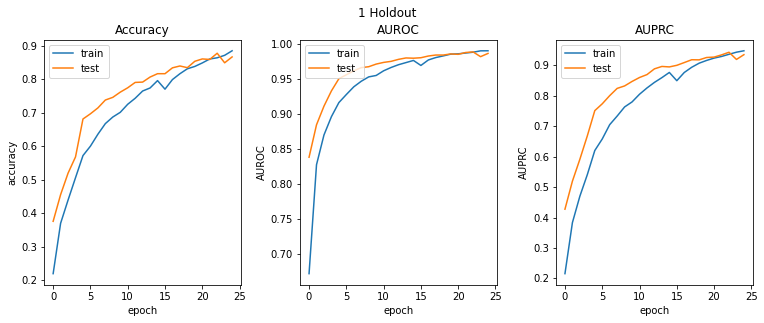

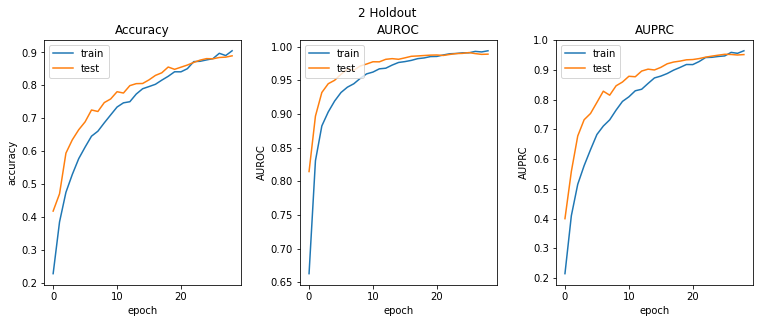

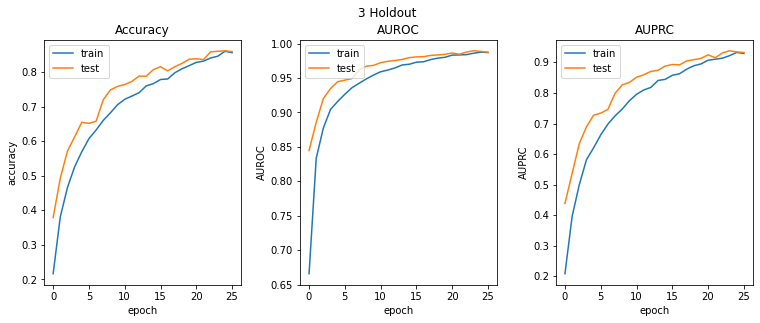

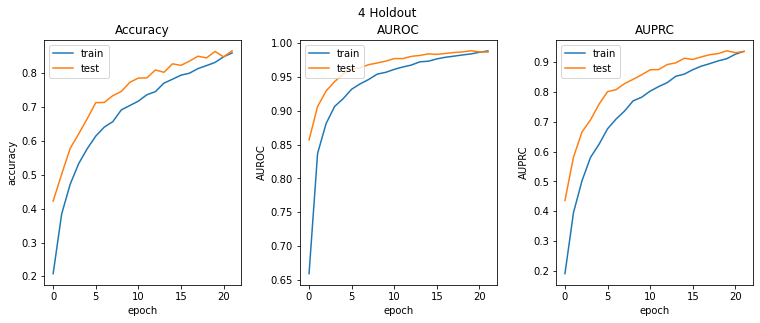

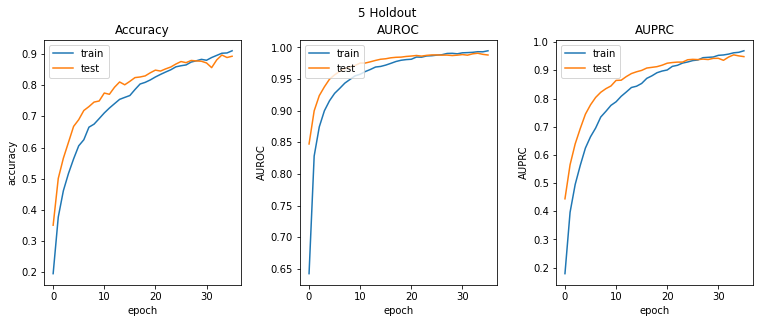

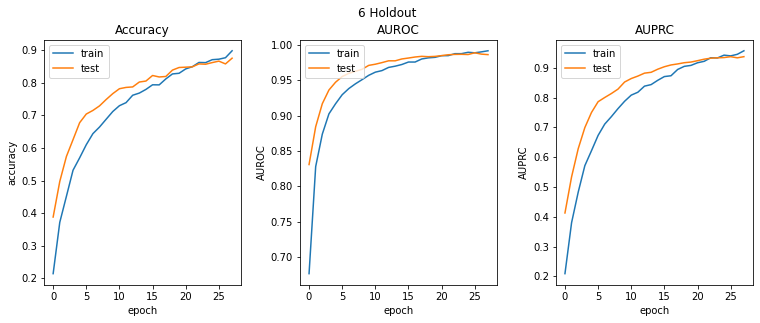

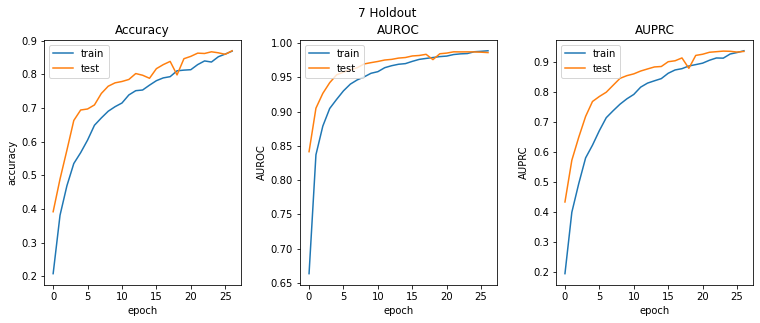

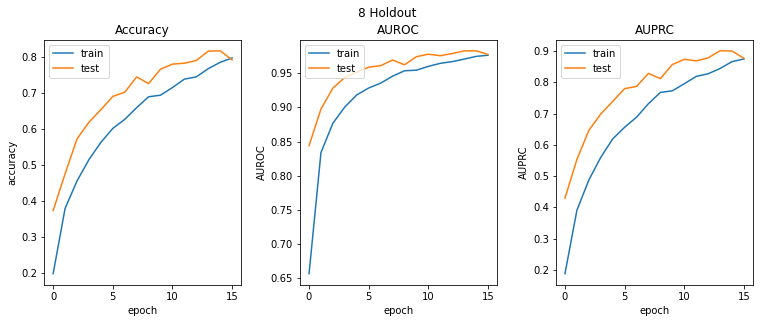

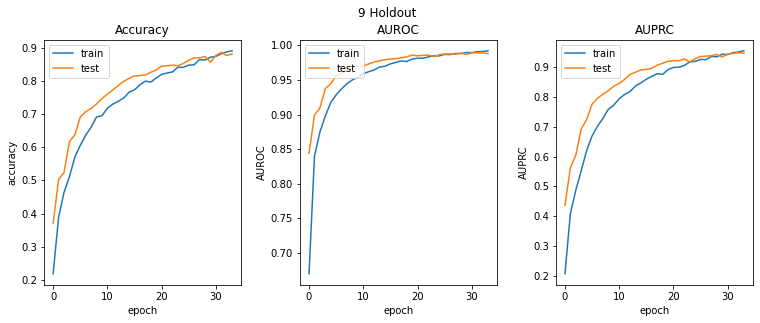

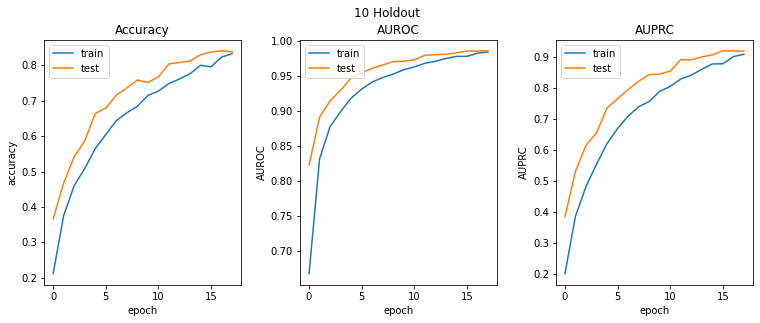

In [146]:
MMNN_metrics_estimate = model_metrics_holdout_estimate(MMNN_metrics, number_of_splits)
print(f"MMNN Metrics - {number_of_splits}-holdouts estimate:")
print(f"Accuracy : train - {MMNN_metrics_estimate['accuracy_train']}  --  test - {MMNN_metrics_estimate['accuracy_test']}")
print(f"AUROC : train - {MMNN_metrics_estimate['AUROC_train']}  --  test - {MMNN_metrics_estimate['AUROC_test']}")
print(f"AUPRC : train - {MMNN_metrics_estimate['AUPRC_train']}  --  test - {MMNN_metrics_estimate['AUPRC_test']}")
print("-"*80)
print("MMNN - Train history:")
plot_train_history(MMNN_history)

### Complete results visualization - Barplots
Hereby all the **results** from all the different architectures designed are grouped and visualized via barplots.

The following cells format the results for the barplot visualization.

In [229]:
results = {"model":[], "accuracy":[], "AUROC":[], "AUPRC":[]}

In [230]:
# MLP
for metrics, model in ((MLP_fixed_metrics, "Fixed MLP"), (MLP_tuned_metrics, "Tuned MLP"), (MLP_other_features_metrics, "No Mfccs MLP")):
    for window in ("window_30s", "window_3s"):
        for holdout in (metrics[window]):
            results["model"].append(model + "_" + window)
            results["accuracy"].append(holdout["test_evaluation"]["accuracy"])
            results["AUROC"].append(holdout["test_evaluation"]["AUROC"])
            results["AUPRC"].append(holdout["test_evaluation"]["AUPRC"])

In [231]:
# CNN and MMNN
for metrics, model in ((CNN_MelS_30s_metrics, "30s Mel spectrogram CNN"), (CNN_S_3s_metrics, "3s Spectrogram CNN"), (CNN_MelS_3s_metrics, "3s Mel spectrogram CNN"), (CNN_mfccs_3s_metrics, "3s Mfccs CNN"), (MMNN_metrics, "MMNN")):
    for holdout in metrics:
        results["model"].append(model)
        results["accuracy"].append(holdout["test_evaluation"]["accuracy"])
        results["AUROC"].append(holdout["test_evaluation"]["AUROC"])
        results["AUPRC"].append(holdout["test_evaluation"]["AUPRC"])

In [182]:
resultsDF = pd.DataFrame(results)
resultsDF

,model,accuracy,AUROC,AUPRC
0,Fixed MLP_window_30s,0.675000,0.939958,0.716022
1,Fixed MLP_window_30s,0.655000,0.942044,0.728116
2,Fixed MLP_window_30s,0.630000,0.917342,0.655936
3,Fixed MLP_window_30s,0.715000,0.959424,0.803921
4,Fixed MLP_window_30s,0.630000,0.937732,0.706818
...,...,...,...,...
105,MMNN,0.875313,0.986416,0.937027
106,MMNN,0.869805,0.986065,0.936040
107,MMNN,0.791688,0.977679,0.877112
108,MMNN,0.881823,0.988001,0.945829


Rendering barplots:   0%|                                                                        | 0/3 [00:00<…

((<Figure size 2400x660 with 1 Axes>,
  <Figure size 2400x660 with 1 Axes>,
  <Figure size 2400x660 with 1 Axes>),
 (array([<AxesSubplot:title={'center':'AUROC'}, xlabel='AUROC'>],
        dtype=object),
  array([<AxesSubplot:title={'center':'Accuracy'}, xlabel='Accuracy'>],
        dtype=object),
  array([<AxesSubplot:title={'center':'AUPRC'}, xlabel='AUPRC'>],
        dtype=object)))

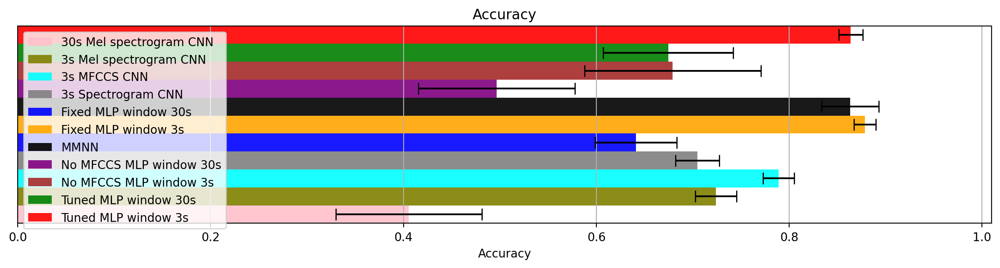

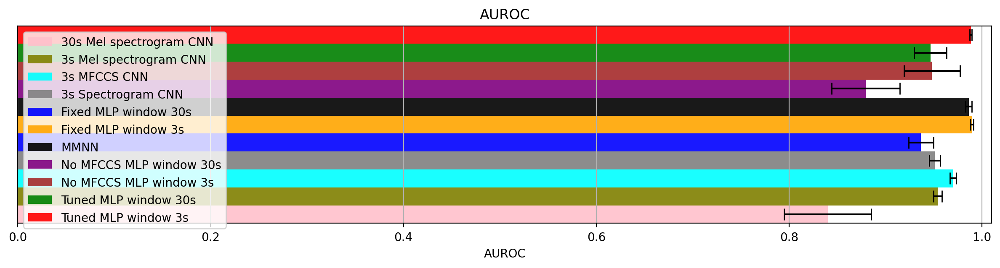

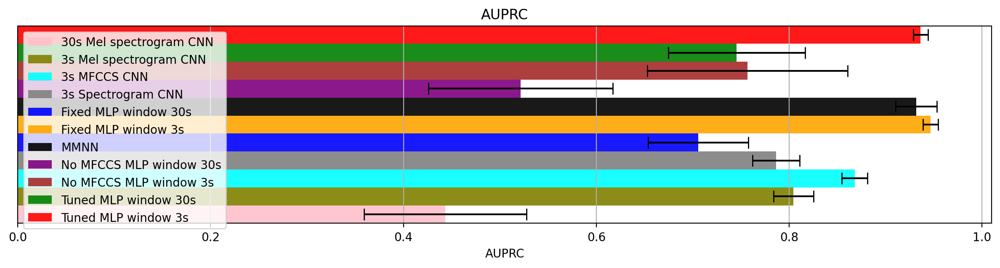

In [185]:
from barplots import barplots

barplots(
    resultsDF,
    groupby=["model"],
    orientation="horizontal",
    height=12,
    colors={
        'Fixed MLP_window_30s':'blue',
        'Fixed MLP_window_3s':'orange',
        'Tuned MLP_window_30s':'green',
        'Tuned MLP_window_3s':'red',
        'No Mfccs MLP window 30s':'purple',
        'No Mfccs MLP window 3s':'brown',
        '30s Mel spectrogram CNN':'pink',
        '3s Spectrogram CNN':'gray',
        '3s Mel spectrogram CNN':'olive',
        '3s Mfccs CNN':'cyan',
        'MMNN':'black'}
)